# Título: Previsão de Dados Climatológicos utilizando modelos de Machine Learning

### Aluno: Marciano Machado Saraiva
Este notebook é referente ao Trabalho de Conclusão de Curso em Ciência de Dados e Big Data da Pontifícia Universidade Católica de Minas Gerais.

# Conjunto de dados utilizados

* [Estações Meteorológicas Convencionais do INMET (1961-2019)](https://www.kaggle.com/saraivaufc/conventional-weather-stations-brazil) 
* [Estações Meteorológicas Automáticas do INMET (2000-2019)](https://www.kaggle.com/saraivaufc/automatic-weather-stations-brazil) 
* [Estações Meteorológicas Automáticas do LabMet (2007-2020)](https://www.kaggle.com/saraivaufc/automatic-weather-stations-labmet) 

# Processamento e Tratamento dos Dados

## Configurando o ambiente de execução

Você pode configurar um ambiente local com Hadoop e Spark utilizando o Docker disponível em: https://github.com/saraivaufc/bigdata-docker

## Crie uma seção Spark

In [1]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Application") \
    .config("spark.executor.cores", "16") \
    .config("spark.executor.memory", "20G") \
    .getOrCreate()

# Bibliotecas utilizadas

In [2]:
import os
import gc


# Bibliotecas básicas de data science
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import tqdm

# Bibliotecas do PySpark
from pyspark.sql import SparkSession
import pyspark.sql.functions as func
import pyspark.sql.types as types
from pyspark import StorageLevel

# Bibliotecas utilizadas para o modelo AUTO ARIMA
import pmdarima as pm
from pmdarima.arima import auto_arima, ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf, adfuller
#from statsmodels.tsa.arima.model import ARIMA

# Bibliotecas utilizadas para o modelo LSTM
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow import keras
from sklearn.metrics import mean_squared_error
import joblib
from sklearn.preprocessing import MinMaxScaler

register_matplotlib_converters()

# Configure o caminho para seu conjunto de dados

In [3]:
dataset_path = "hdfs://hadoop-master:9000/user/spark/"

# Estações Convencionais do INMET

In [6]:
conventional_station_codes_path = dataset_path + 'conventional_stations_codes.csv'
conventional_station_data_path = dataset_path + 'conventional_weather_stations_inmet_brazil_1961_2019.csv'

In [7]:
conventional_station_codes = spark.read.csv(conventional_station_codes_path, sep=';', header=True, inferSchema=True)

In [470]:
conventional_station_codes.count()

265

In [8]:
status_operation_norm_func = func.udf(lambda x: True if x.lower() == 'Estação Operante'.lower() else False, returnType=types.BooleanType())


norm_conventional_station_codes = conventional_station_codes \
    .withColumn('code', conventional_station_codes.code.cast(types.StringType() )) \
    .withColumn('status_operation', status_operation_norm_func('status_operation')) \
    .withColumn('start_operation', func.to_timestamp('start_operation', 'dd/MM/yyyy')) \
    .withColumn('type', func.lit(1)) \
    [['name', 'code', 'type', 'latitude', 'longitude', 'altitude', 'status_operation', 'start_operation']]

norm_conventional_station_codes.toPandas()

,name,code,type,latitude,longitude,altitude,status_operation,start_operation
0,ACARAU - CE,82294,1,-2.88,-40.14,16.50,False,1923-01-01
1,AGUA BRANCA - AL,82989,1,-9.28,-37.90,605.34,True,1928-05-05
2,AIMORES - MG,83595,1,-19.49,-41.07,82.74,True,1972-06-01
3,ALAGOINHAS - BA,83249,1,-12.14,-38.42,130.92,True,1931-01-01
4,ALTAMIRA - PA,82353,1,-3.21,-52.21,74.04,True,1927-04-24
...,...,...,...,...,...,...,...,...
260,VICOSA - MG,83642,1,-20.76,-42.86,712.20,True,1919-10-01
261,VITORIA - ES,83648,1,-20.31,-40.31,36.20,True,1923-11-20
262,VITORIA DA CONQUISTA - BA,83344,1,-14.88,-40.79,874.81,True,1936-01-01
263,VOTUPORANGA - SP,83623,1,-20.41,-49.98,502.50,True,1976-07-05


In [9]:
conventional_station_data = spark.read \
    .csv(conventional_station_data_path, sep=';', header=True, inferSchema=True)

## Tipo dos dados das colunas

In [10]:
conventional_station_data.dtypes

[('Estacao', 'int'),
 ('Data', 'string'),
 ('Hora', 'int'),
 ('Precipitacao', 'double'),
 ('TempBulboSeco', 'double'),
 ('TempBulboUmido', 'double'),
 ('TempMaxima', 'double'),
 ('TempMinima', 'double'),
 ('UmidadeRelativa', 'double'),
 ('PressaoAtmEstacao', 'double'),
 ('PressaoAtmMar', 'double'),
 ('DirecaoVento', 'double'),
 ('VelocidadeVento', 'double'),
 ('Insolacao', 'double'),
 ('Nebulosidade', 'double'),
 ('Evaporacao Piche', 'double'),
 ('Temp Comp Media', 'double'),
 ('Umidade Relativa Media', 'double'),
 ('Velocidade do Vento Media', 'double'),
 ('_c19', 'string')]

## Quantidade total de registros

In [10]:
conventional_station_data_count = conventional_station_data.count()
conventional_station_data_count

12251335

## Quantidade de registros nulos

In [9]:
conventional_station_data_count_by_variable = conventional_station_data\
    .agg(
        func.sum(func.when(func.col("TempMaxima").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("TempMaxima"),
        func.sum(func.when(func.col("TempMinima").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("TempMinima"),
        func.sum(func.when(func.col("Temp Comp Media").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Temp Comp Media"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos (Qtd)'})

conventional_station_data_count_by_variable['Registros nulos (%)'] = (conventional_station_data_count_by_variable['Registros nulos (Qtd)'] / conventional_station_data_count) * 100
conventional_station_data_count_by_variable

NameError: name 'conventional_station_data_count' is not defined

## Renomeia as colunas e converte o tipo dos dados

In [11]:
norm_conventional_station_data = conventional_station_data \
    .withColumnRenamed('Estacao','station_code') \
    .withColumnRenamed('Data','date') \
    .withColumnRenamed('TempMaxima','Tmax') \
    .withColumnRenamed('TempMinima','Tmin') \
    .withColumnRenamed('Temp Comp Media','Tmean') \
    .withColumn('station_code', func.col('station_code').cast(types.StringType() )) \
    .withColumn('date', func.to_date('date', 'dd/MM/yyyy'))  \
    [['station_code', 'date', 'Tmax', 'Tmin', 'Tmean']]

## Convertendo o dado para frequência diária

In [12]:
norm_conventional_station_data = norm_conventional_station_data \
    .groupBy('station_code', 'date') \
    .agg(
        func.first('Tmax', ignorenulls=True).cast(types.FloatType()).alias('Tmax'),
        func.first('Tmin', ignorenulls=True).cast(types.FloatType()).alias('Tmin'), 
        func.first('Tmean', ignorenulls=True).cast(types.FloatType()).alias('Tmean')
    )

norm_conventional_station_data.head(4)

[Row(station_code='82024', date=datetime.date(1962, 2, 20), Tmax=30.899999618530273, Tmin=22.799999237060547, Tmean=27.6200008392334),
 Row(station_code='82024', date=datetime.date(1970, 2, 24), Tmax=31.899999618530273, Tmin=22.799999237060547, Tmean=27.780000686645508),
 Row(station_code='82024', date=datetime.date(1972, 3, 24), Tmax=33.79999923706055, Tmin=24.5, Tmean=28.1200008392334),
 Row(station_code='82024', date=datetime.date(1972, 4, 20), Tmax=29.0, Tmin=21.0, Tmean=24.65999984741211)]

## Conta a quantidade de registro diários

In [54]:
norm_conventional_station_data_count = norm_conventional_station_data.count()
norm_conventional_station_data_count

4216937

## Conta a quantidade de registro nulos diários

In [55]:
norm_conventional_station_data_count_by_variable = norm_conventional_station_data\
    .agg(
        func.sum(func.when(func.col("Tmax").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmax"),
        func.sum(func.when(func.col("Tmin").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmin"),
        func.sum(func.when(func.col("Tmean").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmean"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos diários (Qtd)'})

norm_conventional_station_data_count_by_variable['Registros nulos diários (%)'] = (norm_conventional_station_data_count_by_variable['Registros nulos diários (Qtd)'] / norm_conventional_station_data_count) * 100
norm_conventional_station_data_count_by_variable

,Registros nulos diários (Qtd),Registros nulos diários (%)
Tmax,266015,6.308252
Tmin,257801,6.113466
Tmean,494176,11.718838


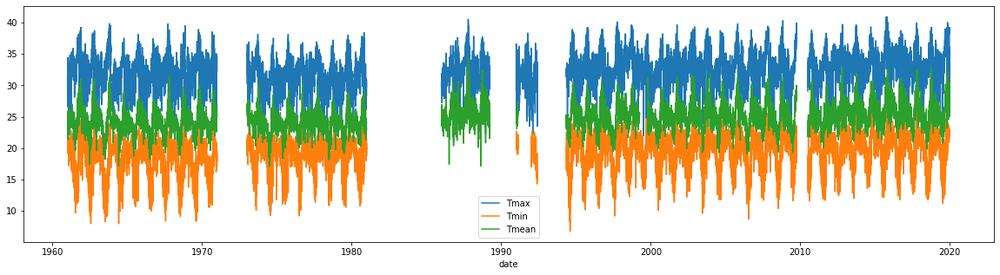

In [80]:
# BARREIRAS - BA
norm_conventional_station_data \
    .filter('station_code = "83236" ') \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

# Estações Automáticas do INMET

In [14]:
automatic_station_codes_path = dataset_path + 'automatic_stations_codes.csv'
automatic_station_data_path = dataset_path + 'automatic_weather_stations_inmet_brazil_2000_2019.csv'

In [472]:
automatic_station_codes = spark.read.csv(automatic_station_codes_path, sep=';', header=True, inferSchema=True)

In [473]:
automatic_station_codes.count()

610

In [12]:
norm_automatic_station_codes = automatic_station_codes \
    .withColumnRenamed('CODIGO','code') \
    .withColumnRenamed('LATITUDE','latitude') \
    .withColumnRenamed('LONGITUDE','longitude') \
    .withColumnRenamed('ALTITUDE','altitude') \
    .withColumn('name', func.concat(func.col('ESTACAO'), func.lit(" - "),func.col('UF')))\
    .withColumn('type', func.lit(2)) \
    [['name', 'code', 'type', 'latitude', 'longitude', 'altitude']]

norm_automatic_station_codes.toPandas()

,name,code,type,latitude,longitude,altitude
0,BRASILIA - DF,A001,2,-15.789444,-47.925833,1159.54
1,SALVADOR - BA,A401,2,-13.016667,-38.516667,51.41
2,MANAUS - AM,A101,2,-3.103333,-60.016389,61.25
3,ECOLOGIA AGRICOLA - RJ,A601,2,-22.800000,-43.683333,33.00
4,PORTO ALEGRE - RS,A801,2,-30.050000,-51.166667,46.97
...,...,...,...,...,...,...
605,SAO SIMAO - SP,A770,2,-21.461111,-47.579444,620.00
606,GOIOERE - PR,A825,2,-24.158333,-53.030556,452.34
607,CAPAO DO LEAO (PELOTAS) - RS,A887,2,-31.802500,-52.407222,13.00
608,CHAPECO - SC,A895,2,-27.955278,-52.635556,680.00


In [13]:
automatic_station_data = spark.read \
    .csv(automatic_station_data_path, sep=';', header=True, inferSchema=True)

## Tipo dos dados das colunas

In [14]:
automatic_station_data.dtypes

[('ESTACAO', 'string'),
 ('DATA (YYYY-MM-DD)', 'string'),
 ('HORA (UTC)', 'int'),
 ('PRECIPITACAO TOTAL HORARIO (mm)', 'double'),
 ('PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)', 'double'),
 ('PRESSAO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)', 'double'),
 ('PRESSAO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)', 'double'),
 ('RADIACAO GLOBAL (W/m2)', 'double'),
 ('TEMPERATURA DO AR - BULBO SECO, HORARIA (C)', 'double'),
 ('TEMPERATURA DO PONTO DE ORVALHO (C)', 'double'),
 ('TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)', 'double'),
 ('TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)', 'double'),
 ('TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (C)', 'double'),
 ('TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (C)', 'double'),
 ('UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)', 'double'),
 ('UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)', 'double'),
 ('UMIDADE RELATIVA DO AR, HORARIA (%)', 'double'),
 ('VENTO, DIRECAO HORARIA (gr)', 'double'),
 ('VENTO, RAJADA MAXIMA (m/s)', 'double'),
 ('VENTO, VELOCIDADE HO

## Conta a quantidade de registros

In [23]:
automatic_station_data_count = automatic_station_data.count()
automatic_station_data_count

54840384

## Converte os valores -9999 para nulos

In [15]:
def drop_nodata_func_(x, nodata, default=None):
    return default if not x is None and x == nodata else x

drop_nodata_func = func.udf(drop_nodata_func_, returnType=types.FloatType())

automatic_station_data = automatic_station_data \
    .withColumn('`TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)`', drop_nodata_func(func.col("`TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)`"), func.lit(-9999))) \
    .withColumn('`TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)`', drop_nodata_func(func.col("`TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)`"), func.lit(-9999))) \
    .withColumn('`TEMPERATURA DO AR - BULBO SECO, HORARIA (C)`', drop_nodata_func(func.col("`TEMPERATURA DO AR - BULBO SECO, HORARIA (C)`"), func.lit(-9999))) \

## Conta a quantidade de registros nulos

In [25]:
automatic_station_data_count_by_variable = automatic_station_data\
    .agg(
        func.sum(func.when(func.col('`TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)`').isNull(), func.lit(1)).otherwise(func.lit(0))).alias('TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)'),
        func.sum(func.when(func.col('`TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)`').isNull(), func.lit(1)).otherwise(func.lit(0))).alias('TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)'),
        func.sum(func.when(func.col('`TEMPERATURA DO AR - BULBO SECO, HORARIA (C)`').isNull(), func.lit(1)).otherwise(func.lit(0))).alias('TEMPERATURA DO AR - BULBO SECO, HORARIA (C)'),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos (Qtd)'})

automatic_station_data_count_by_variable['Registros nulos (%)'] = (automatic_station_data_count_by_variable['Registros nulos (Qtd)'] / conventional_station_data_count) * 100
automatic_station_data_count_by_variable

,Registros nulos (Qtd),Registros nulos (%)
TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C),496231,4.050424
TEMPERATURA MINIMA NA HORA ANT. (AUT) (C),496396,4.051771
"TEMPERATURA DO AR - BULBO SECO, HORARIA (C)",493102,4.024884


## Renomeia as colunas e converte o tipo dos dados

In [16]:
norm_automatic_station_data = automatic_station_data \
    .withColumnRenamed('ESTACAO', 'station_code') \
    .withColumnRenamed('`TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C)`', 'Tmax') \
    .withColumnRenamed('`TEMPERATURA MINIMA NA HORA ANT. (AUT) (C)`', 'Tmin') \
    .withColumnRenamed('`TEMPERATURA DO AR - BULBO SECO, HORARIA (C)`', 'Tdry') \
    .withColumn('date', func.to_date('DATA (YYYY-MM-DD)', 'yyyy-MM-dd')) \
    [['station_code', 'date', 'Tmax', 'Tmin', 'Tdry']]
    
norm_automatic_station_data.head(n=5)

[Row(station_code='A001', date=datetime.date(2000, 5, 7), Tmax=None, Tmin=None, Tdry=None),
 Row(station_code='A001', date=datetime.date(2000, 5, 7), Tmax=None, Tmin=None, Tdry=None),
 Row(station_code='A001', date=datetime.date(2000, 5, 7), Tmax=None, Tmin=None, Tdry=None),
 Row(station_code='A001', date=datetime.date(2000, 5, 7), Tmax=None, Tmin=None, Tdry=None),
 Row(station_code='A001', date=datetime.date(2000, 5, 7), Tmax=None, Tmin=None, Tdry=None)]

## Converte de dados horários para dados diários

In [17]:
norm_automatic_station_data = norm_automatic_station_data \
    .groupBy('station_code', 'date') \
    .agg(
        func.max('Tmax').cast(types.FloatType()).alias('Tmax'), 
        func.min('Tmin').cast(types.FloatType()).alias('Tmin'), 
        func.avg('Tdry').cast(types.FloatType()).alias('Tmean'), 
    )

## Conta a quantidade de dados diários

In [28]:
norm_automatic_station_data_count = norm_automatic_station_data.count()
norm_automatic_station_data_count

2072346

## Conta a quantidade de dados nulos diários

In [29]:
norm_automatic_station_data_count_by_variable = norm_automatic_station_data\
    .agg(
        func.sum(func.when(func.col("Tmax").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmax"),
        func.sum(func.when(func.col("Tmin").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmin"),
        func.sum(func.when(func.col("Tmean").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmean"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos diários (Qtd)'})

norm_automatic_station_data_count_by_variable['Registros nulos diários (%)'] = (norm_automatic_station_data_count_by_variable['Registros nulos diários (Qtd)'] / norm_automatic_station_data_count) * 100
norm_automatic_station_data_count_by_variable

,Registros nulos diários (Qtd),Registros nulos diários (%)
Tmax,125226,6.042717
Tmin,125226,6.042717
Tmean,125014,6.032487


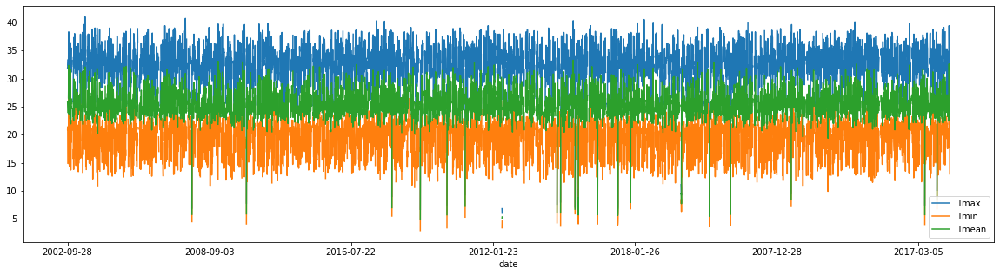

In [104]:
# BARREIRAS - BA
norm_automatic_station_data \
    .filter('station_code = "A402" ') \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

# Estações Automáticas do LabMet

In [18]:
labmet_automatic_station_codes_path = dataset_path + 'labmet_automatic_stations_codes.csv'
labmet_automatic_station_data_path = dataset_path + 'labmet_automatic_stations_2007-04-01_2019-12-31.csv'

In [19]:
labmet_automatic_station_codes = spark.read.csv(labmet_automatic_station_codes_path, sep=';', quote='"', header=True, inferSchema=True)
labmet_automatic_station_codes.toPandas()

,Codigo,Instituicao,Campus,Latitude,Longitude,Altitude
0,712f3e11658051636f09732a60fb3c1b,Universidade Federal do Vale do São Francisco ...,Petrolina – PE,9.324444,40.559444,393
1,324c5d9515e62e6c98721e3db49a0da0,Universidade Federal do Vale do São Francisco ...,Campus Juazeiro – BA,9.410556,40.514167,356
2,80b38b692dd31617bc8c5cdb83c29b4b,Universidade Federal do Vale do São Francisco ...,Juazeiro – BA,9.448889,40.524167,356


In [20]:
labmet_norm_automatic_station_codes = labmet_automatic_station_codes \
    .withColumnRenamed('Codigo','code') \
    .withColumnRenamed('Latitude','latitude') \
    .withColumnRenamed('Longitude','longitude') \
    .withColumnRenamed('Altitude','altitude') \
    .withColumnRenamed('Campus','name') \
    .withColumn('altitude', func.col('altitude').cast(types.DoubleType())) \
    .withColumn('type', func.lit(2)) \
    [['name', 'code', 'type', 'latitude', 'longitude', 'altitude']]

labmet_norm_automatic_station_codes.toPandas()

,name,code,type,latitude,longitude,altitude
0,Petrolina – PE,712f3e11658051636f09732a60fb3c1b,2,9.324444,40.559444,393.0
1,Campus Juazeiro – BA,324c5d9515e62e6c98721e3db49a0da0,2,9.410556,40.514167,356.0
2,Juazeiro – BA,80b38b692dd31617bc8c5cdb83c29b4b,2,9.448889,40.524167,356.0


In [21]:
labmet_automatic_station_data = spark.read \
    .csv(labmet_automatic_station_data_path, sep=';', header=True, inferSchema=True)\

## Tipo dos dados das colunas

In [22]:
labmet_automatic_station_data.dtypes

[('chuva diaria', 'double'),
 ('Estacao', 'string'),
 ('Data', 'string'),
 ('evap. de referencia', 'double'),
 ('rad. solar global', 'double'),
 ('temperatura', 'double'),
 ('temperatura maxima', 'double'),
 ('temperatura minima', 'double'),
 ('umidade', 'string'),
 ('umidade maxima', 'double'),
 ('umidade minima', 'double'),
 ('vento maxima 10m', 'double')]

## Quantidade total de registros

In [23]:
labmet_automatic_station_data_count = labmet_automatic_station_data.count()
labmet_automatic_station_data_count

9892

## Quantidade de registros nulos

In [24]:
labmet_automatic_station_data_count_by_variable = labmet_automatic_station_data\
    .agg(
        func.sum(func.when(func.col("temperatura maxima").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("temperatura maxima"),
        func.sum(func.when(func.col("temperatura minima").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("temperatura minima"),
        func.sum(func.when(func.col("temperatura").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("temperatura"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos (Qtd)'})

labmet_automatic_station_data_count_by_variable['Registros nulos (%)'] = (labmet_automatic_station_data_count_by_variable['Registros nulos (Qtd)'] / labmet_automatic_station_data_count) * 100
labmet_automatic_station_data_count_by_variable

,Registros nulos (Qtd),Registros nulos (%)
temperatura maxima,1,0.010109
temperatura minima,0,0.000000
temperatura,2,0.020218


In [25]:
labmet_norm_automatic_station_data = labmet_automatic_station_data \
    .withColumnRenamed('Estacao', 'station_code') \
    .withColumn('date', func.to_date('Data', 'yyyy-MM-dd')) \
    .withColumn('Tmax', func.col('temperatura maxima').cast(types.FloatType())) \
    .withColumn('Tmin', func.col('temperatura minima').cast(types.FloatType())) \
    .withColumn('Tmean', func.col('temperatura').cast(types.FloatType())) \
    [['station_code', 'date', 'Tmax', 'Tmin', 'Tmean']]
    
labmet_norm_automatic_station_data.head(n=5)

[Row(station_code='712f3e11658051636f09732a60fb3c1b', date=datetime.date(2007, 4, 1), Tmax=34.939998626708984, Tmin=20.329999923706055, Tmean=27.170000076293945),
 Row(station_code='712f3e11658051636f09732a60fb3c1b', date=datetime.date(2007, 4, 2), Tmax=33.060001373291016, Tmin=20.260000228881836, Tmean=25.969999313354492),
 Row(station_code='712f3e11658051636f09732a60fb3c1b', date=datetime.date(2007, 4, 3), Tmax=33.68000030517578, Tmin=19.940000534057617, Tmean=26.079999923706055),
 Row(station_code='712f3e11658051636f09732a60fb3c1b', date=datetime.date(2007, 4, 4), Tmax=33.91999816894531, Tmin=18.81999969482422, Tmean=25.829999923706055),
 Row(station_code='712f3e11658051636f09732a60fb3c1b', date=datetime.date(2007, 4, 5), Tmax=35.02000045776367, Tmin=18.579999923706055, Tmean=26.719999313354492)]

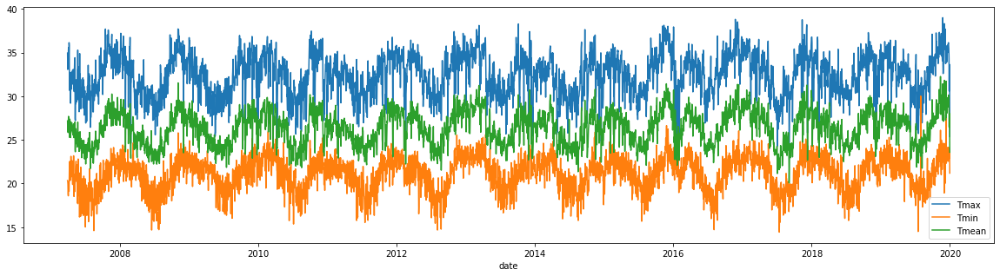

In [26]:
# Petrolina - PE
labmet_norm_automatic_station_data \
    .filter('station_code = "712f3e11658051636f09732a60fb3c1b" ') \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

# Combinandos dos conjuntos de dados

In [27]:
def harmonize_schemas_and_combine(df_left, df_right):
    left_types = {f.name: f.dataType for f in df_left.schema}
    right_types = {f.name: f.dataType for f in df_right.schema}
    left_fields = set((f.name, f.dataType, f.nullable) for f in df_left.schema)
    right_fields = set((f.name, f.dataType, f.nullable) for f in df_right.schema)

    # First go over left-unique fields
    for l_name, l_type, l_nullable in left_fields.difference(right_fields):
        if l_name in right_types:
            r_type = right_types[l_name]
            if l_type != r_type:
                raise TypeError("Union failed. Type conflict on field %s. left type %s, right type %s" % (l_name, l_type, r_type))
            else:
                raise TypeError("Union failed. Nullability conflict on field %s. left nullable %s, right nullable %s"  % (l_name, l_nullable, not(l_nullable)))

        df_right = df_right.withColumn(l_name, func.lit(None).cast(l_type)) 

    # Now go over right-unique fields
    for r_name, r_type, r_nullable in right_fields.difference(left_fields):
        if r_name in left_types:
            l_type = left_types[r_name]
            if r_type != l_type:
                raise TypeError("Union failed. Type conflict on field %s. right type %s, left type %s" % (r_name, r_type, l_type))
            else:
                raise TypeError("Union failed. Nullability conflict on field %s. right nullable %s, left nullable %s" % (r_name, r_nullable, not(r_nullable)))

        df_left = df_left.withColumn(r_name, func.lit(None).cast(r_type))    

    # Make sure columns are in the same order
    df_left = df_left.select(df_right.columns)

    return df_left.union(df_right)

In [28]:
norm_station_codes = harmonize_schemas_and_combine(harmonize_schemas_and_combine(norm_conventional_station_codes, norm_automatic_station_codes), labmet_norm_automatic_station_codes)
norm_station_codes.toPandas()

,name,code,type,latitude,longitude,altitude,status_operation,start_operation
0,ACARAU - CE,82294,1,-2.880000,-40.140000,16.50,False,1923-01-01
1,AGUA BRANCA - AL,82989,1,-9.280000,-37.900000,605.34,True,1928-05-05
2,AIMORES - MG,83595,1,-19.490000,-41.070000,82.74,True,1972-06-01
3,ALAGOINHAS - BA,83249,1,-12.140000,-38.420000,130.92,True,1931-01-01
4,ALTAMIRA - PA,82353,1,-3.210000,-52.210000,74.04,True,1927-04-24
...,...,...,...,...,...,...,...,...
873,CHAPECO - SC,A895,2,-27.955278,-52.635556,680.00,None,NaT
874,CAMPOS NOVOS - SC,A898,2,-27.388611,-51.215833,963.00,None,NaT
875,Petrolina – PE,712f3e11658051636f09732a60fb3c1b,2,9.324444,40.559444,393.00,None,NaT
876,Campus Juazeiro – BA,324c5d9515e62e6c98721e3db49a0da0,2,9.410556,40.514167,356.00,None,NaT


In [32]:
print(norm_conventional_station_data.dtypes, '\n\n')
print(norm_automatic_station_data.dtypes, '\n\n')
print(labmet_norm_automatic_station_data.dtypes)

[('station_code', 'string'), ('date', 'date'), ('Tmax', 'float'), ('Tmin', 'float'), ('Tmean', 'float')] 


[('station_code', 'string'), ('date', 'date'), ('Tmax', 'float'), ('Tmin', 'float'), ('Tmean', 'float')] 


[('station_code', 'string'), ('date', 'date'), ('Tmax', 'float'), ('Tmin', 'float'), ('Tmean', 'float')]


In [33]:
norm_station_data = harmonize_schemas_and_combine(harmonize_schemas_and_combine(norm_conventional_station_data, norm_automatic_station_data), labmet_norm_automatic_station_data)

In [34]:
norm_station_data.dtypes

[('station_code', 'string'),
 ('date', 'date'),
 ('Tmax', 'float'),
 ('Tmin', 'float'),
 ('Tmean', 'float')]

## Exporta dado combinado

In [4]:
norm_station_codes_path = dataset_path + 'norm_station_codes.csv'
norm_station_data_path = dataset_path + 'norm_station_data.csv'
norm_station_data_with_gaps_path = dataset_path + 'norm_station_data_with_gaps.csv'

In [37]:
norm_station_codes.write \
    .format('csv') \
    .option('header',True) \
    .mode('overwrite') \
    .option('sep',';')\
    .save(norm_station_codes_path)

norm_station_data.write \
    .format('csv') \
    .option('header',True) \
    .mode('overwrite') \
    .option('sep',';')\
    .save(norm_station_data_path)

In [5]:
norm_station_codes = spark.read.csv(norm_station_codes_path, sep=';', header=True, inferSchema=True)
norm_station_data = spark.read.csv(norm_station_data_path, sep=';', header=True, inferSchema=True)

## Adiciona as datas com dados vazios nas séries que foram perdidas durante as agregações

Durante as agregações, períodos com datas em que todos os campos analisados estavam ausentes foram retirados, e isso pode afetar nossa quantidade de dados ausêntes. Esta etapa busca adicionar novamente essas datas, mas ainda com todos os valores ausentes. 

In [ ]:
station_codes = [x.station_code for x in norm_station_data.select('station_code').distinct().collect()]

step = 60 * 60 * 24

norm_station_data_with_gaps = []
    
for station_code in tqdm.tqdm(station_codes):
    d = norm_station_data \
        .filter(func.col('station_code') == station_code) \
        .sort('date')

    minp, maxp = d.select(func.min("date").cast("timestamp").cast("long"), 
                          func.max("date").cast("timestamp").cast("long")).first()

    reference = spark.range((minp / step) * step, ((maxp / step) + 1) * step, step)\
        .select(func.col("id").cast("timestamp").alias("date"))

    data_with_gaps = reference.join(d, ["date"], "leftouter").sort('date').collect()
    norm_station_data_with_gaps.extend(data_with_gaps)

 41%|████      | 356/878 [26:40<2:49:58, 19.54s/it]

In [113]:
schema = types.StructType([       
    types.StructField('date', types.DateType(), True),
    types.StructField('station_code', types.StringType(), True),
    types.StructField('Tmax', types.DoubleType(), True),
    types.StructField('Tmin', types.DoubleType(), True),
    types.StructField('Tmean', types.DoubleType(), True)
])

norm_station_data_with_gaps_df = spark.createDataFrame(data=norm_station_data_with_gaps, schema=schema)

norm_station_data_with_gaps_df.write \
    .format('csv') \
    .option('header',True) \
    .mode('overwrite') \
    .option('sep',';')\
    .save(norm_station_data_with_gaps_path)

In [59]:
norm_station_data = spark.read.csv(norm_station_data_with_gaps_path, sep=';', header=True, inferSchema=True)

# Analisando dados inconsistentes

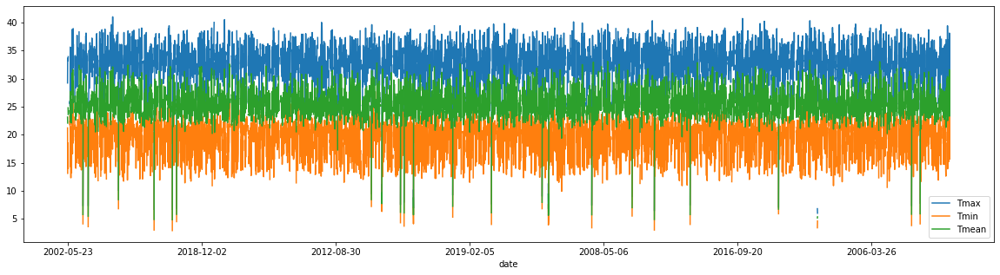

In [6]:
norm_station_data \
    .filter('station_code = "A402" ') \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

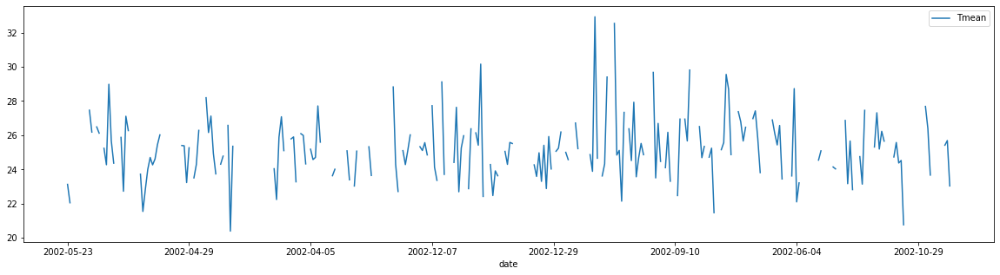

In [475]:
# Barreiras - BA (com problema)
norm_station_data \
    .filter('station_code = "A402" ') \
    .filter(func.col("date") > func.lit("2002-01-01")) \
    .filter(func.col("date") < func.lit("2003-01-01")) \
    .toPandas().plot.line(x='date', y=['Tmean'], figsize=(20,5))

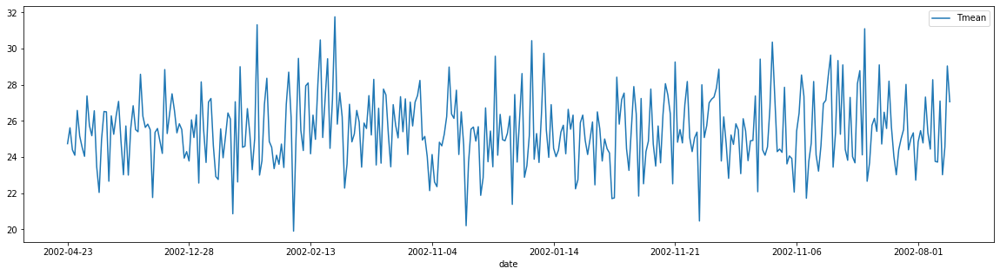

In [476]:
# Barreiras - BA (Sem problemas)
norm_station_data \
    .filter('station_code = "83236" ') \
    .filter(func.col("date") > func.lit("2002-01-01")) \
    .filter(func.col("date") < func.lit("2003-01-01")) \
    .toPandas().plot.line(x='date', y=['Tmean'], figsize=(20,5))

# Eliminando incosistências

### Inconsistência de limite

In [6]:
def drop_nodata_range_func_(x, min_value, max_value):
    if not x is None and x >= min_value and x <= max_value:
        return x
    else:
        return None

drop_nodata_range_func = func.udf(drop_nodata_range_func_, returnType=types.FloatType())

range_norm_station_data = norm_station_data \
    .withColumn('Tmax', drop_nodata_range_func(func.col('Tmax'), func.lit(-30), func.lit(50) )) \
    .withColumn('Tmin', drop_nodata_range_func(func.col('Tmin'), func.lit(-30), func.lit(50) )) \
    .withColumn('Tmean', drop_nodata_range_func(func.col('Tmean'), func.lit(-30), func.lit(50) )) \

### Inconsistência lógica

In [7]:
logic_norm_station_data = range_norm_station_data \
    .withColumn('Tmean',  func.when((func.col('Tmean') < func.col('Tmin')) | (func.col('Tmean') > func.col('Tmax')), None).otherwise(func.col('Tmean')) ) \

### Inconsistência temporal

In [8]:
from pyspark.sql.window import Window

days = lambda i: i * 86400 

w_before = (Window() \
   .partitionBy("station_code") \
   .orderBy(func.col("date").cast("timestamp").cast("long")) \
   .rangeBetween(-days(1), -days(1)))

w_after = (Window() \
   .partitionBy("station_code") \
   .orderBy(func.col("date").cast("timestamp").cast("long")) \
   .rangeBetween(days(1), days(1)))

w_last_year = (Window() \
   .partitionBy("station_code") \
   .orderBy(func.col("date").cast("timestamp").cast("long")) \
   .rangeBetween(-days(365+1), -days(365-1)))

def w_union(name):
    col_name = func.col(name)
    
    last_year_values = func.collect_list(col_name).over(w_last_year)
    before_values = func.collect_list(col_name).over(w_before)
    after_values = func.collect_list(col_name).over(w_after)
    
    return func.concat(before_values, after_values, last_year_values)

def z_score(name):
    values = w_union(name)
    return  func.when(func.col(name).isNotNull(), (func.col(name) - array_mean(values)) / array_std(values))\
               .otherwise(None)

array_mean = func.udf(lambda x: float(np.nanmean(np.array(x, dtype=np.float))), types.FloatType())
array_std = func.udf(lambda x: float(np.nanstd(np.array(x, dtype=np.float))), types.FloatType())

In [9]:
temporal_norm_station_data_with_zscore = range_norm_station_data \
    .withColumn('Tmax_zscore', z_score('Tmax')) \
    .withColumn('Tmin_zscore', z_score('Tmin')) \
    .withColumn('Tmean_zscore', z_score('Tmean')) \

In [10]:
def drop_values_by_score(col, zscore, threshold):
    return func.when(func.abs(func.coalesce(func.col(zscore), func.lit(0) )) <= threshold, func.col(col)).otherwise(None)

# does not apply in precipitation
temporal_norm_station_data = temporal_norm_station_data_with_zscore \
    .withColumn('Tmax',  drop_values_by_score('Tmax', 'Tmax_zscore', 3)) \
    .withColumn('Tmin',  drop_values_by_score('Tmin', 'Tmin_zscore', 3)) \
    .withColumn('Tmean',  drop_values_by_score('Tmean', 'Tmean_zscore', 3))

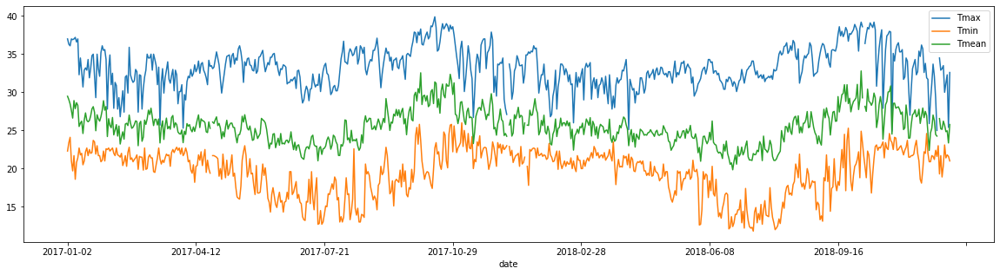

In [80]:
temporal_norm_station_data_with_zscore\
    .filter('station_code = "83236" ') \
    .filter(func.col("date") > func.lit("2017-01-01")) \
    .filter(func.col("date") < func.lit("2019-01-01")) \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

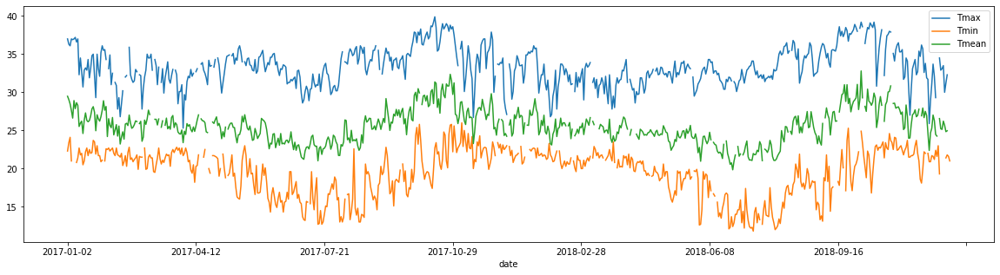

In [81]:
temporal_norm_station_data\
    .filter('station_code = "83236" ') \
    .filter(func.col("date") > func.lit("2017-01-01")) \
    .filter(func.col("date") < func.lit("2019-01-01")) \
    .toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

# Valores ausentes antes da eliminação de valores inconsistentes

In [19]:
norm_station_data_count = norm_station_data.count()
norm_station_data_count

6511845

In [20]:
norm_station_data_count_by_variable = norm_station_data\
    .agg(
        func.sum(func.when(func.col("Tmax").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmax"),
        func.sum(func.when(func.col("Tmin").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmin"),
        func.sum(func.when(func.col("Tmean").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmean"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos (Qtd)'})

norm_station_data_count_by_variable['Registros nulos (%)'] = (norm_station_data_count_by_variable['Registros nulos (Qtd)'] / norm_station_data_count) * 100
norm_station_data_count_by_variable

,Registros nulos (Qtd),Registros nulos (%)
Tmax,405830,6.232182
Tmin,397616,6.106042
Tmean,633692,9.731374


# Valores ausentes após a eliminação de valores inconsistentes

In [84]:
temporal_norm_station_data_count_by_variable = temporal_norm_station_data\
    .agg(
        func.sum(func.when(func.col("Tmax").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmax"),
        func.sum(func.when(func.col("Tmin").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmin"),
        func.sum(func.when(func.col("Tmean").isNull(), func.lit(1)).otherwise(func.lit(0))).alias("Tmean"),
    ) \
    .toPandas().transpose().rename(columns={0: 'Registros nulos (Qtd)'})

temporal_norm_station_data_count_by_variable['Registros nulos (%)'] = (temporal_norm_station_data_count_by_variable['Registros nulos (Qtd)'] / norm_station_data_count) * 100
temporal_norm_station_data_count_by_variable

,Registros nulos (Qtd),Registros nulos (%)
Tmax,789393,12.529290
Tmin,766888,12.172089
Tmean,958992,15.221175


# Análise e Exploração dos Dados

### Exibindo todas as estações utilizadas

In [18]:
norm_station_codes.toPandas()

,name,code,type,latitude,longitude,altitude,status_operation,start_operation
0,BRASILIA - DF,A001,2,-15.789444,-47.925833,1159.54,None,NaT
1,SALVADOR - BA,A401,2,-13.016667,-38.516667,51.41,None,NaT
2,MANAUS - AM,A101,2,-3.103333,-60.016389,61.25,None,NaT
3,ECOLOGIA AGRICOLA - RJ,A601,2,-22.800000,-43.683333,33.00,None,NaT
4,PORTO ALEGRE - RS,A801,2,-30.050000,-51.166667,46.97,None,NaT
...,...,...,...,...,...,...,...,...
873,VOTUPORANGA - SP,83623,1,-20.410000,-49.980000,502.50,True,1976-07-05
874,ZE DOCA - MA,82376,1,-3.260000,-45.650000,45.28,True,1970-08-25
875,Petrolina – PE,712f3e11658051636f09732a60fb3c1b,2,9.324444,40.559444,393.00,None,NaT
876,Campus Juazeiro – BA,324c5d9515e62e6c98721e3db49a0da0,2,9.410556,40.514167,356.00,None,NaT


### Quantidade de estações por estado

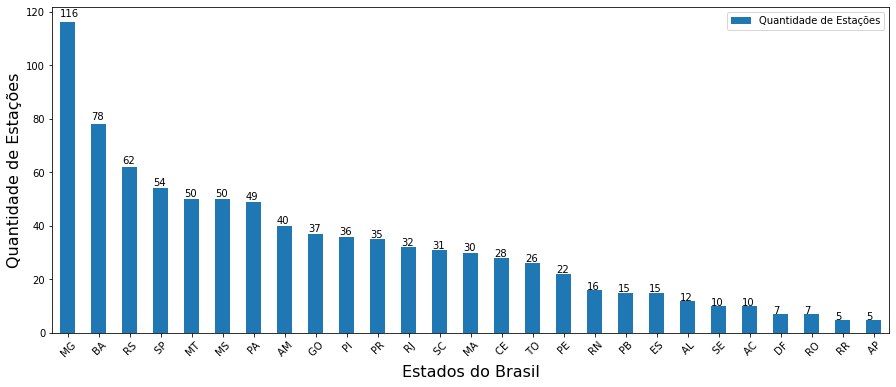

In [144]:
ax = norm_station_codes \
    .withColumn('Estado', func.when(
        func.element_at(func.split('name', '-'), -1).isNull(), 
        func.element_at(func.split('name', '–'), -1)
    ).otherwise(func.element_at(func.split(func.regexp_replace(func.col('name'), '–', '-'), '-'), -1) )) \
    .groupBy('Estado') \
    .agg(
        func.count('code').alias('Quantidade de Estações')
    ) \
    .toPandas()\
    .sort_values(by=['Quantidade de Estações'], ascending=False) \
    .plot(kind='bar', x='Estado', y='Quantidade de Estações', figsize=(15, 6), rot=45)

for p in ax.patches:
    ax.annotate("%.0f" % (p.get_height(), ), (p.get_x(), p.get_height() * 1.02))

plt.ylabel('Quantidade de Estações', fontsize=16)
plt.xlabel('Estados do Brasil', fontsize=16)
plt.savefig('figures/estacoes_por_estado.png', dpi=300)

### Disponibilidade de dados ao longo do tempo

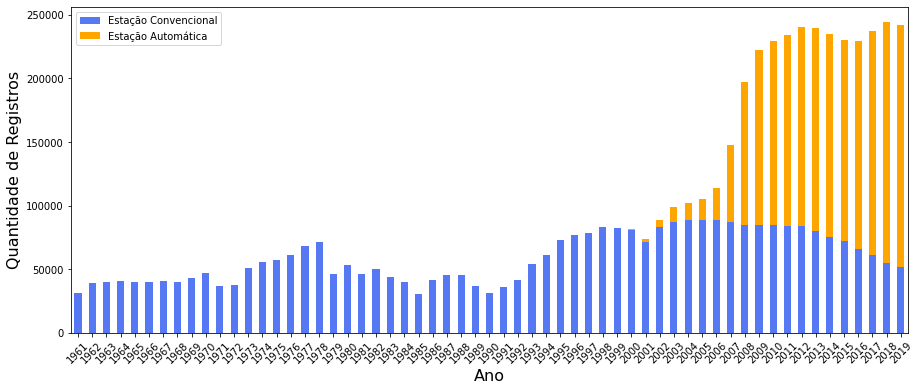

In [151]:
ax = plt.gca()

cnt_cond = lambda cond: func.sum(func.when(cond, 1).otherwise(0))

temporal_norm_station_data \
    .join(norm_station_codes.select('code', 'type'), temporal_norm_station_data.station_code == norm_station_codes.code) \
    .groupBy(func.year("date").cast(types.IntegerType()).alias("Ano")) \
    .agg(
        cnt_cond(((func.col("type") == 1) & func.col('Tmean').isNotNull())).alias('Estação Convencional'),
        cnt_cond(((func.col("type") == 2) & func.col('Tmean').isNotNull())).alias('Estação Automática')
    ).toPandas()\
    .sort_values(by=['Ano'], ascending=True)\
    .plot(kind='bar', x='Ano', stacked=True, 
          y=['Estação Convencional', 'Estação Automática'], 
          color=['#5678f2', '#FFA500'], figsize=(15,6), rot=45, ax=ax)

#ax.set_title('Disponibilidade de dados ao longo do tempo', fontsize=16)
ax.set_xlabel('Ano', fontsize=16)
ax.set_ylabel('Quantidade de Registros', fontsize=16)

plt.savefig('figures/disponibilizade_historica_de_dados.png', dpi=300, bbox_inches='tight')

### Analisando a distribuição de dados nulos  ao longo do tempo

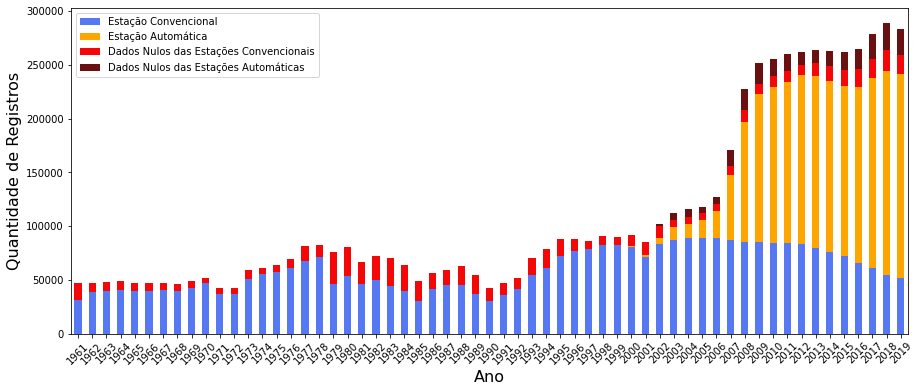

In [153]:
ax = temporal_norm_station_data \
    .join(norm_station_codes.select('code', 'type'), temporal_norm_station_data.station_code == norm_station_codes.code) \
    .groupBy(func.year("date").cast(types.IntegerType()).alias("Ano")) \
    .agg(
        cnt_cond(((func.col("type") == 1) & func.col('Tmean').isNotNull())).alias('Estação Convencional'),
        cnt_cond(((func.col("type") == 2) & func.col('Tmean').isNotNull())).alias('Estação Automática'),
        cnt_cond(((func.col("type") == 1) & func.col('Tmean').isNull())).alias('Dados Nulos das Estações Convencionais'),
        cnt_cond(((func.col("type") == 2) & func.col('Tmean').isNull())).alias('Dados Nulos das Estações Automáticas')
    ) \
    .toPandas()\
    .sort_values(by=['Ano'], ascending=True)\
    .plot(kind='bar', x='Ano', stacked=True, 
          y=['Estação Convencional', 'Estação Automática', 'Dados Nulos das Estações Convencionais', 'Dados Nulos das Estações Automáticas'], 
          color=['#5678f2', '#FFA500', '#f50707', '#6b1010'], figsize=(15,6), rot=45)

#ax.set_title('Quantidade de registros ausentes ao longo do tempo')
ax.set_xlabel('Ano', fontsize=16)
ax.set_ylabel('Quantidade de Registros', fontsize=16)

plt.savefig('figures/dados_ausentes_ao_longo_anos.png', dpi=300, bbox_inches='tight')

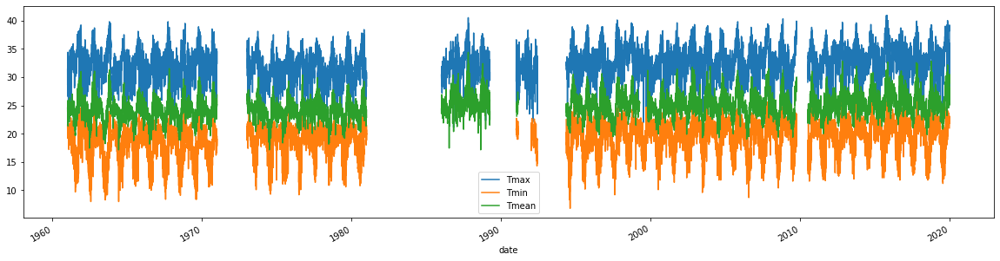

In [38]:
step = 60 * 60 * 24

# BARREIRAS - BA
d = norm_station_data \
    .filter('station_code = "83236" ') \
    .sort('date')

minp, maxp = d \
.select(
    func.min("date").cast("timestamp").cast("long"), func.max("date").cast("timestamp").cast("long")
).first()

reference = spark.range((minp / step) * step, ((maxp / step) + 1) * step, step)\
    .select(func.col("id").cast("timestamp").alias("date"))

gaps = reference.join(d, ["date"], "leftouter")

gaps.toPandas().plot.line(x='date', y=['Tmax', 'Tmin', 'Tmean'], figsize=(20,5))

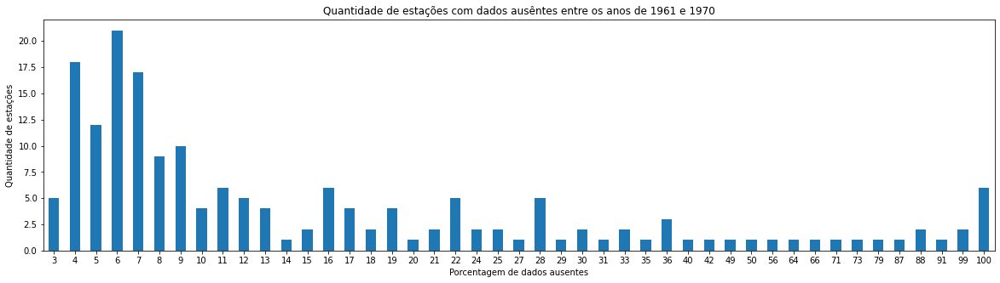

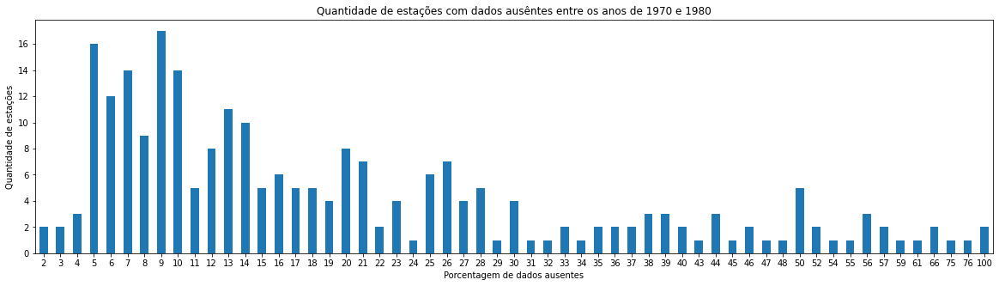

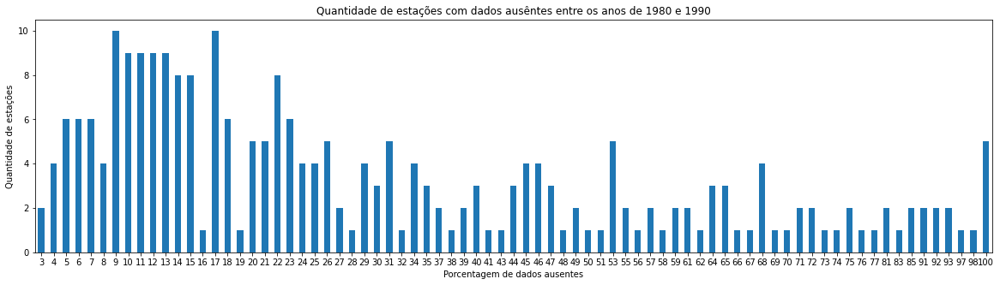

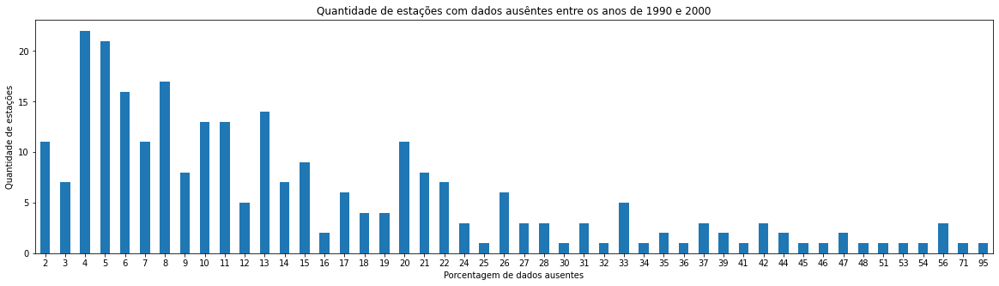

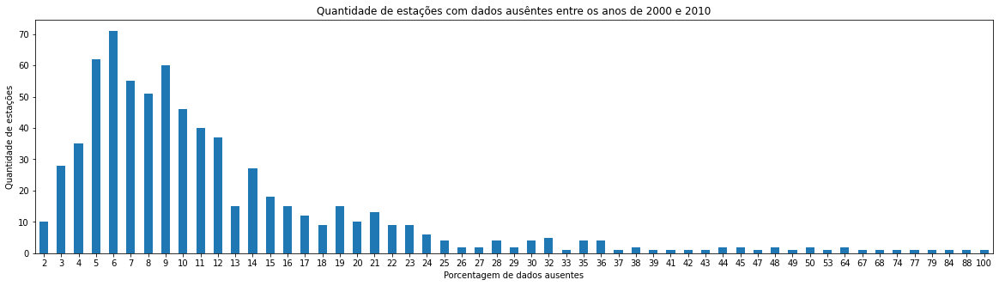

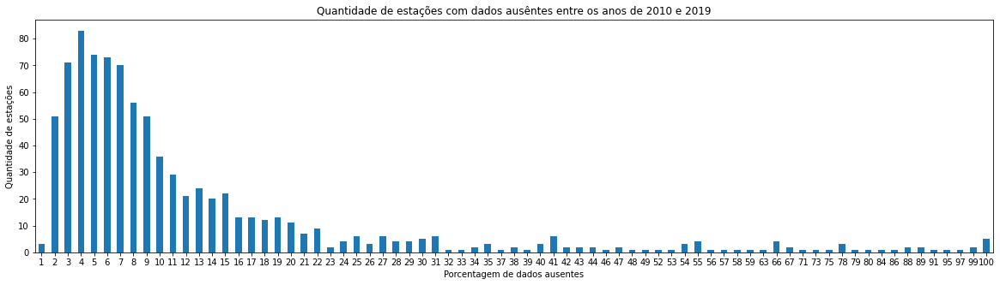

In [16]:
periods = [
    [1961, 1970],
    [1970, 1980],
    [1980, 1990],
    [1990, 2000],
    [2000, 2010],
    [2010, 2019],
]

for start_year, end_year in periods:
    start_date = '{}-01-01'.format(start_year) 
    end_date = '{}-12-31'.format(end_year)
    
    cleaned_data_nodata = temporal_norm_station_data \
        .filter(func.col('date') >= func.lit(start_date)) \
        .filter(func.col('date') <= func.lit(end_date)) \
        .groupBy('station_code') \
        .agg(
            func.sum(func.when(temporal_norm_station_data.Tmean.isNull(), func.lit(1)).otherwise(func.lit(0))).alias('Tmean_nodata'), 
            func.count(temporal_norm_station_data.date).alias('total_values')
        ) \
        .withColumn('Tmean_nodata', func.col('Tmean_nodata') / func.col('total_values') * 100)
    
    title = 'Quantidade de estações com dados ausêntes entre os anos de {start_year} e {end_year}'.format(
        start_year=start_year, end_year=end_year)
    
    ax = cleaned_data_nodata.sort('Tmean_nodata').toPandas()['Tmean_nodata'].astype(int).value_counts().sort_index().plot(title=title,kind='bar', figsize=(20,5), rot=0)
    ax.set_xlabel("Porcentagem de dados ausentes")
    ax.set_ylabel("Quantidade de estações")
    plt.show()

### As 10 estações meterológicas convencionais com maiores temperaturas registradas

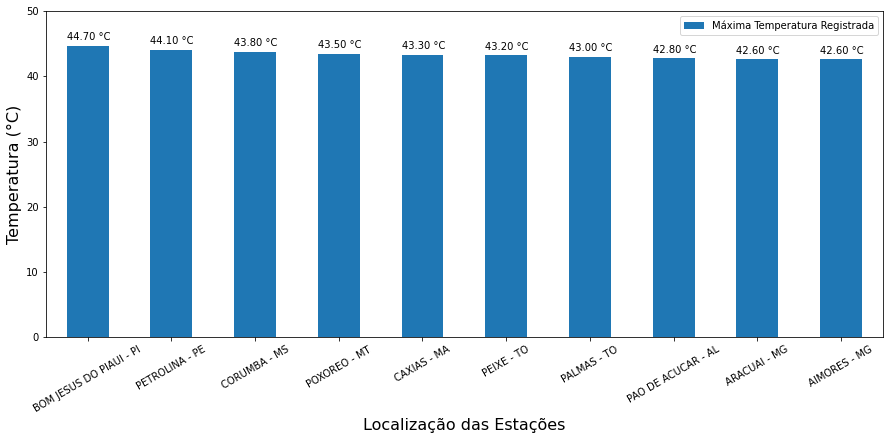

In [158]:
ax = temporal_norm_station_data \
    .join(norm_station_codes.select('code', 'type'), 
          temporal_norm_station_data.station_code == norm_station_codes.code) \
    .filter('type=1')\
    .groupBy('station_code') \
    .agg(
        func.max('Tmax').alias('Máxima Temperatura Registrada')
    ) \
    .join(norm_station_codes.select('code', 'name'), 
          temporal_norm_station_data.station_code == norm_station_codes.code) \
    .toPandas()\
    .sort_values(by=['Máxima Temperatura Registrada'], ascending=False)[:10] \
    .plot(kind='bar', x='name', y='Máxima Temperatura Registrada', figsize=(15,6), rot=30)

#ax.set_title('As 10 estações meterológicas convencionais com as maiores temperaturas já registradas')
ax.set_xlabel('Localização das Estações', fontsize=16)
ax.set_ylabel('Temperatura (°C)', fontsize=16)
plt.ylim(0, 50)

for p in ax.patches:
    ax.annotate("%.2f °C" % (p.get_height(), ), (p.get_x(), p.get_height() * 1.02))
    
plt.savefig('figures/estacoes_convencionais_maiores_temperaturas.png', dpi=300, bbox_inches='tight')

### As 10 estações meterológicas convencionais com menores temperaturas registradas

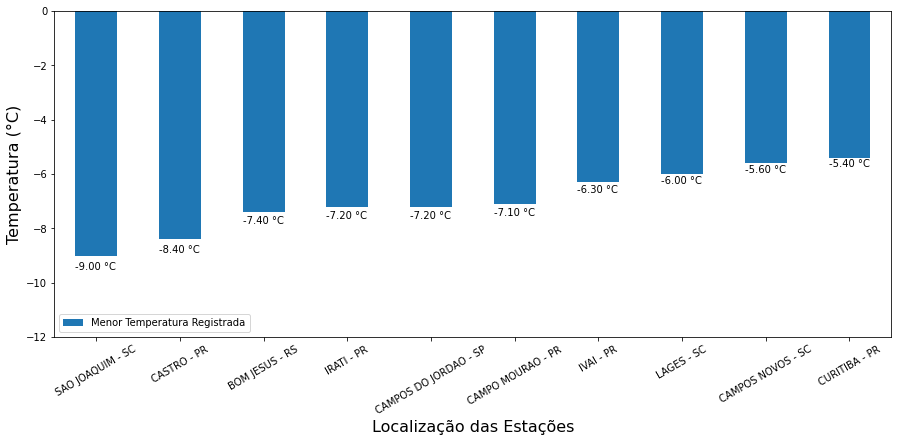

In [157]:
ax = temporal_norm_station_data \
    .join(norm_station_codes.select('code', 'type'), 
          temporal_norm_station_data.station_code == norm_station_codes.code) \
    .filter('type=1')\
    .groupBy('station_code') \
    .agg(
        func.min('Tmin').alias('Menor Temperatura Registrada')
    ) \
    .join(norm_station_codes.select('code', 'name'), 
          temporal_norm_station_data.station_code == norm_station_codes.code) \
    .toPandas()\
    .sort_values(by=['Menor Temperatura Registrada'], ascending=True)[:10] \
    .plot(kind='bar', x='name', y='Menor Temperatura Registrada', figsize=(15,6), rot=30)

#ax.set_title('As 10 estações meterológicas convencionais com as menores temperaturas já registradas')
ax.set_xlabel('Localização das Estações', fontsize=16)
ax.set_ylabel('Temperatura (°C)', fontsize=16)

for p in ax.patches:
    ax.annotate("%.2f °C" % (p.get_height(), ), (p.get_x(), p.get_height() * 1.06))

plt.ylim(-12, 0)

plt.savefig('figures/estacoes_convencionais_menores_temperaturas.png', dpi=300, bbox_inches='tight')

# Criação de Modelos de Machine Learning

In [11]:
data = temporal_norm_station_data \
    .withColumnRenamed('Tmean', 'Temperatura') \
    .select(['station_code', 'date', 'Temperatura'])

## Variáveis e períodos analiados

In [12]:
frequence = '2W'
period = 26
variable = 'Temperatura'
start_date_prediction = '2019-01-01'
end_date_prediction = '2019-12-31'

## Obtendo o código de todas as estações

In [114]:
stations_list = [x.station_code for x in data.select('station_code').distinct().collect()]

## Selecionando uma amostra de estações para analisar

In [13]:
stations_samples = ['A732', 'A753', 'A734', 'A723', 'A858', 'A612', 'A345', 'A866', 'A830', 'A931', 'A716', 'A882', 'A525', 'A541', 'A805', 'A606', 'A523', 'A823', 'A227', '83907', '83592', '82336', '83470', '82915', '82795', '83936', '83842', '83332', '82994', '83844', '83361', '82807', '83464', '82791', '82445', '83781', '82683', 'A311', 'A119', 'A906', 'A422', 'A045', 'A316', 'A032', 'A936', 'A420', 'A204', 'A916', 'A748', 'A609', 'A332', 'A308', 'A929', 'A014', 'A720', 'A430', 'A848', 'A524', 'A023', 'A328', 'A424', 'A003', 'A532', 'A516', 'A444', 'A816', 'A749', 'A615', 'A433', 'A845', 'A802', 'A017', 'A829', 'A052', 'A826', 'A659', 'A428', 'A043', 'A762', '82723', '82376', '82690', '83919', '83687', '82689', '83522', '82753', '712f3e11658051636f09732a60fb3c1b']

#stations_samples = ['82768', 'A736', '712f3e11658051636f09732a60fb3c1b']

## Obtendo os dados das estações de amostra

In [15]:
station_type = {
        1: 'Convencional', 
        2: 'Automática'
    }

def get_station_title(station_code):
    station_details = norm_station_codes.filter(func.col('code') == station_code).first()

    station_title = 'Cod. {code} / Nome: {name} / Tipo: {station_type} / Localização: long, lat {lon:.2f},{lat:.2f}'\
        .format(code=station_code, 
                name=station_details['name'], 
                station_type=station_type.get(station_details['type']), 
                lon=station_details['longitude'], 
                lat=station_details['latitude'])
    
    return station_title

def get_station_short_title(station_code):
    station_details = norm_station_codes.filter(func.col('code') == station_code).first()

    station_title = '({code}) {name}'\
        .format(code=station_code, 
                name=station_details['name'])
    
    return station_title
    
def get_station_data(station_code):    
    station_data = data.filter(func.col('station_code') == station_code).toPandas()
    station_data.index = pd.DatetimeIndex(station_data['date']).to_period('D')
    station_data = station_data.resample(frequence).mean()
    return station_data

## Modelo Auto- ARIMA

### Decomposição da série temporal

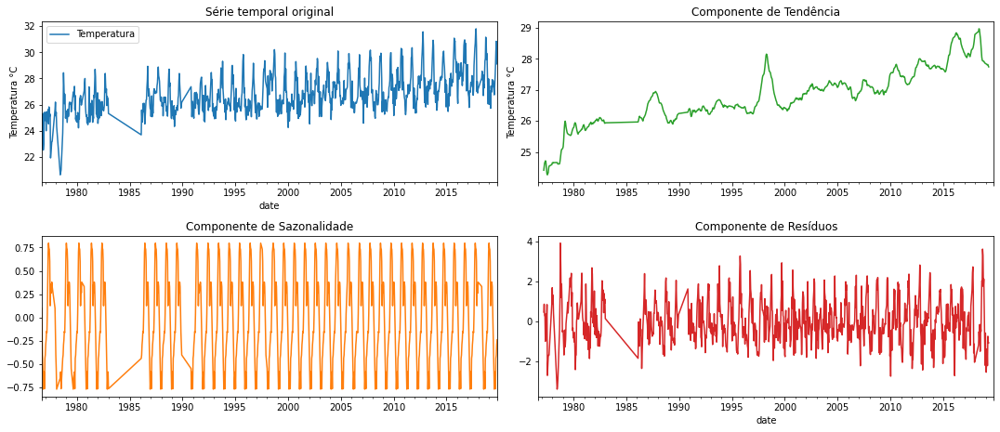

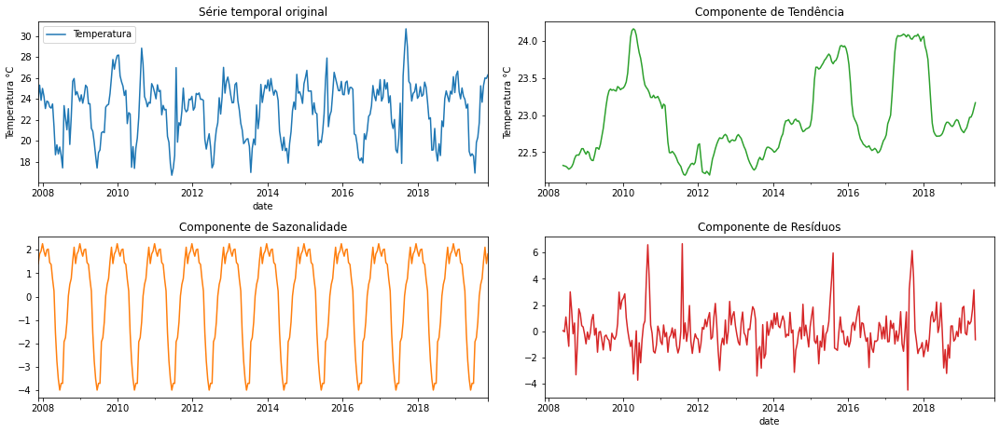

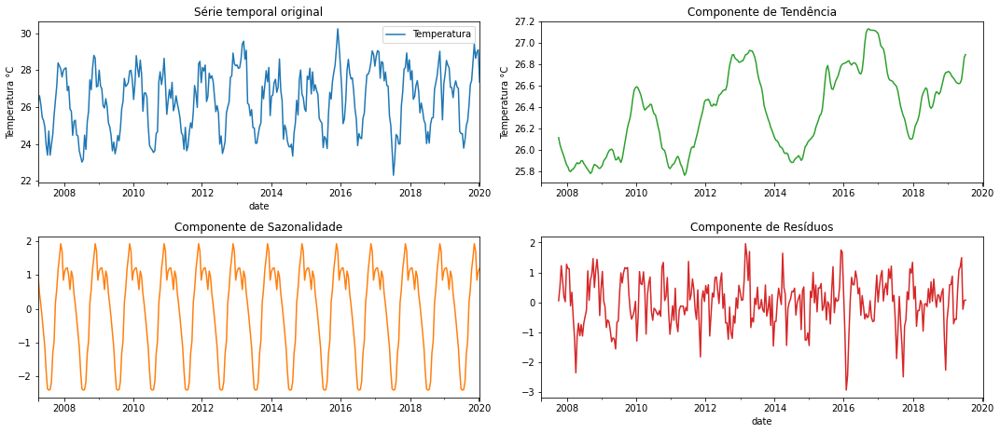

In [173]:
pd.plotting.register_matplotlib_converters()

def decompose_serie(title, input_data):
    decomposition = seasonal_decompose(input_data, period=period) 
    trend = decomposition.trend 
    seasonal = decomposition.seasonal 
    residual = decomposition.resid
    
    fig, axs = plt.subplots(2, 2)
    
    axs[0, 0].set_title('Série temporal original')
    axs[0, 0].set_ylabel('Temperatura °C')
    axs[0, 0].set_xlabel(None)
    input_data.plot(label='Original', figsize=(15,8), ax=axs[0, 0], color='tab:blue')  
    
    trend.plot(label='Trend', figsize=(15,8), ax=axs[0, 1], color='tab:green')
    axs[0, 1].set_title('Componente de Tendência')
    axs[0, 1].set_ylabel('Temperatura °C')
    axs[0, 1].set_xlabel(None)
    
    seasonal.plot(label='Seasonal', figsize=(15,8), ax=axs[1, 0], color='tab:orange')     
    axs[1, 0].set_title('Componente de Sazonalidade')
    axs[1, 0].set_ylabel('')
    axs[1, 0].set_xlabel(None)

        
    axs[1, 1].set_title('Componente de Resíduos')
    axs[1, 1].set_ylabel('')
    axs[1, 1].set_xlabel(None)
    residual.plot(label='Residual', figsize=(15,8), ax=axs[1, 1], color='tab:red') 
    
    #fig.suptitle(title + '\n (Resultado da Decomposição da Série Temporal)')
    
    fig.tight_layout(rect=[0, 0.03, 1, 0.85])
    plt.savefig('figures/decomposicao_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()

for station_code in stations_samples:
    station_title = get_station_title(station_code)
    station_data = get_station_data(station_code)
    
    decompose_serie(station_title, station_data.dropna())

### Analisando a autocorrelação

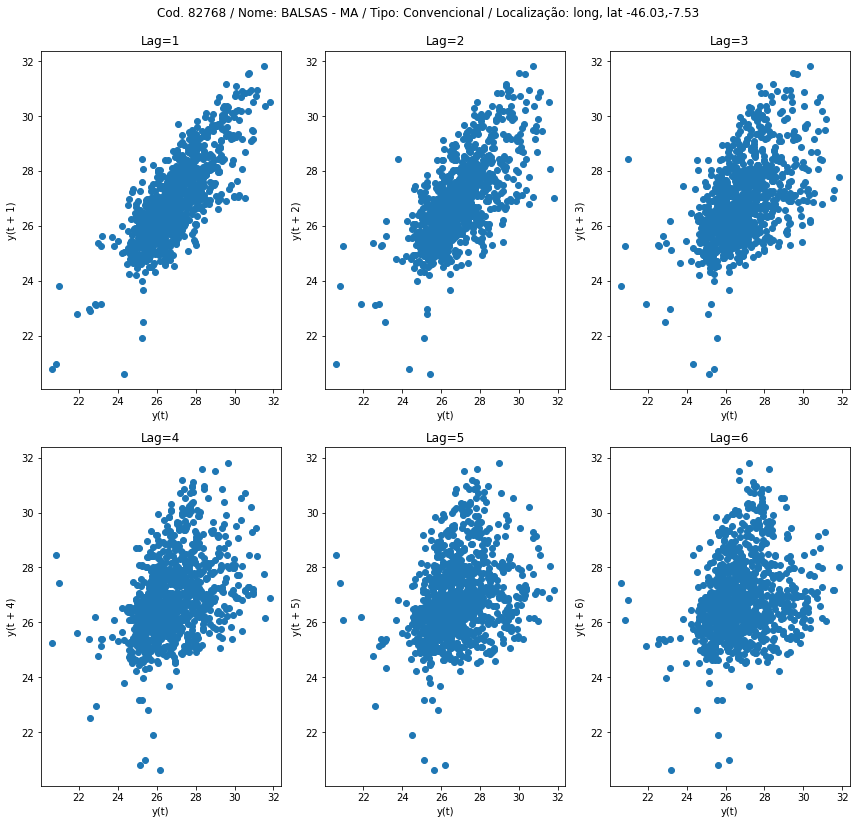

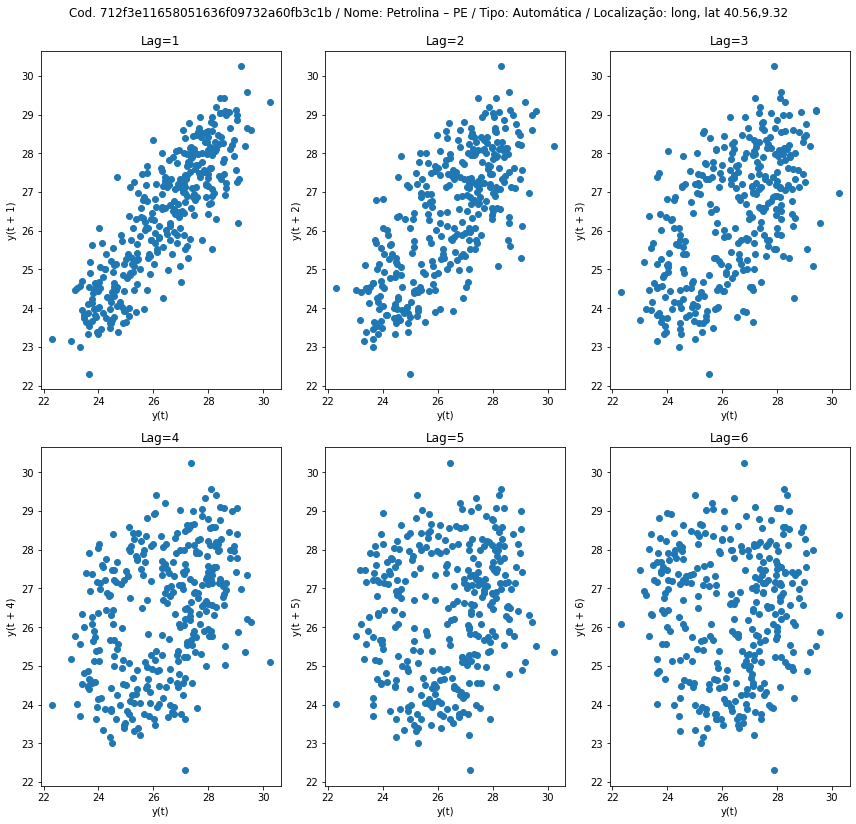

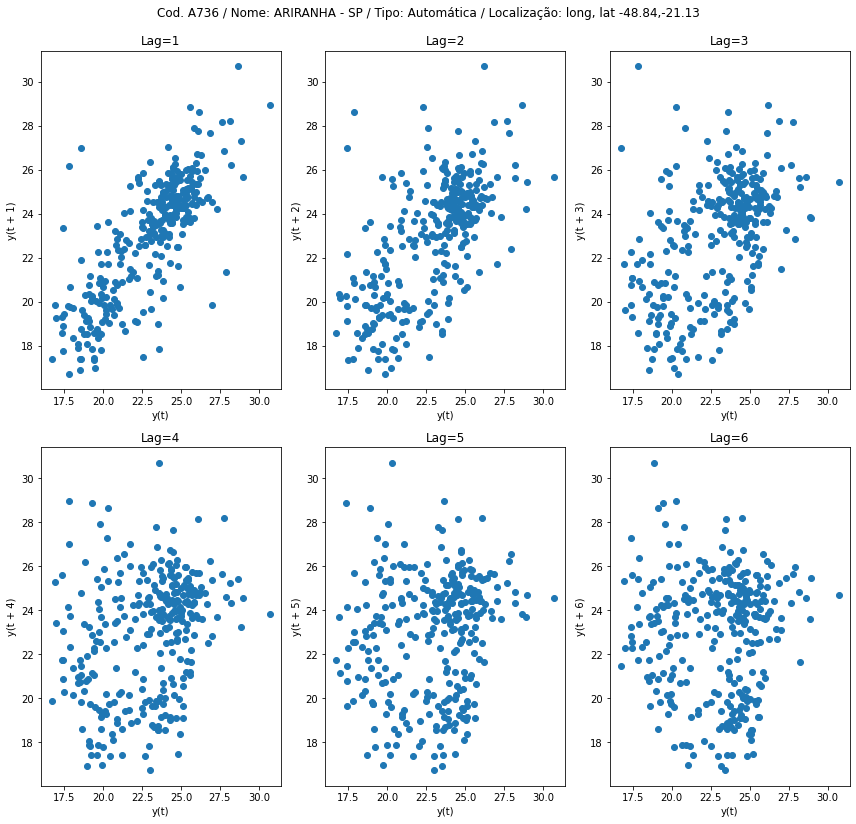

In [403]:
for station_code in stations_samples:
    station_title = get_station_title(station_code)
    station_data = get_station_data(station_code)
    
    fig, axes = plt.subplots(2, 3, figsize=(12, 12))
    fig.suptitle(station_title)

    axs = [
        (0, 0),
        (0, 1),
        (0, 2),
        (1, 0),
        (1, 1),
        (1, 2),
    ]
    for lag, ax_coords in enumerate(axs, 1):
        ax_row, ax_col = ax_coords
        axis = axes[ax_row][ax_col]
        pd.plotting.lag_plot(station_data.dropna(), lag=lag, ax=axis)
        axis.set_title(f"Lag={lag}")
    
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.savefig('figures/correlacao_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()

### Testando a estacionariedade utilizando o teste de Dickey-Fuller

Para trabalhar com séries temporais precisamos que ela seja estacionária. Essa característica além de ser necessária para algum modelos, facilita a projeção dos dados.

Resultado do Teste de Dickey-Fuller:


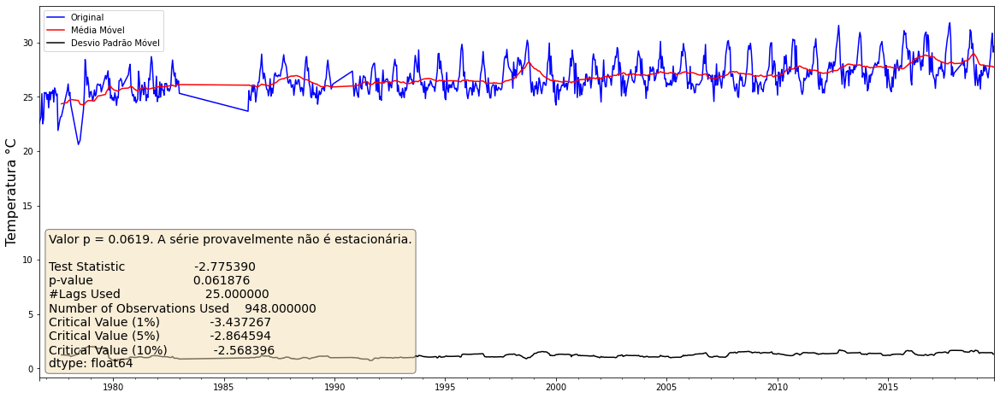

Resultado do Teste de Dickey-Fuller:


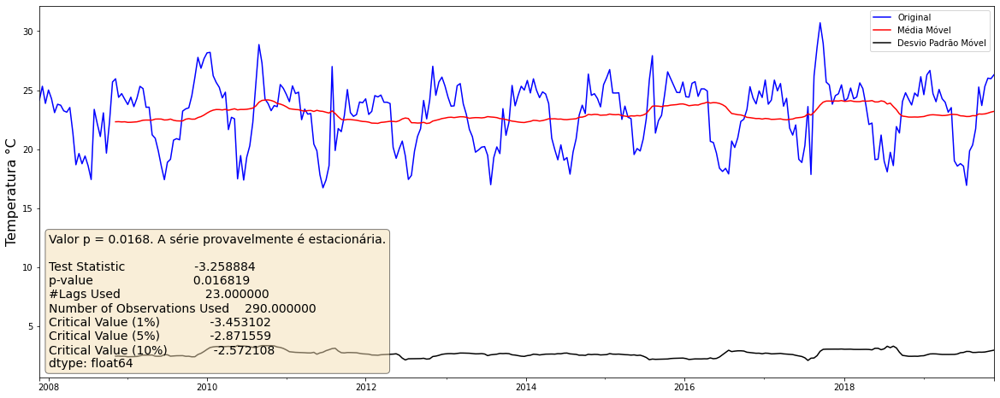

Resultado do Teste de Dickey-Fuller:


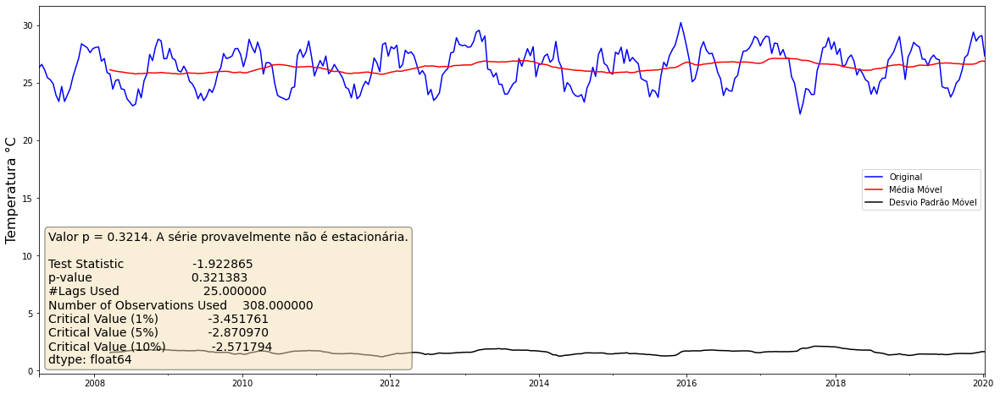

In [178]:
def test_stationarity(variable_name, timeseries, window = period, cutoff = 0.05, figsize=(20, 8)):

    #Determing rolling statistics
    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    # Plot rolling statistics:
    fig, ax = plt.subplots(figsize=figsize)
    
    orig = timeseries.plot(color='blue', label='Original', ax=ax)
    mean = rolmean.plot(color='red', label='Média Móvel', ax=ax)
    std = rolstd.plot(color='black', label = 'Desvio Padrão Móvel', ax=ax)
    
    #Perform Dickey-Fuller test:
    print('Resultado do Teste de Dickey-Fuller:')
    dftest = adfuller(timeseries, autolag='AIC', maxlag=period)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]

    if pvalue < cutoff:
        result = 'Valor p = %.4f. A série provavelmente é estacionária.\n\n' % pvalue
    else:
        result = 'Valor p = %.4f. A série provavelmente não é estacionária.\n\n' % pvalue
    
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    
    ax.set_ylabel('Temperatura °C', fontsize=16)
    ax.set_xlabel(None)
    ax.legend(['Original', 'Média Móvel', 'Desvio Padrão Móvel'])    
    #ax.legend(loc='best')
    #plt.title(variable_name + '\n (Estatíticas de Rolagem)')

    # place a text box in upper left in axes coords
    ax.text(0.01, 0.02, result + str(dfoutput), transform=ax.transAxes, fontsize=14,
            verticalalignment='bottom', bbox=props)

for station_code in stations_samples:
    station_title = get_station_title(station_code)
    station_data = get_station_data(station_code)

    test_stationarity(station_title, station_data.dropna())
    plt.savefig('figures/dickey_fuller_raw_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()

### Aplicando uma diferenciação para obter uma série estacionária

Resultado do Teste de Dickey-Fuller:


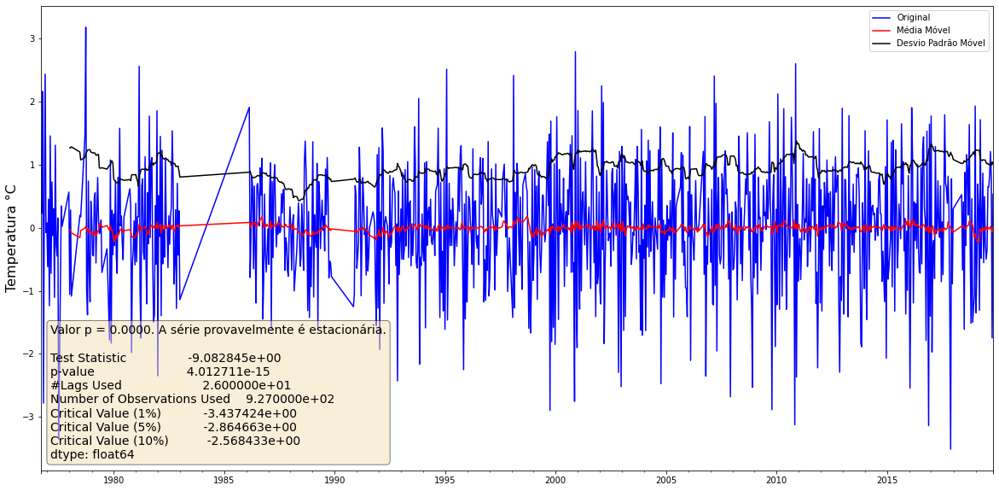

Resultado do Teste de Dickey-Fuller:


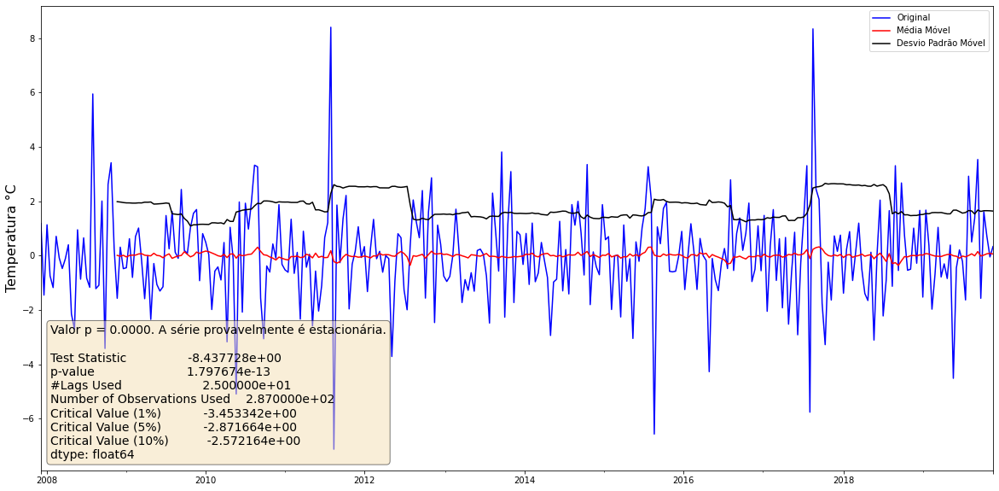

Resultado do Teste de Dickey-Fuller:


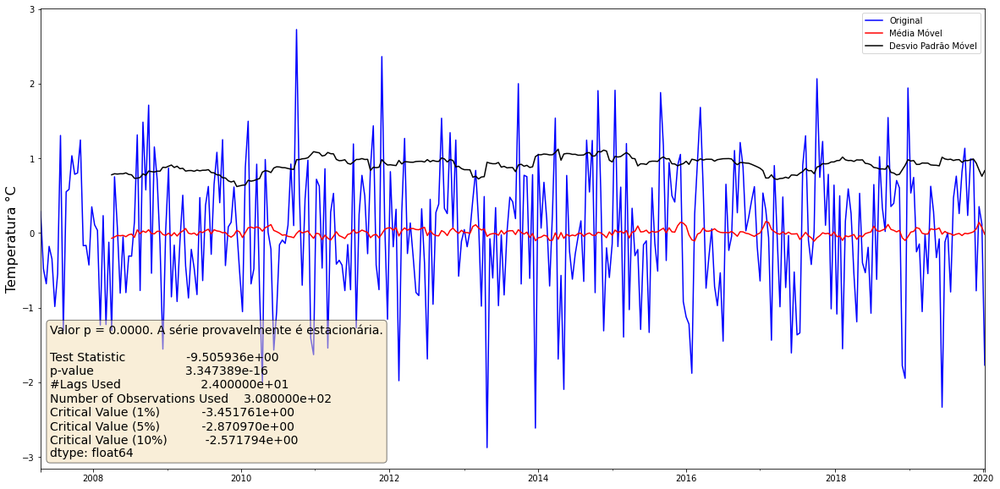

In [177]:
# diff(t) = obs(t) - obs(t-1) 

for station_code in stations_samples:
    station_title = get_station_title(station_code)
    station_data = get_station_data(station_code)

    #Aplicação da diferenciação
    station_data_diff = station_data - station_data.shift()
    station_data_diff.dropna(inplace=True)

    test_stationarity(station_title, station_data_diff.dropna(), figsize=(20, 10))
    plt.savefig('figures/dickey_fuller_diff_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()

    plt.show()

### Plotando o ACF & PACF 

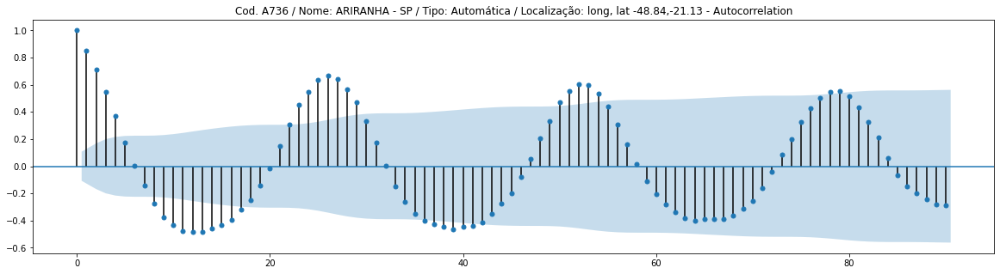

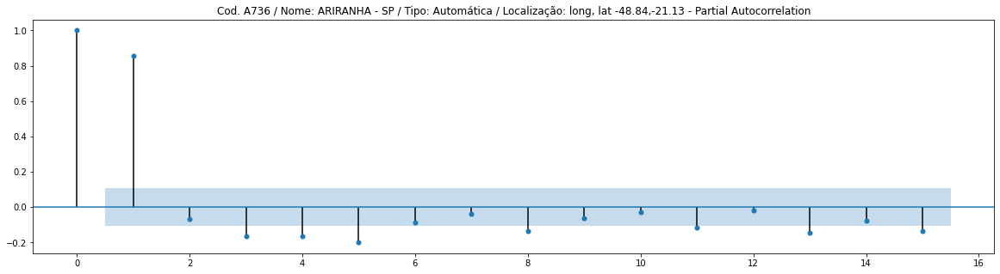

In [90]:
#ACF & PACF plots
import statsmodels.api as sm

def plot_acf_and_pacf(variable_name, time_series):
    fig, ax = plt.subplots(figsize=(20, 5))
    sm.graphics.tsa.plot_acf(time_series, lags=90, ax=ax)
    plt.title(variable_name + " - Autocorrelation")
    
    fig, ax = plt.subplots(figsize=(20, 5))
    sm.graphics.tsa.plot_pacf(time_series, lags=15, ax=ax)
    plt.title(variable_name  + " - Partial Autocorrelation")

plot_acf_and_pacf(station_title, serie.dropna().reset_index(drop=True).values.reshape(-1).tolist())
plt.show()

### Dividindo o dado em conjuntos de entrada e saída (esperado)

In [16]:
def ts_input_output_split(station_code, validation_time_start, validation_time_end):
    station_data = data.filter(func.col('station_code') == station_code).toPandas()
    station_data.index = pd.DatetimeIndex(station_data['date']).to_period('D')

    station_serie = station_data.resample(frequence).mean()

    train = station_serie.loc[:validation_time_start]
    train = train.resample(frequence).mean().dropna()

    test = station_serie.loc[validation_time_start:validation_time_end]
    test = test.resample(frequence).mean().dropna()
    
    return train, test

In [17]:
def expected_vs_predicted(station_code, expected, predicted):
    expected_values = expected.copy()
    
    index = expected.index.to_timestamp()

    expected_values.index = index
    
    fitted_series = pd.Series(predicted)
    fitted_series.index=index

    plt.figure(figsize=(20,15))
    plt.subplot(211)

    # plotar gráfico
    plt.plot(expected_values, color='blue')
    plt.plot(fitted_series, linestyle='--', color='orange')
    plt.ylim(10, 35)
    plt.legend(['real', 'previsto'], loc='upper left')

    rmse = np.sqrt(mean_squared_error(expected_values, predicted))

    return rmse, fitted_series.to_frame()

### Utiliza o Auto ARIMA para encontrar os melhores modelos

In [118]:
adjusted_models_path = 'arima_models_params.csv'

In [119]:
if os.path.exists(adjusted_models_path):
    adjusted_models = pd.read_csv(adjusted_models_path, sep=';')
else:
    adjusted_models = pd.DataFrame([], columns=['station_code', 'model', 'p', 'd', 'q', 'P', 'D', 'Q', 'm', 'aic', 'pvalues'])
adjusted_models

,station_code,model,p,d,q,P,D,Q,m,aic,pvalues
0,A732,"(0, 0, 3)(0, 1, 1, 26)[26]",0,0,3,0,1,1,26,1108.058457,[1.64934670e-36 8.66715863e-02 4.94285915e-03 ...
1,A753,"(1, 0, 1)(2, 1, 0, 26)[26]",1,0,1,2,1,0,26,870.147581,[9.17480182e-015 5.76670161e-277 5.82509608e-0...
2,A734,"(1, 0, 1)(2, 1, 0, 26)[26]",1,0,1,2,1,0,26,1049.453476,[8.40809725e-003 4.18079756e-127 1.92661577e-0...
3,A723,"(0, 0, 1)(0, 1, 1, 26)[26]",0,0,1,0,1,1,26,1352.904477,[2.26931975e-39 8.04349839e-31 2.48687775e-49]
4,A858,"(0, 0, 1)(0, 1, 1, 26)[26]",0,0,1,0,1,1,26,1128.387964,[2.12921489e-35 7.96494372e-25 1.06371860e-36]
...,...,...,...,...,...,...,...,...,...,...,...
83,83687,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,4693.734846,[3.80326172e-077 2.33832400e-020 1.47800778e-0...
84,82689,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,2507.190389,[3.24350583e-019 2.22549155e-007 1.55917122e-0...
85,83522,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,3042.450954,[1.95987858e-018 2.35939800e-007 8.28758457e-0...
86,82753,"(2, 0, 0)(2, 1, 0, 26)[26]",2,0,0,2,1,0,26,2432.490868,[8.12450913e-015 2.58304772e-003 6.28573619e-1...


In [71]:
for station_code in stations_samples:
    print("Station:", station_code)
    
    if not (adjusted_models[['station_code']].astype(str) == station_code).any()[0]:
    
        train_data, test_data = ts_input_output_split(station_code, start_date_prediction, end_date_prediction)

        print("Train size: ", len(train_data))
        print("Test size: ", len(test_data))

        if len(train_data) < (2 * period) or len(test_data) < period:
            print("Station {} skipped!".format(station_code))
            continue
            
        train_data_diff = train_data - train_data.shift()
        train_data_diff.dropna(inplace=True)

        arima_model = auto_arima(train_data_diff, 
                                 start_p=1, start_q=1, 
                                 test='adf',
                                 max_p=3, max_q=3, m=period,
                                 start_P=0, seasonal=True, 
                                 d=None, D=1, 
                                 stepwise=True,                 
                                 trace=True,
                                 random_state=20, n_fits=10
                                )

        arima_model.summary()
        
        model_params = '{order}{seasonal_order}[{period}]'.format(order=arima_model.order, 
                                                               seasonal_order=arima_model.seasonal_order, 
                                                               period=period
                                                               )
        
        best_model = pd.DataFrame.from_dict([{
            'station_code': str(station_code),
            'model': model_params, 
            'p': arima_model.order[0],
            'd': arima_model.order[1],
            'q': arima_model.order[2],
            'P': arima_model.seasonal_order[0],
            'D': arima_model.seasonal_order[1],
            'Q': arima_model.seasonal_order[2],
            'm': arima_model.seasonal_order[3],
            'aic': arima_model.aic(),
            'pvalues': arima_model.pvalues(), 
        }])

        adjusted_models = pd.concat([best_model, adjusted_models])
        
        adjusted_models.to_csv('arima_models_params.csv', sep=';', index=False)

Station: 324c5d9515e62e6c98721e3db49a0da0
Train size:  0
Test size:  11
Station 324c5d9515e62e6c98721e3db49a0da0 skipped!


## Exibindo os modelos ajustados e seus respectivos erros

In [179]:
adjusted_models

,station_code,model,p,d,q,P,D,Q,m,aic,pvalues
0,A732,"(0, 0, 3)(0, 1, 1, 26)[26]",0,0,3,0,1,1,26,1108.058457,[1.64934670e-36 8.66715863e-02 4.94285915e-03 ...
1,A753,"(1, 0, 1)(2, 1, 0, 26)[26]",1,0,1,2,1,0,26,870.147581,[9.17480182e-015 5.76670161e-277 5.82509608e-0...
2,A734,"(1, 0, 1)(2, 1, 0, 26)[26]",1,0,1,2,1,0,26,1049.453476,[8.40809725e-003 4.18079756e-127 1.92661577e-0...
3,A723,"(0, 0, 1)(0, 1, 1, 26)[26]",0,0,1,0,1,1,26,1352.904477,[2.26931975e-39 8.04349839e-31 2.48687775e-49]
4,A858,"(0, 0, 1)(0, 1, 1, 26)[26]",0,0,1,0,1,1,26,1128.387964,[2.12921489e-35 7.96494372e-25 1.06371860e-36]
...,...,...,...,...,...,...,...,...,...,...,...
83,83687,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,4693.734846,[3.80326172e-077 2.33832400e-020 1.47800778e-0...
84,82689,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,2507.190389,[3.24350583e-019 2.22549155e-007 1.55917122e-0...
85,83522,"(3, 0, 0)(2, 1, 0, 26)[26]",3,0,0,2,1,0,26,3042.450954,[1.95987858e-018 2.35939800e-007 8.28758457e-0...
86,82753,"(2, 0, 0)(2, 1, 0, 26)[26]",2,0,0,2,1,0,26,2432.490868,[8.12450913e-015 2.58304772e-003 6.28573619e-1...


### Previsão do ano de 2019 para as 88 estações avaliadas

In [193]:
arima_saved_models = {}

Station: A732


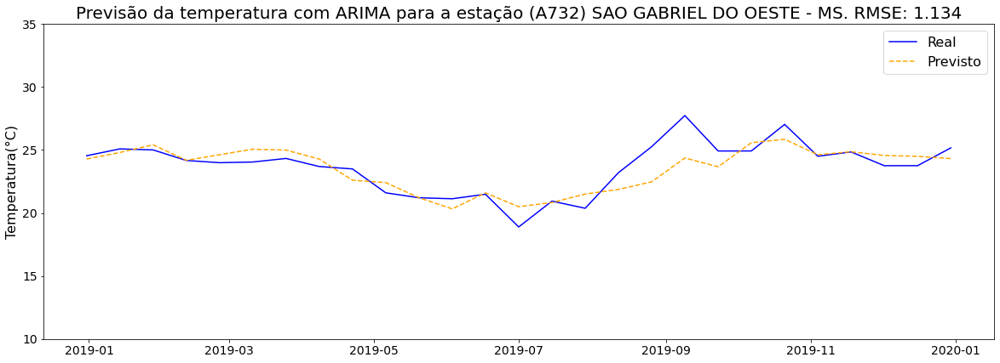

Station: A753


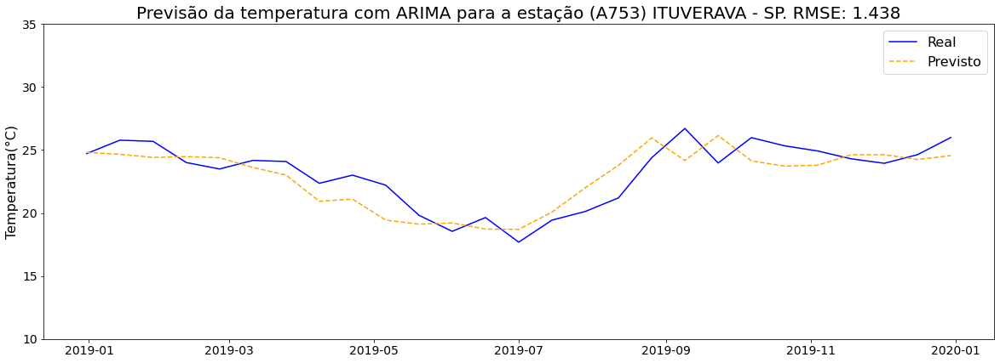

Station: A734


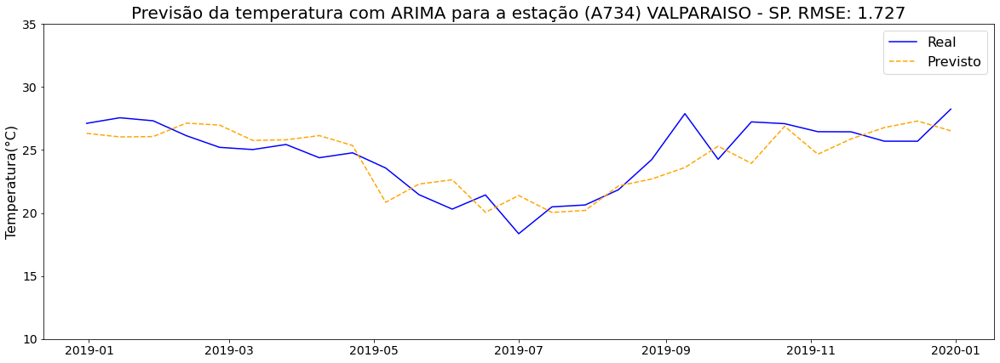

Station: A723


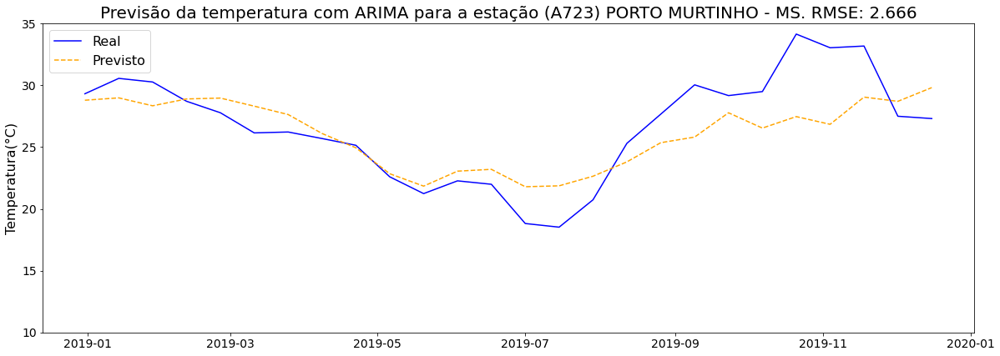

Station: A858


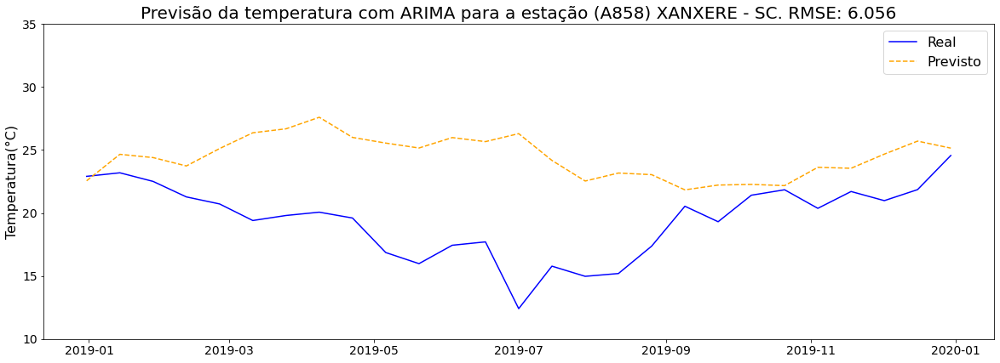

Station: A612


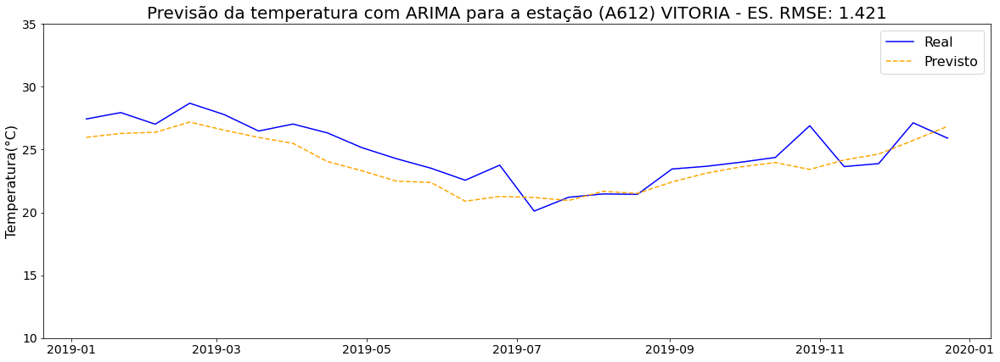

Station: A345


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


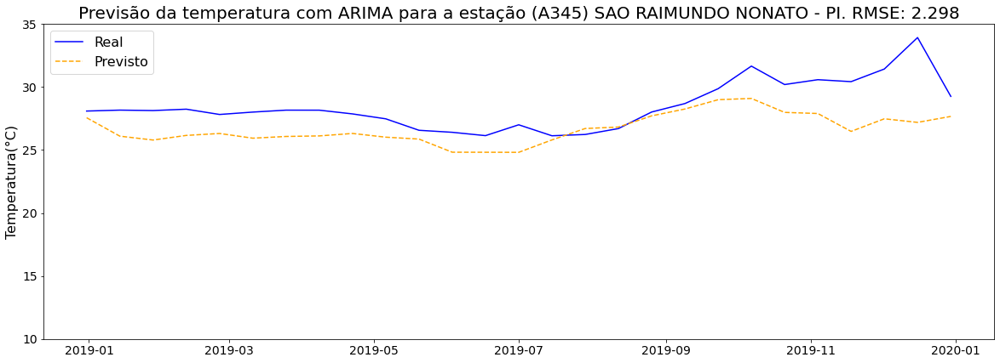

Station: A866


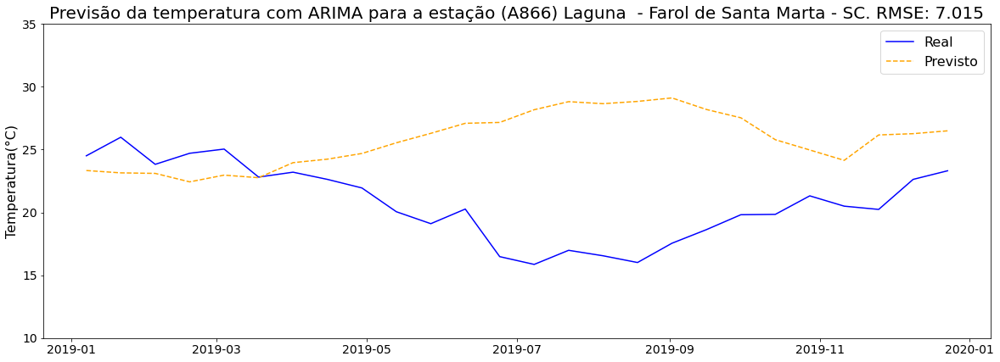

Station: A830


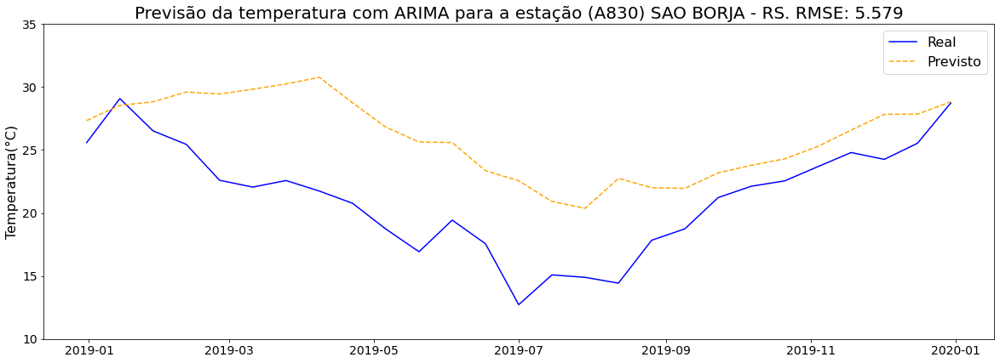

Station: A931


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


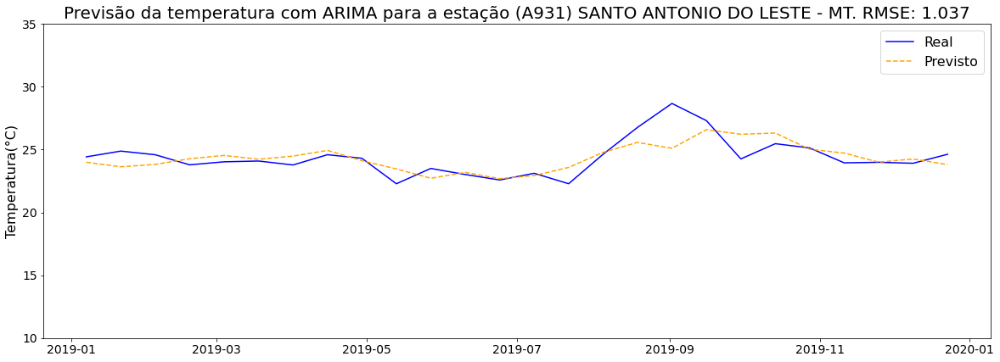

Station: A716


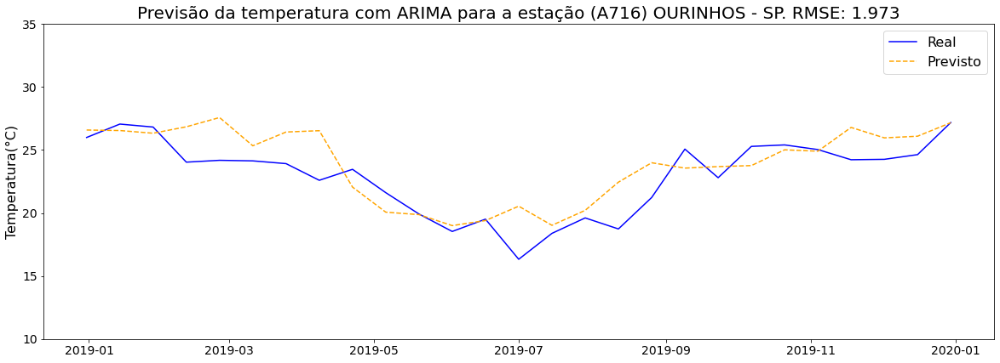

Station: A882


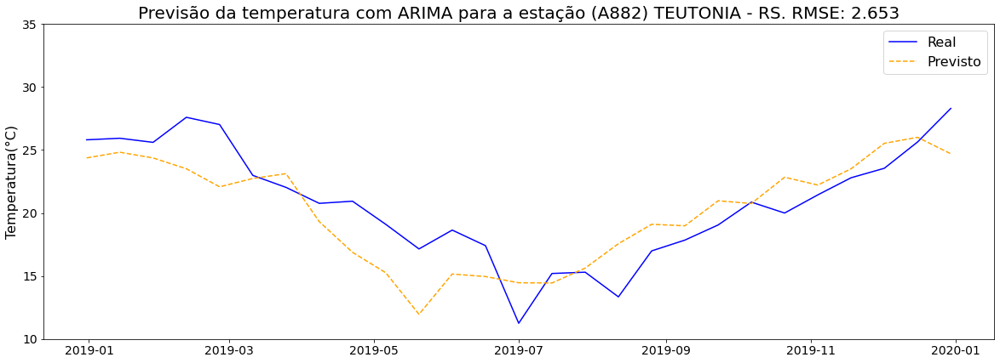

Station: A525


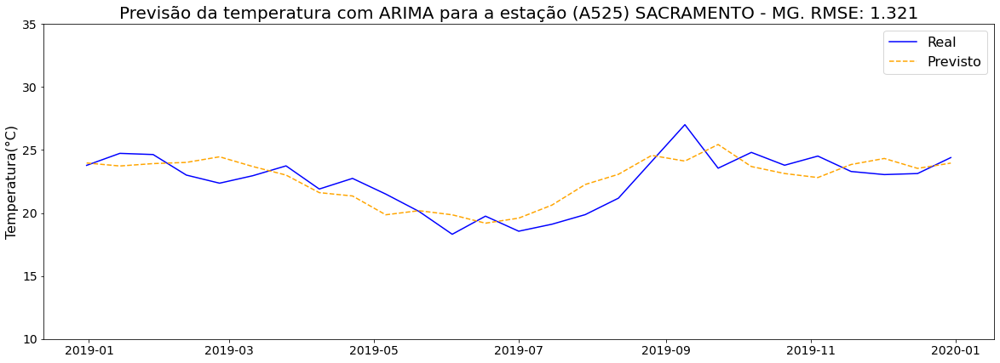

Station: A541


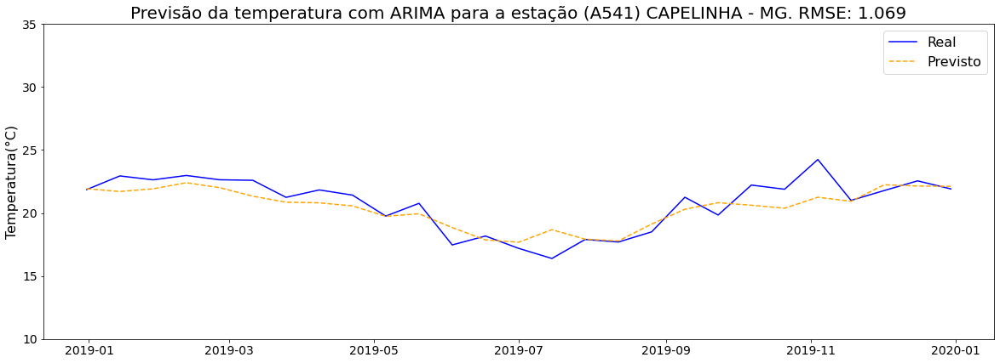

Station: A805


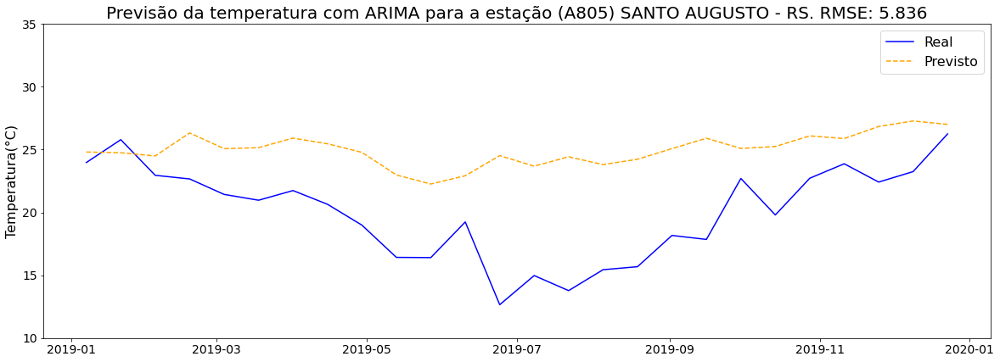

Station: A606


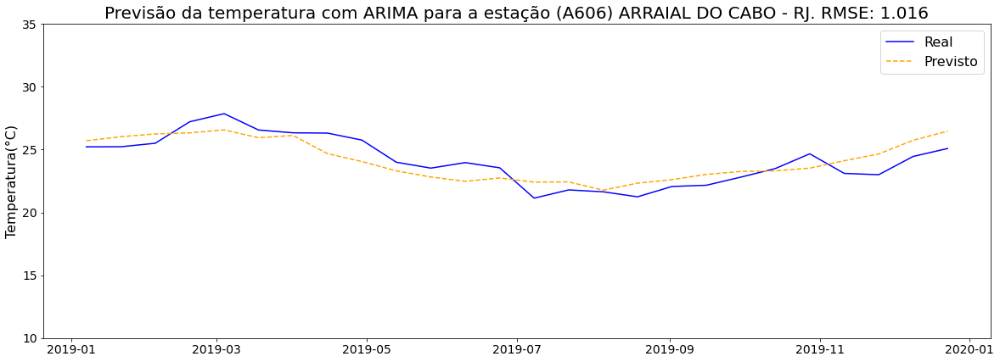

Station: A523


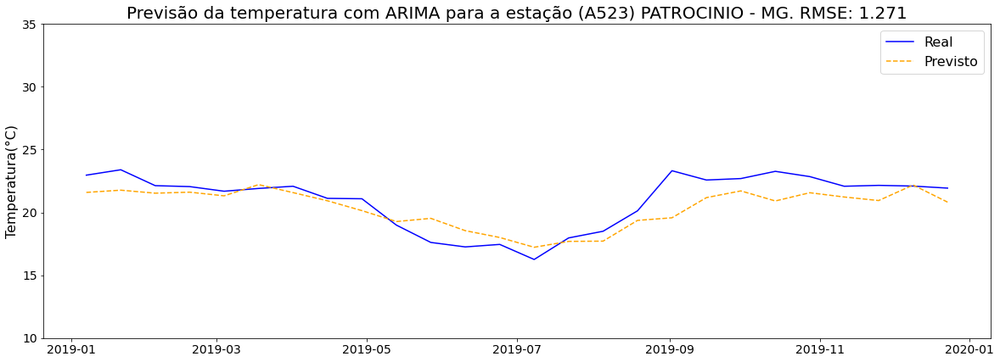

Station: A823


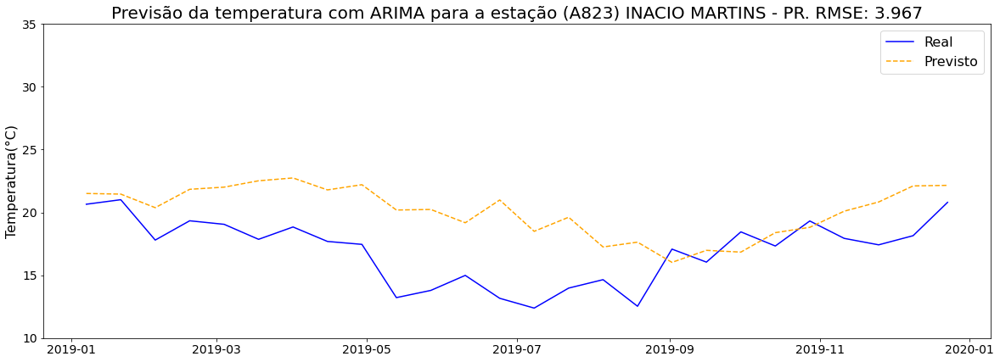

Station: A227


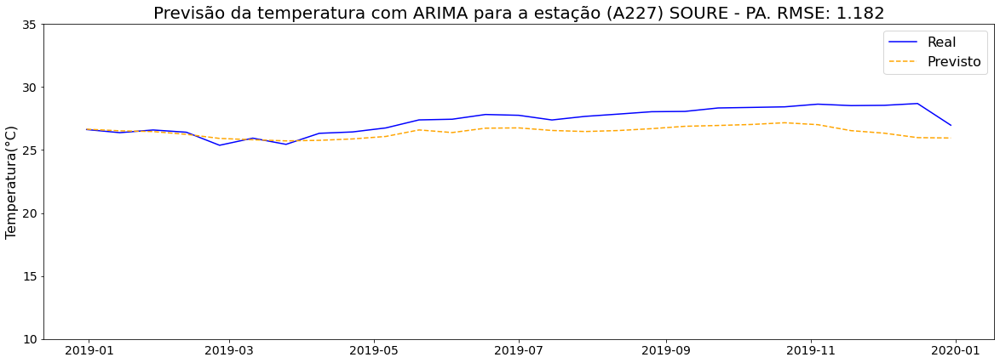

Station: 83907


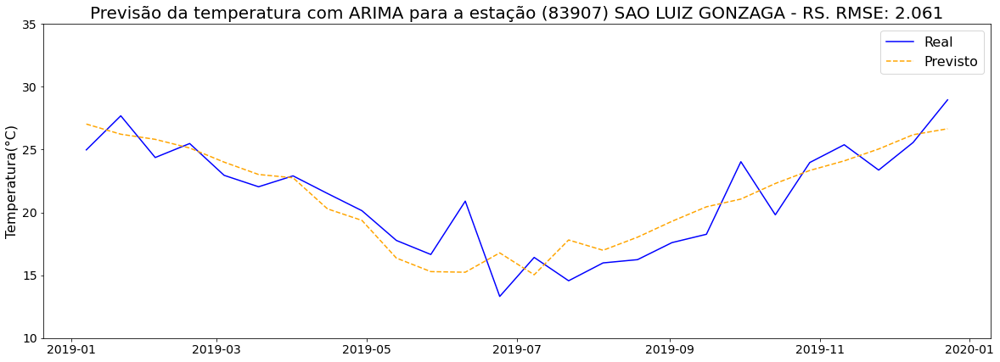

Station: 83592


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


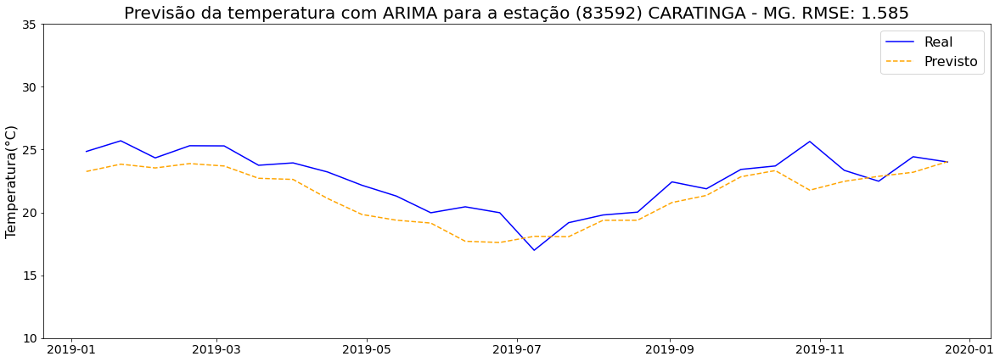

Station: 82336


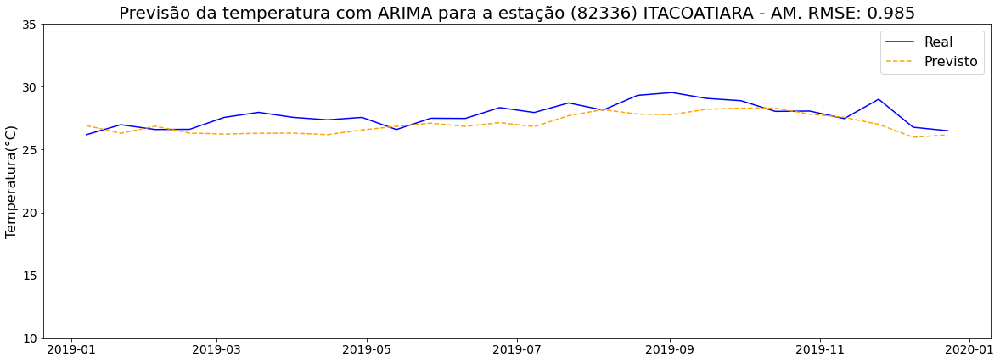

Station: 83470


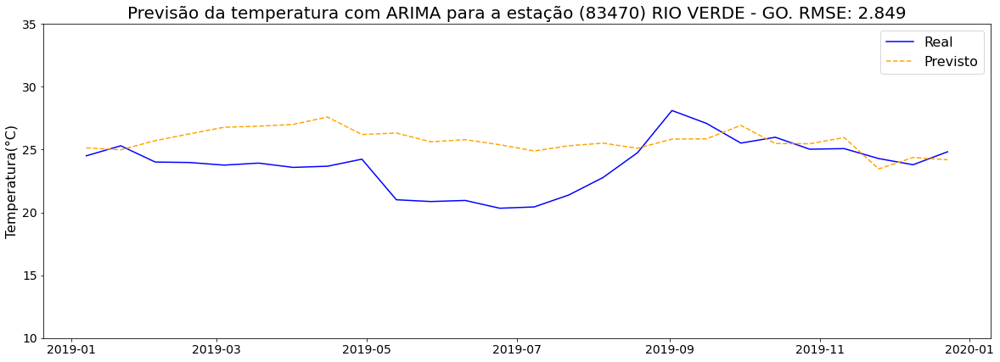

Station: 82915


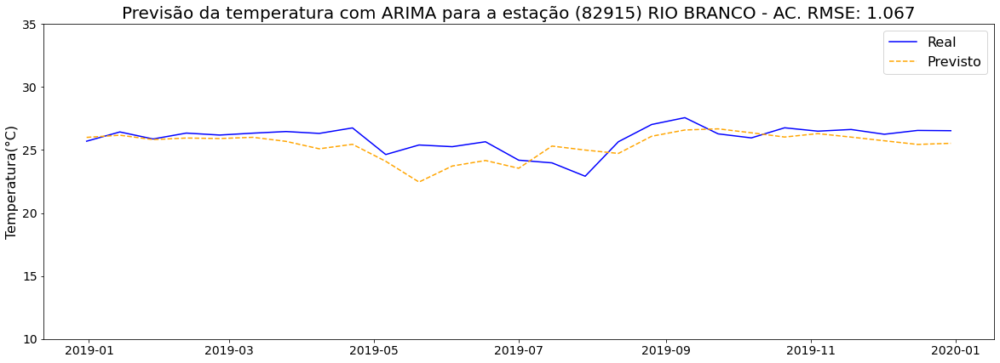

Station: 82795


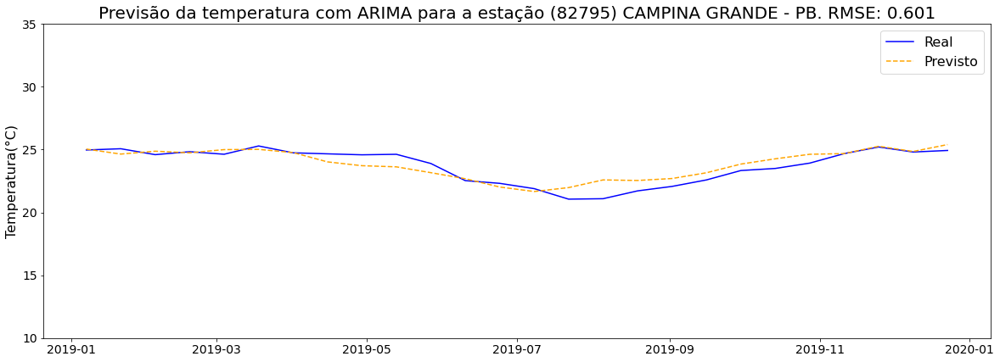

Station: 83936


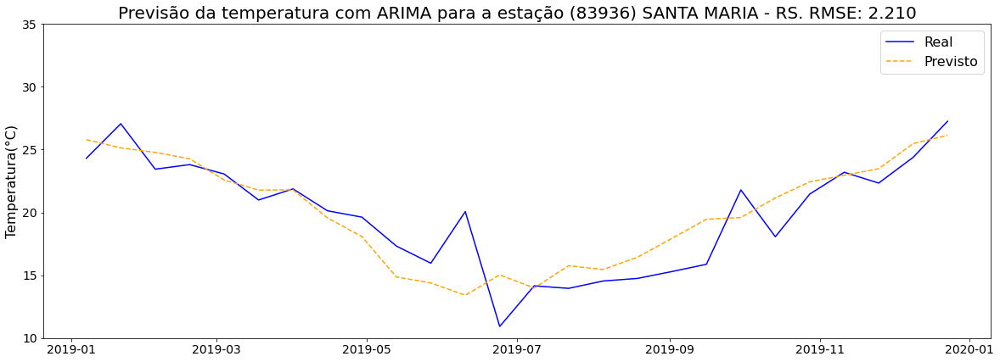

Station: 83842


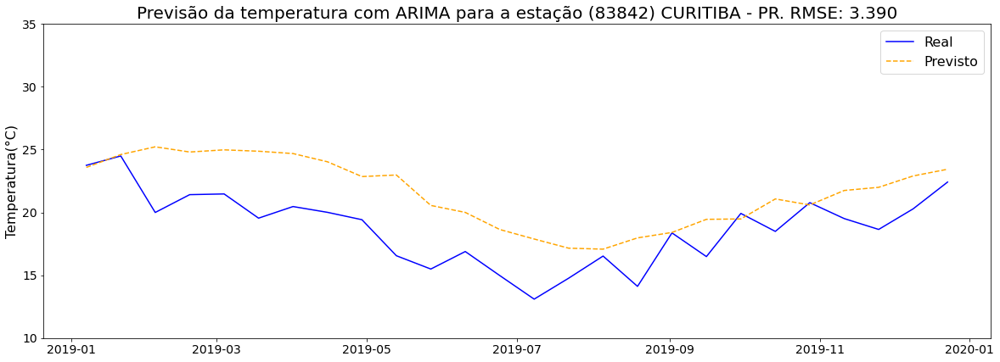

Station: 83332


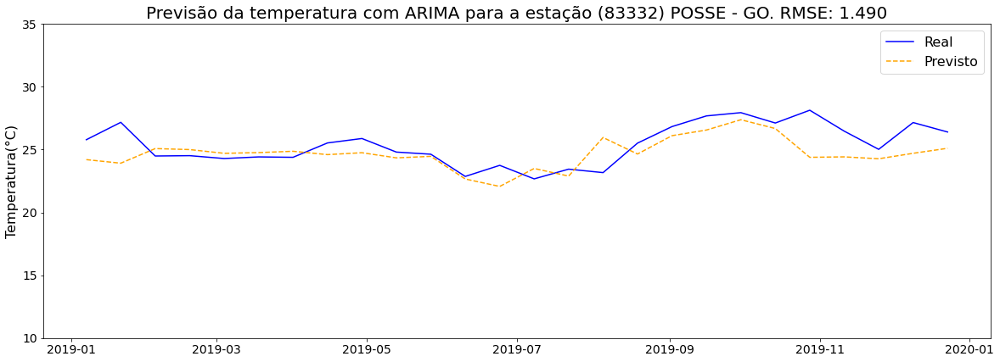

Station: 82994


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


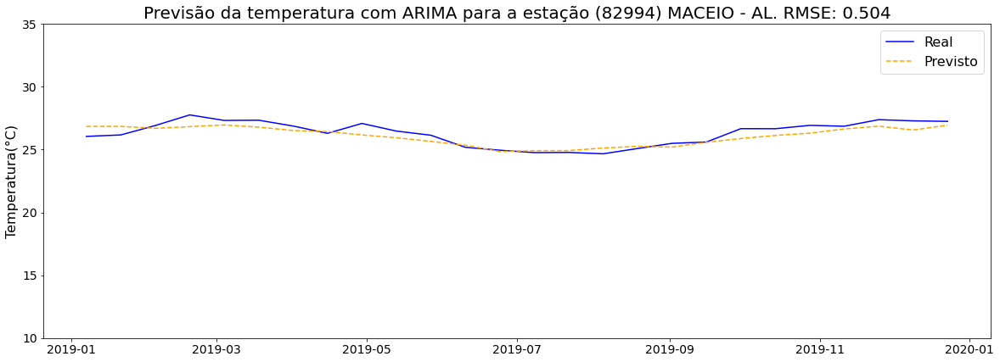

Station: 83844


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


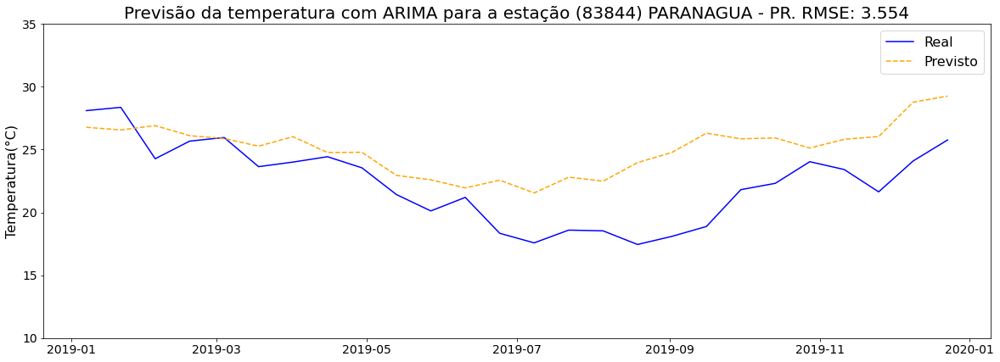

Station: 83361


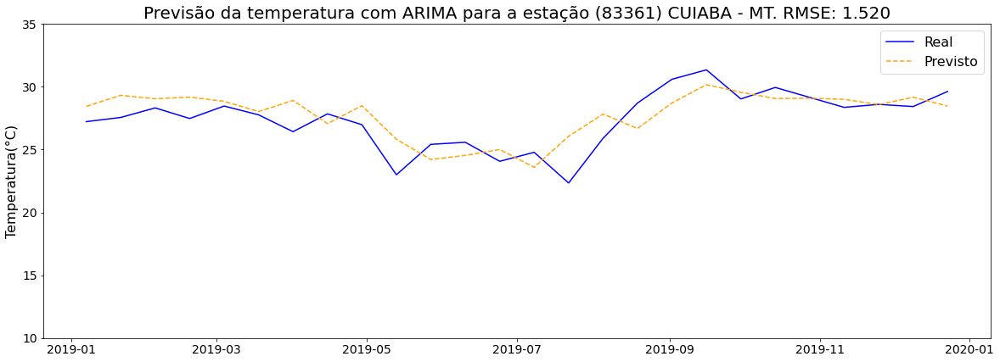

Station: 82807


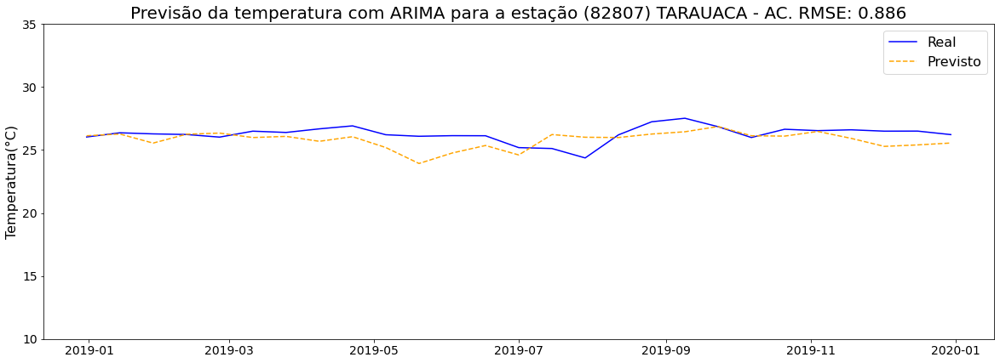

Station: 83464


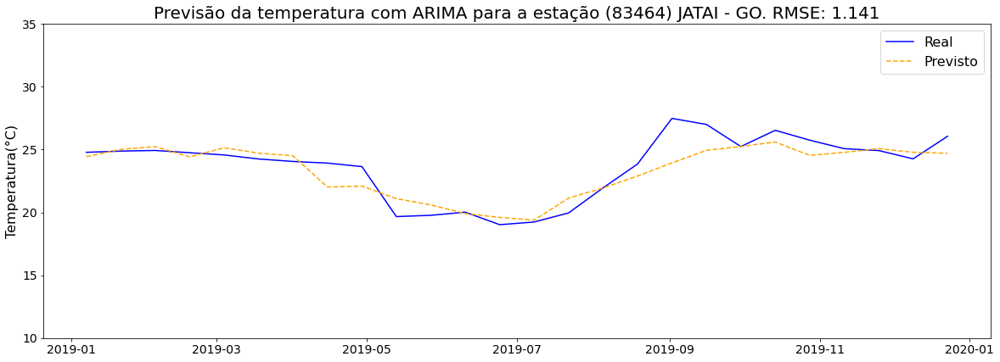

Station: 82791


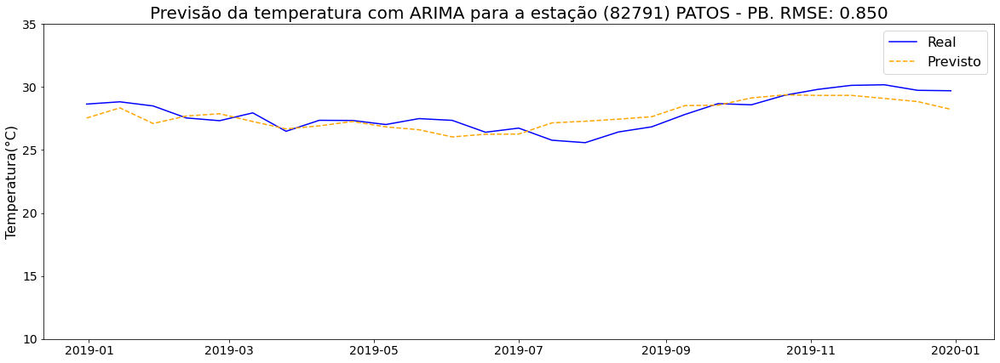

Station: 82445


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


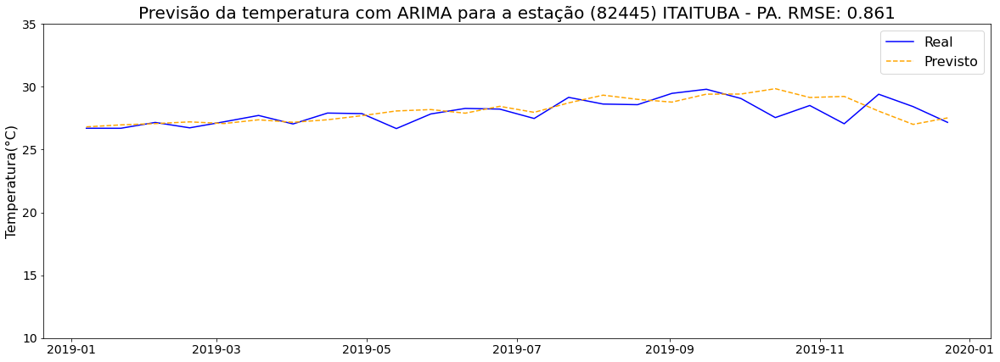

Station: 83781


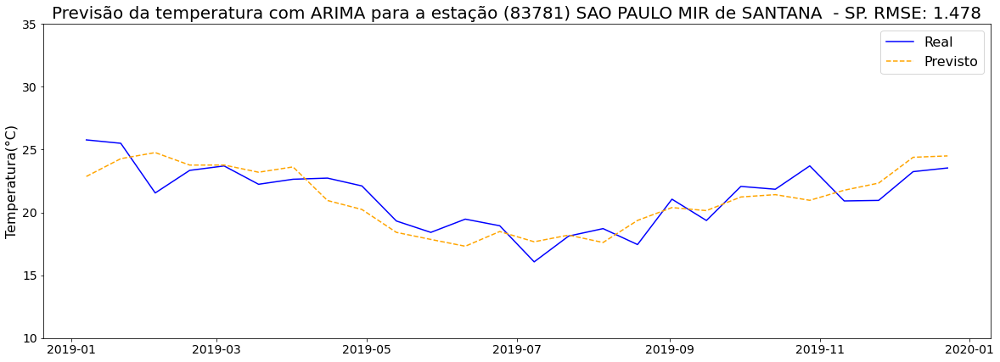

Station: 82683


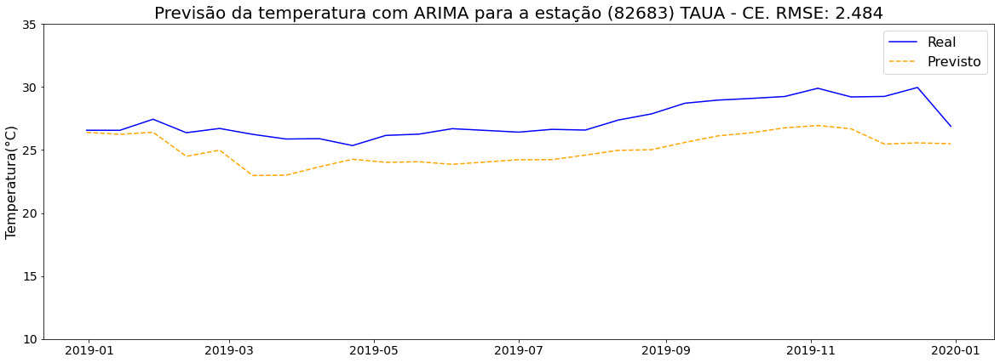

Station: A311


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


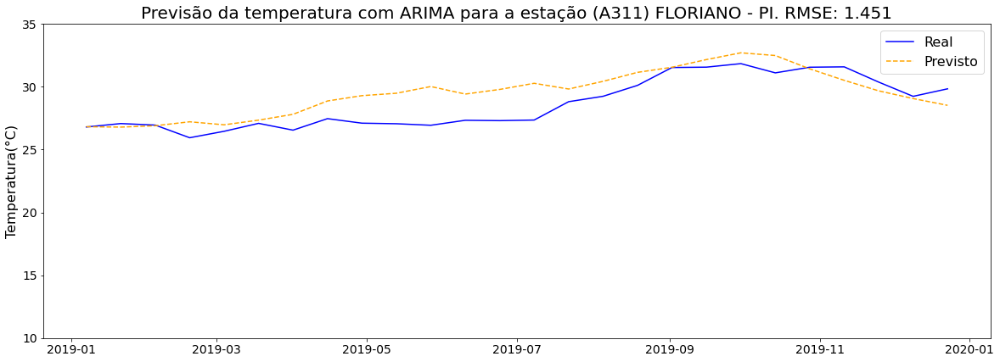

Station: A119


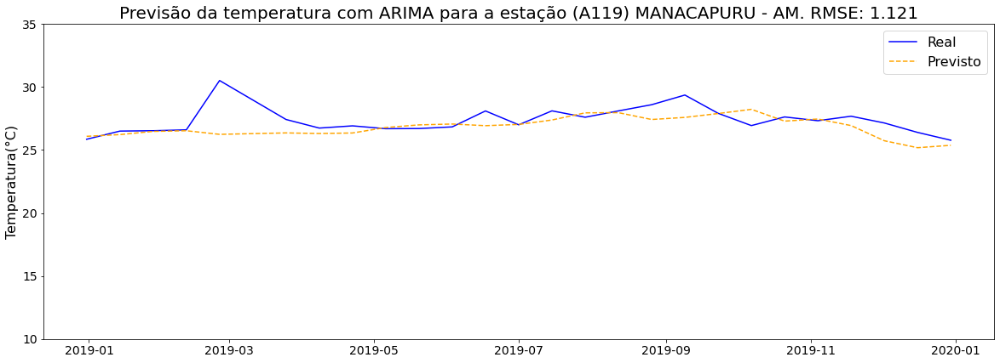

Station: A906


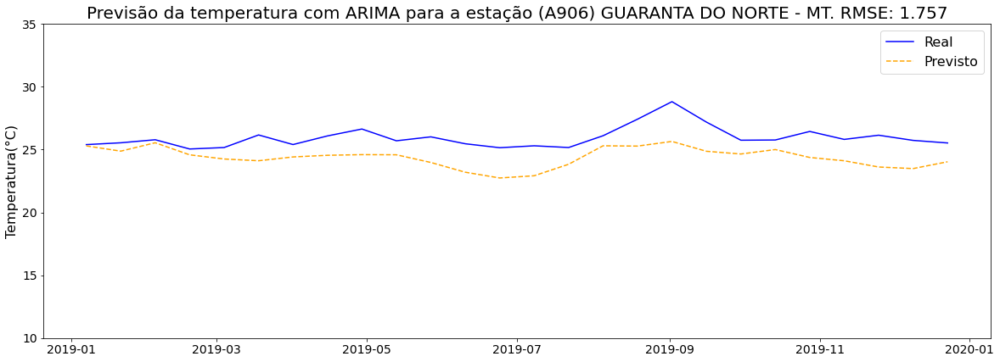

Station: A422


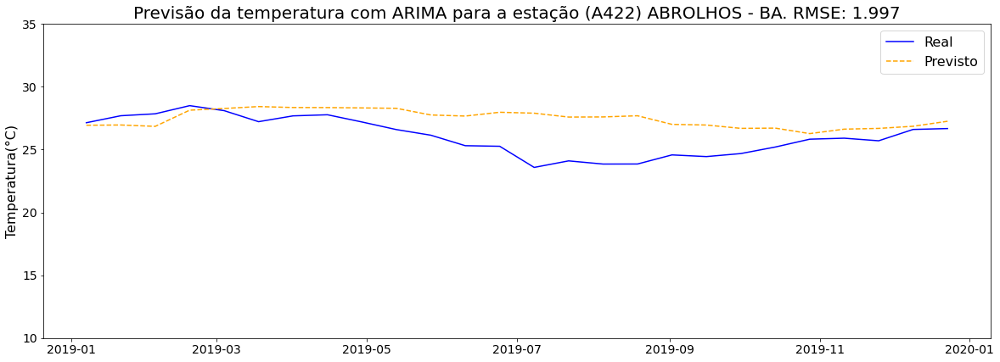

Station: A045


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


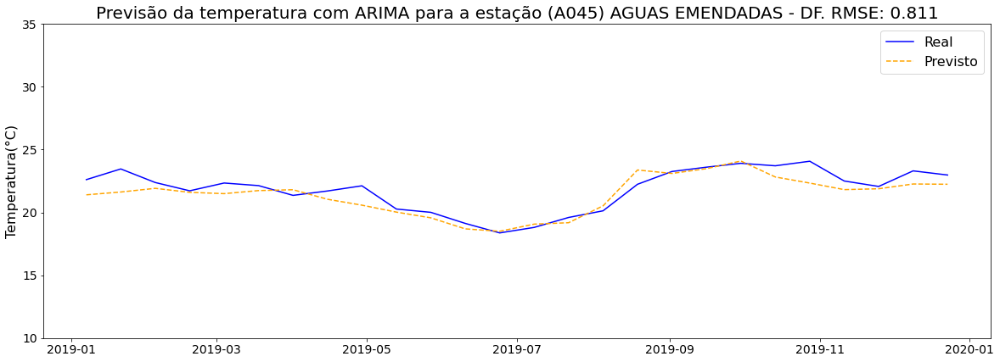

Station: A316


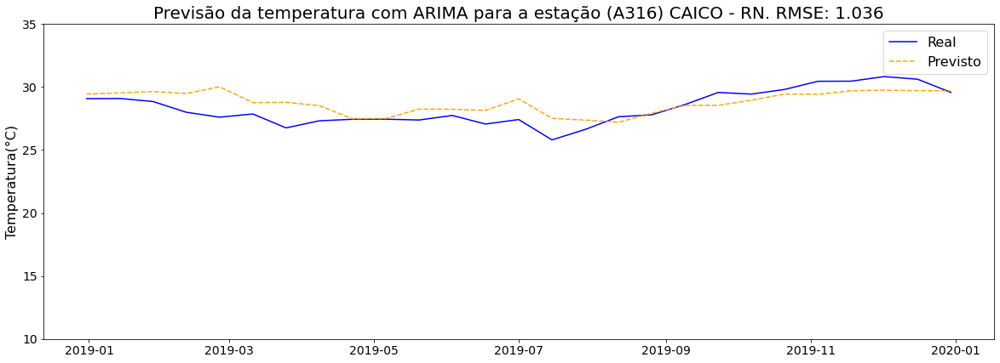

Station: A032


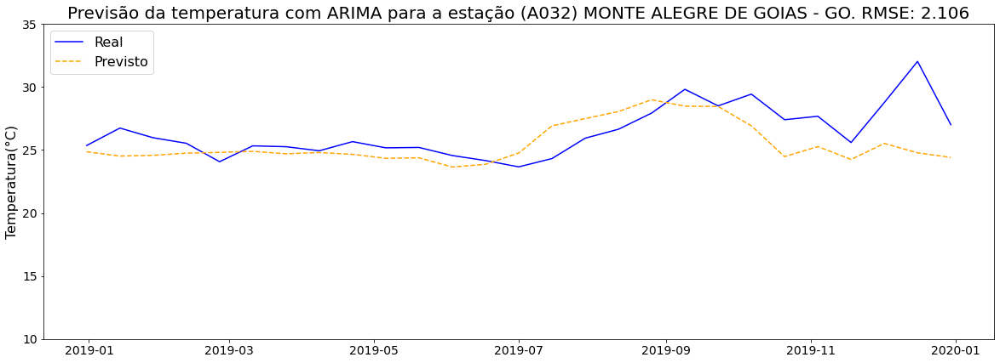

Station: A936


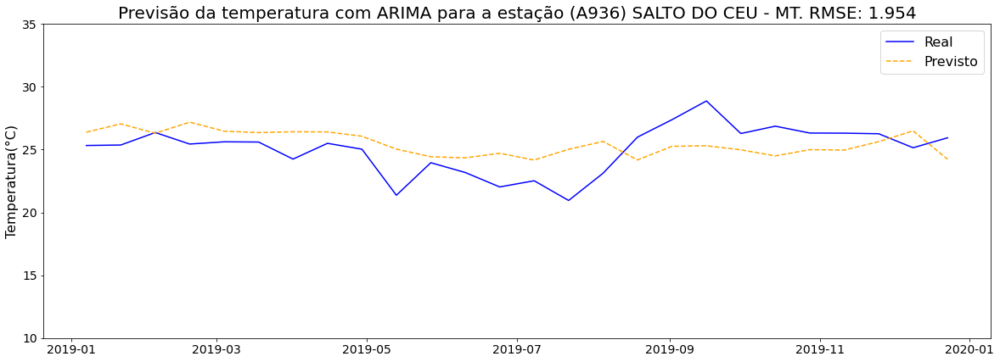

Station: A420


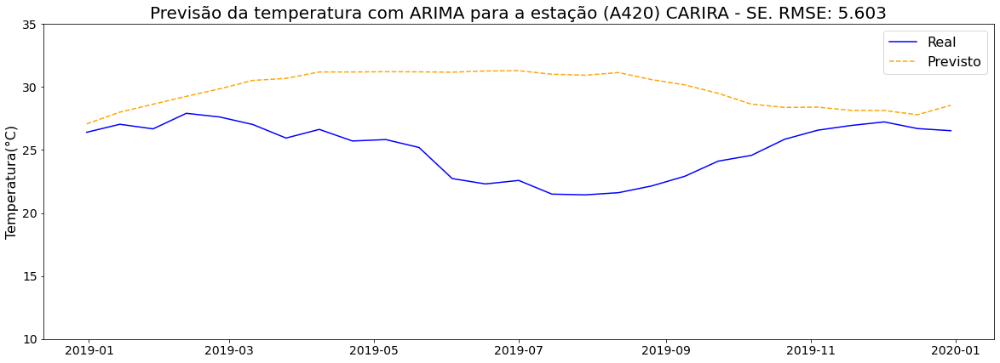

Station: A204


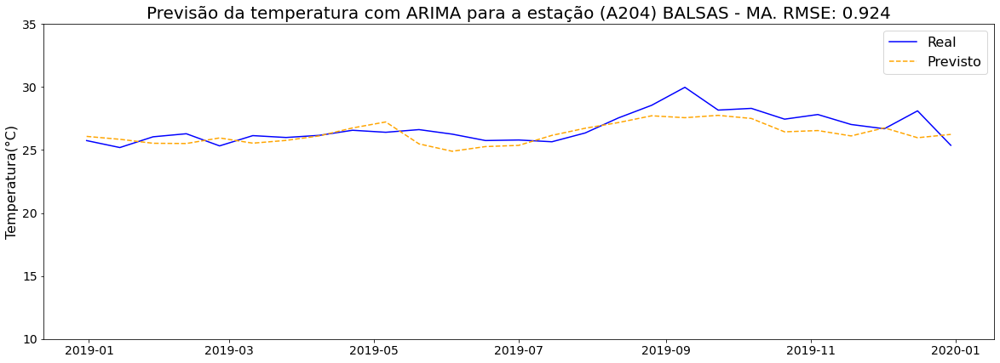

Station: A916


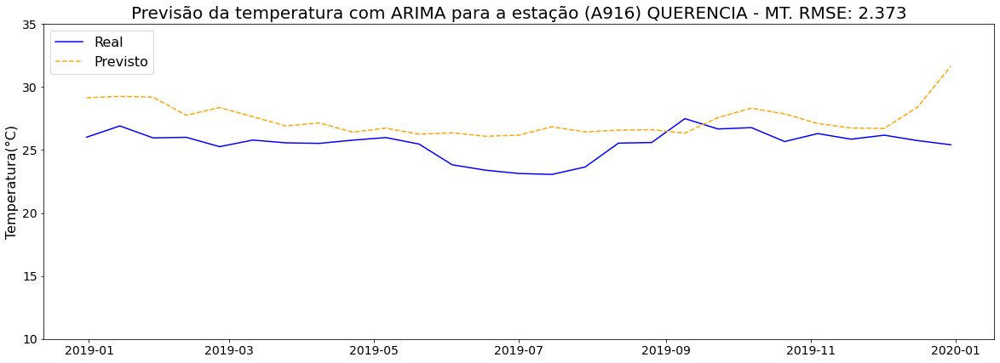

Station: A748


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


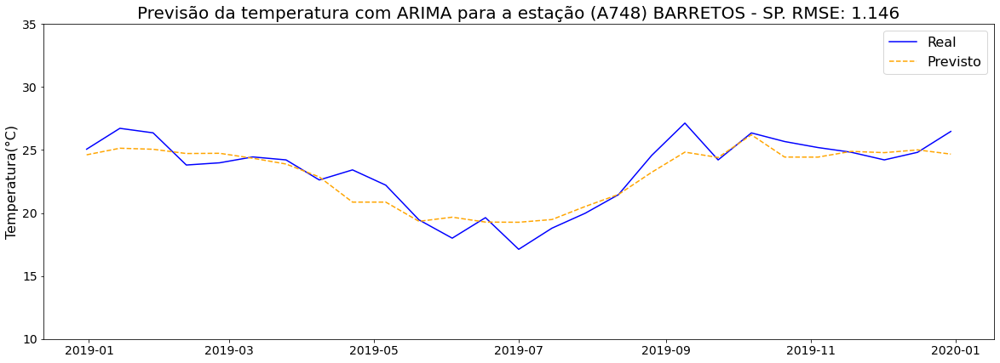

Station: A609


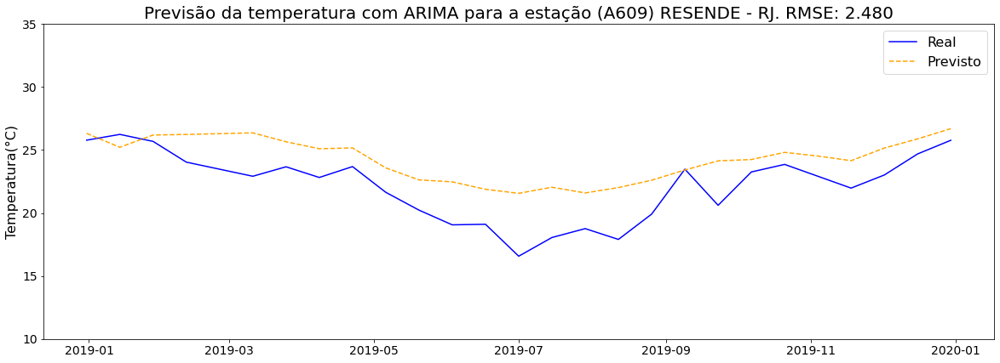

Station: A332


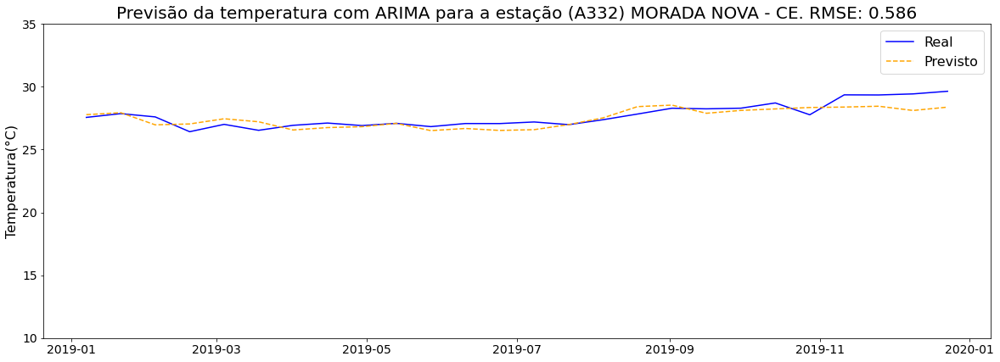

Station: A308


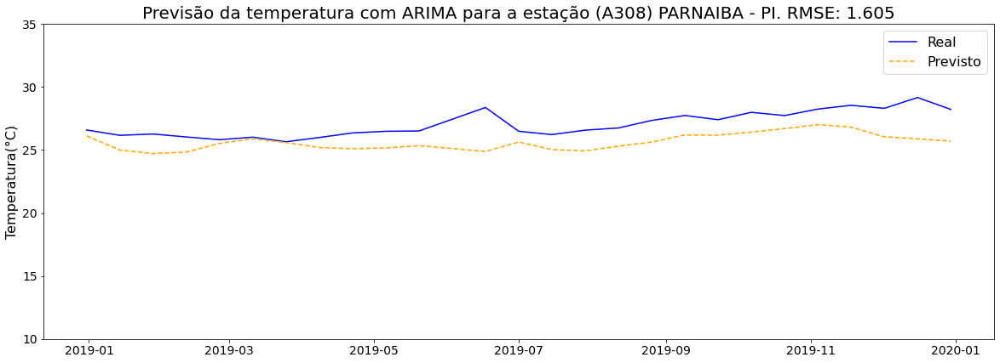

Station: A929


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


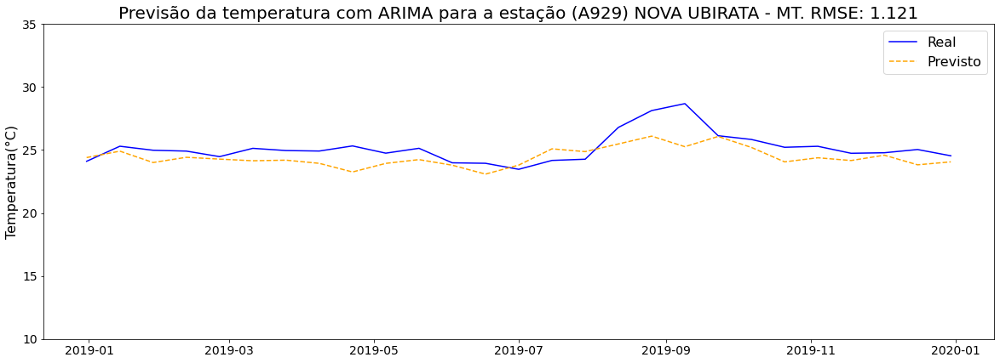

Station: A014


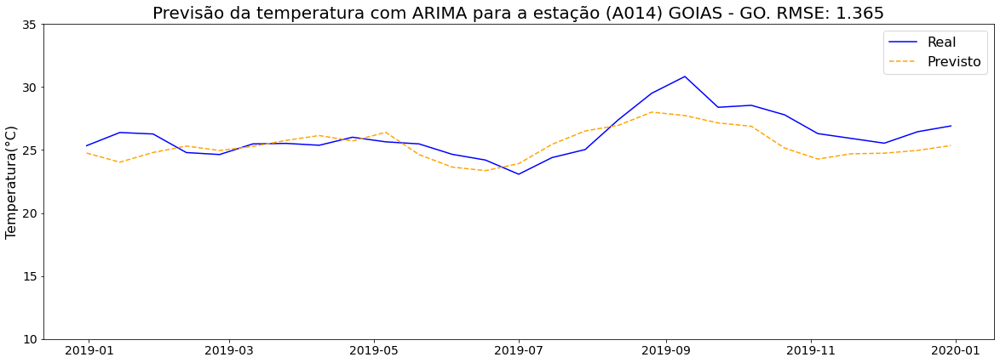

Station: A720


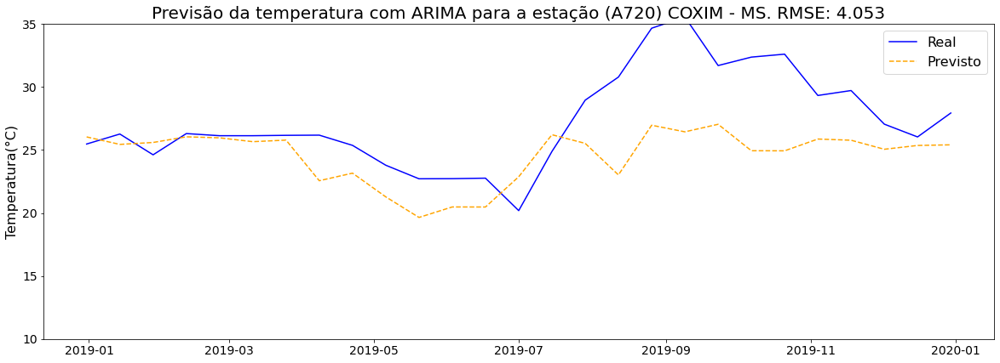

Station: A430


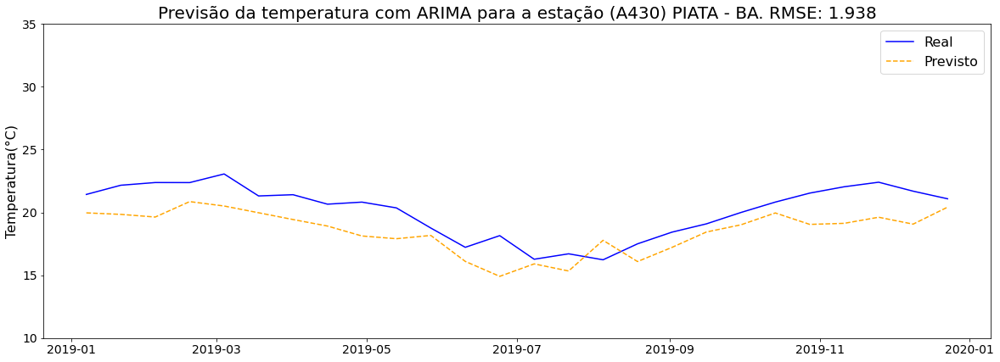

Station: A848


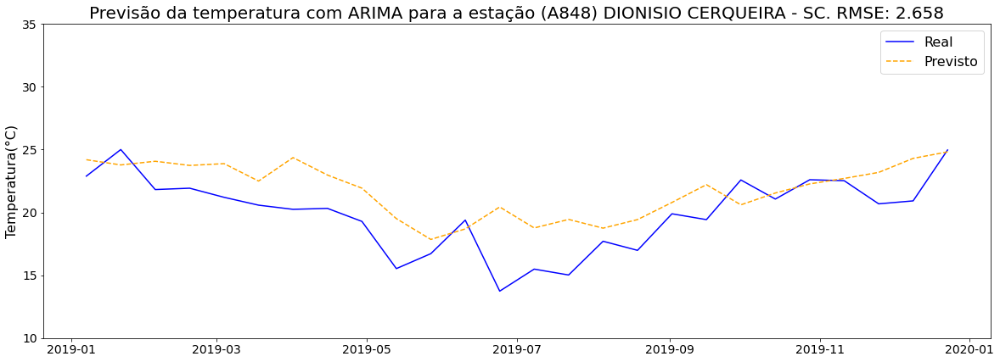

Station: A524


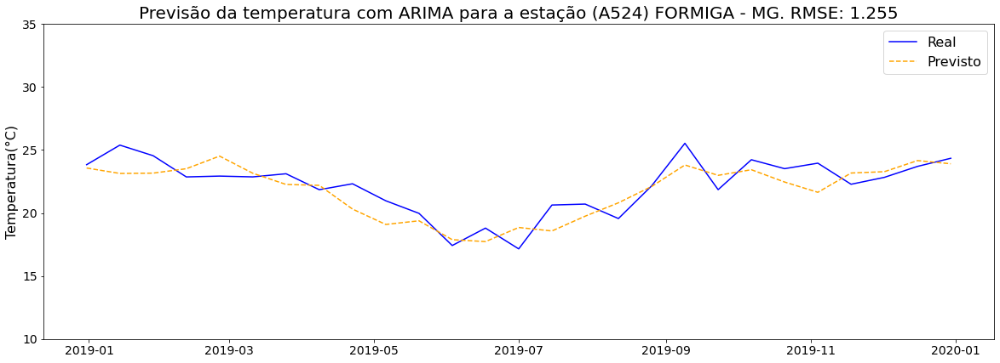

Station: A023


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


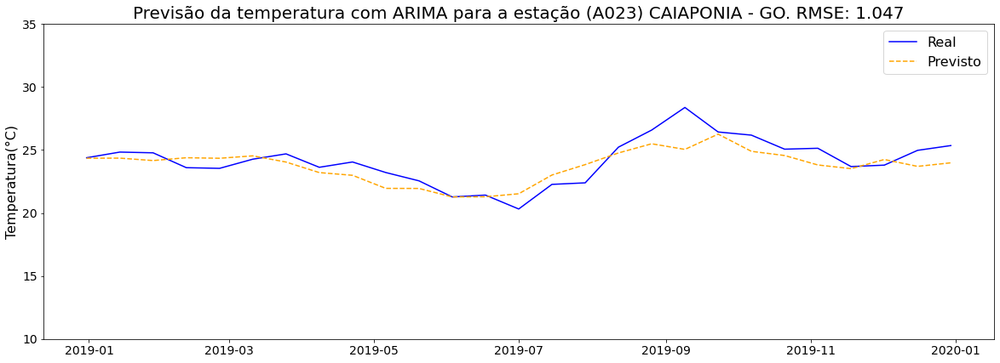

Station: A328


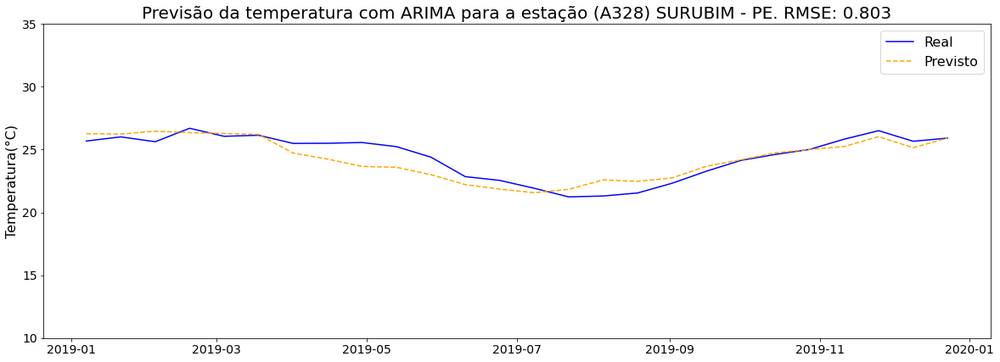

Station: A424


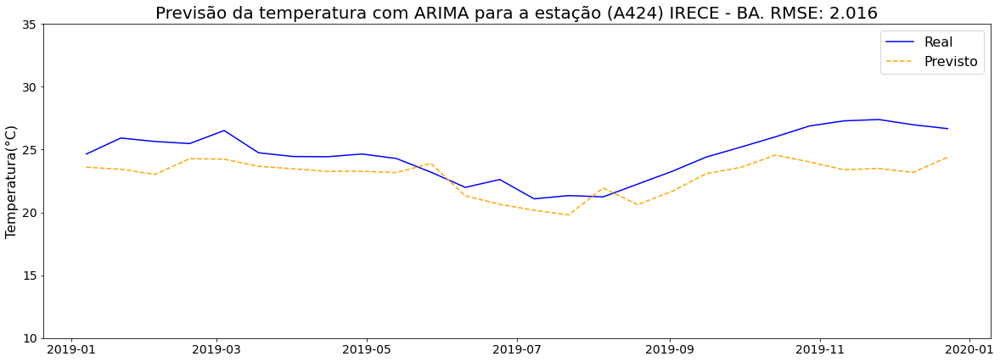

Station: A003


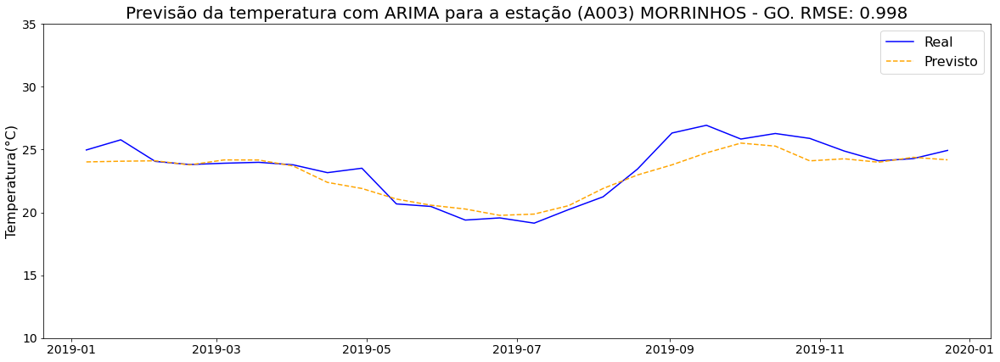

Station: A532


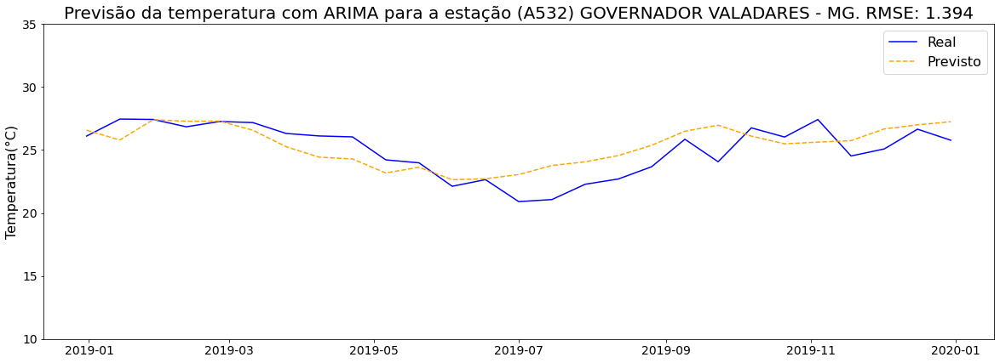

Station: A516


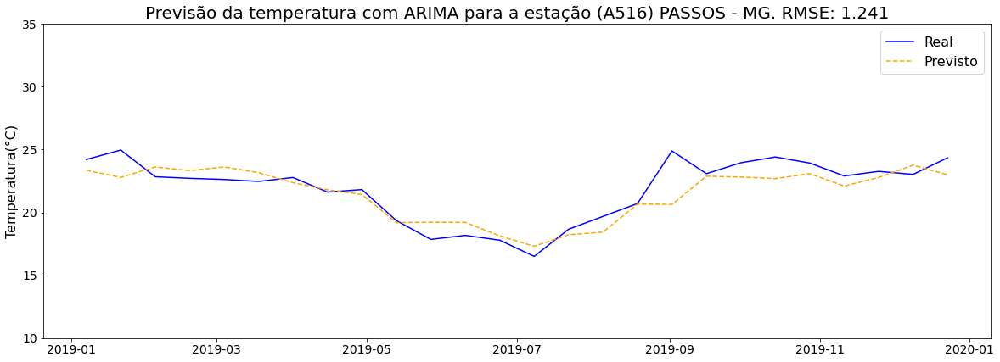

Station: A444


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


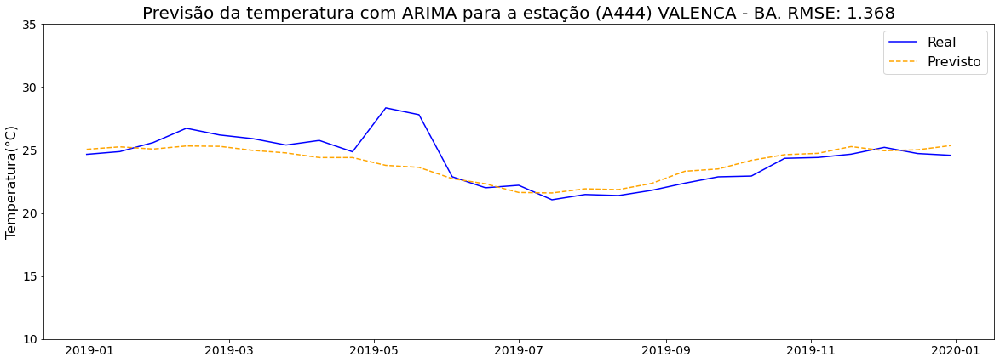

Station: A816


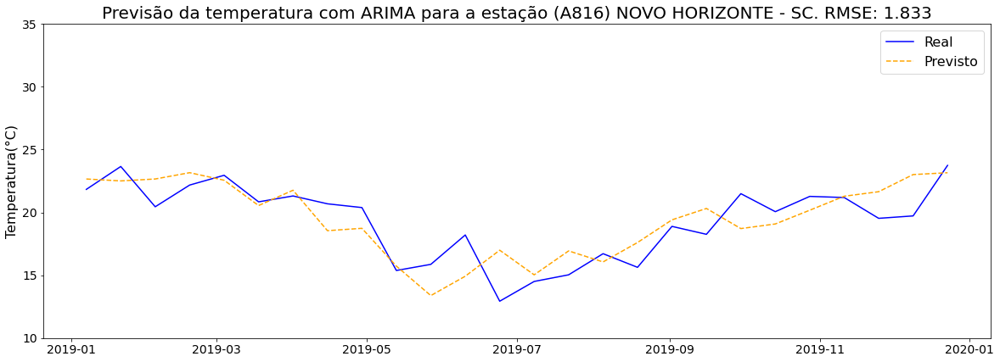

Station: A749


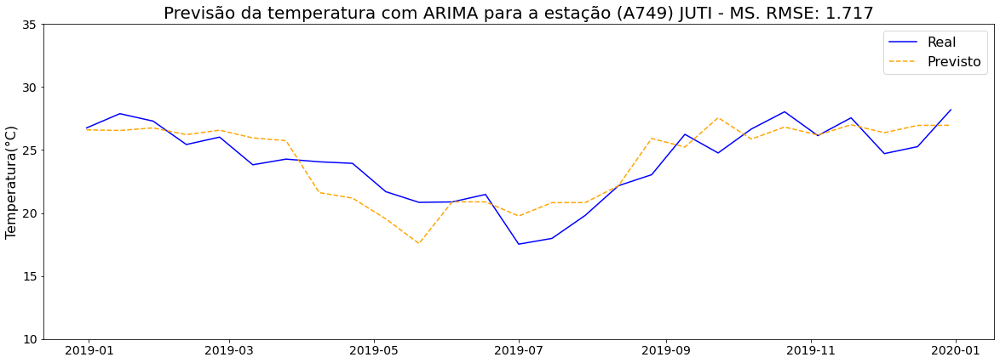

Station: A615


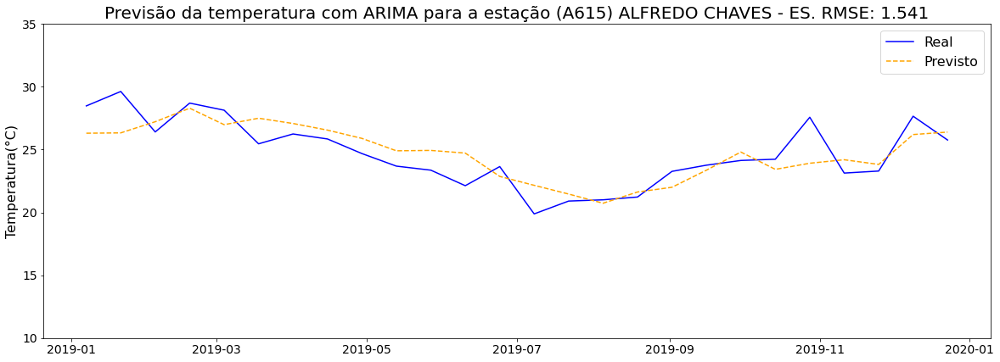

Station: A433


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


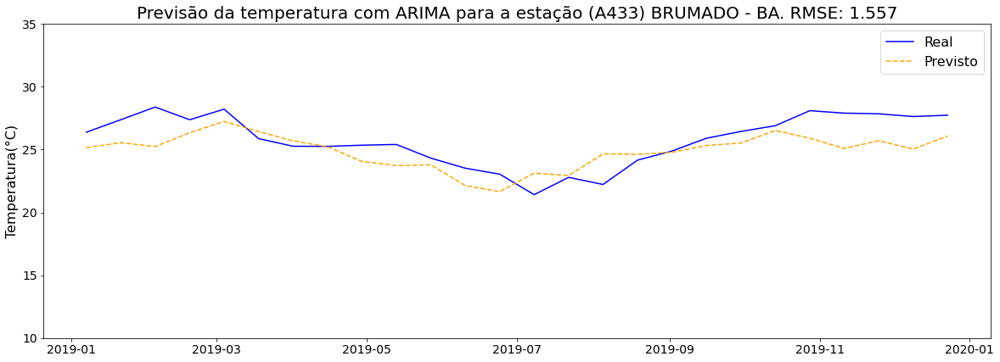

Station: A845


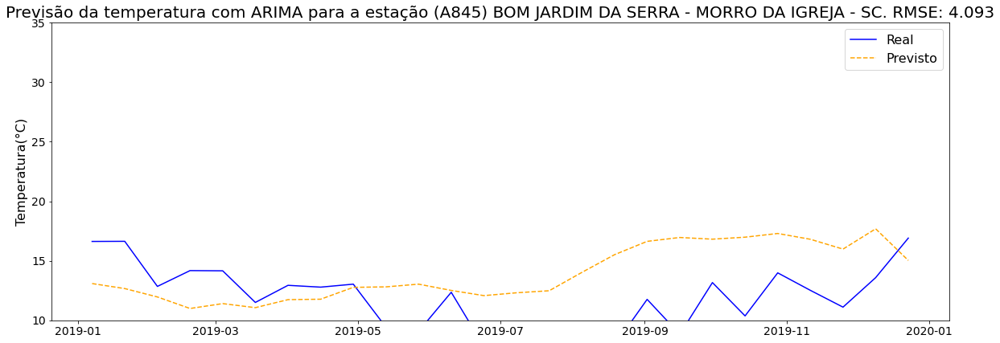

Station: A802


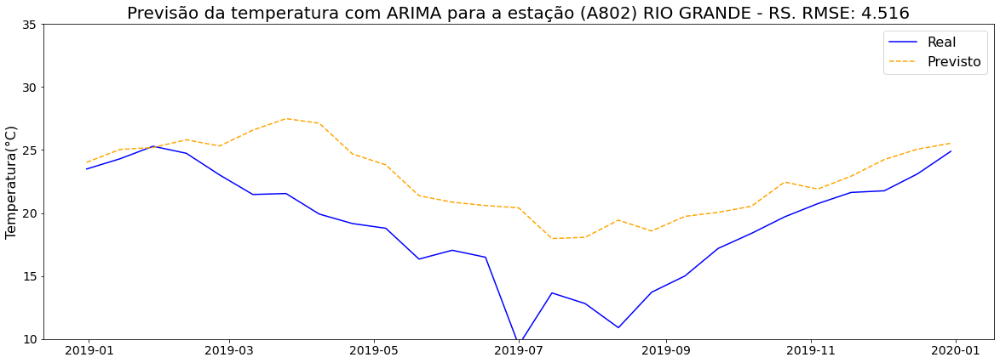

Station: A017


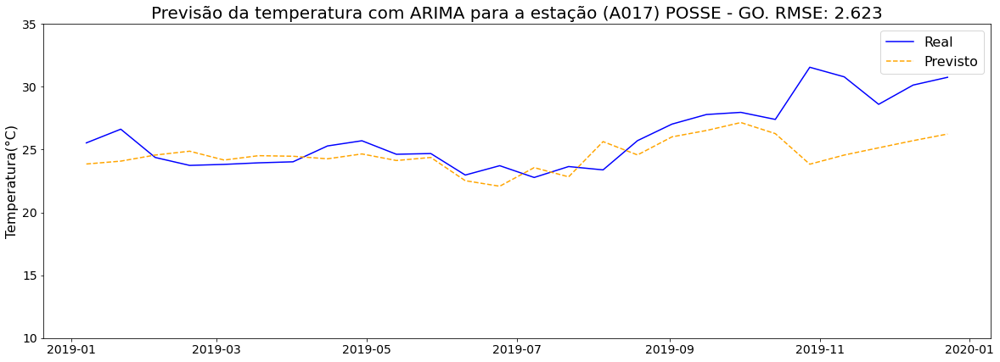

Station: A829


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


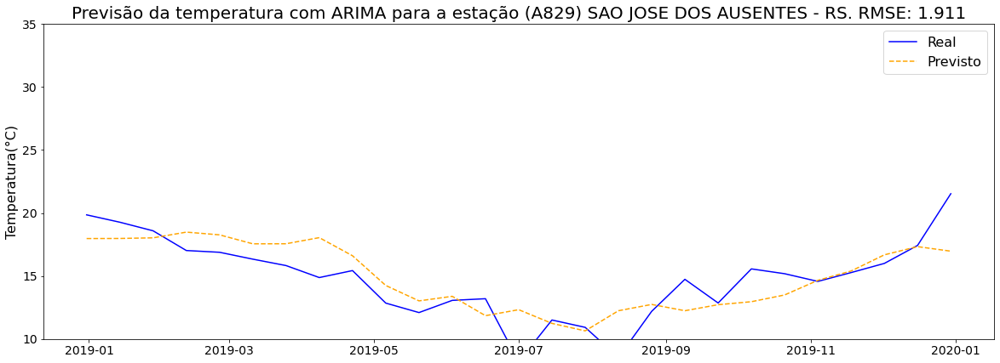

Station: A052


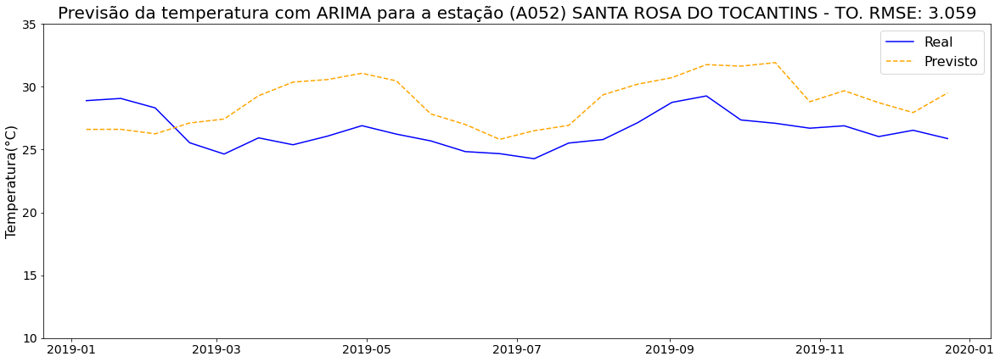

Station: A826


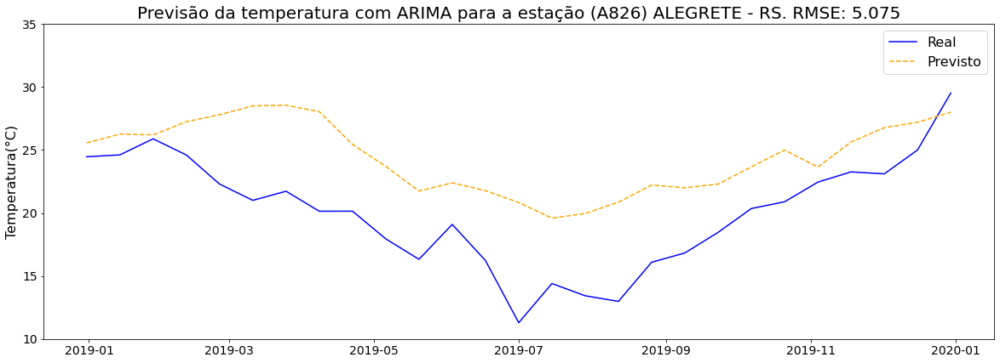

Station: A659


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:868: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  ' zeros.' % warning_description)


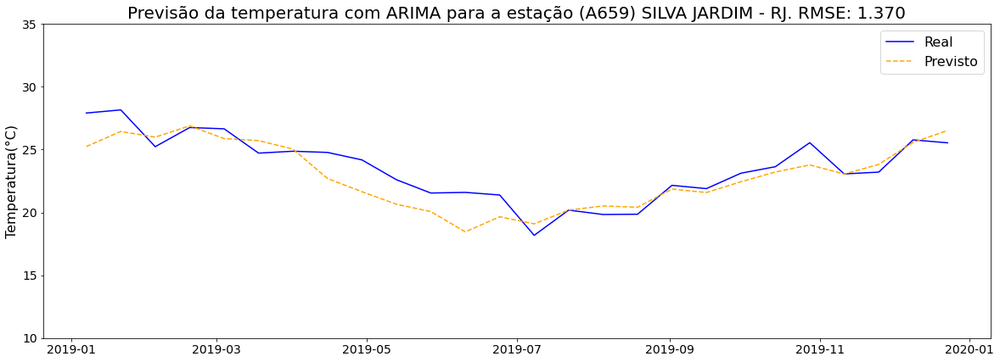

Station: A428


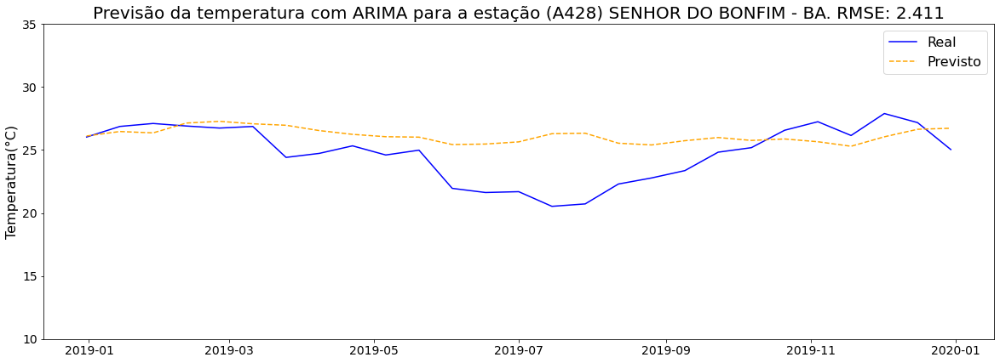

Station: A043


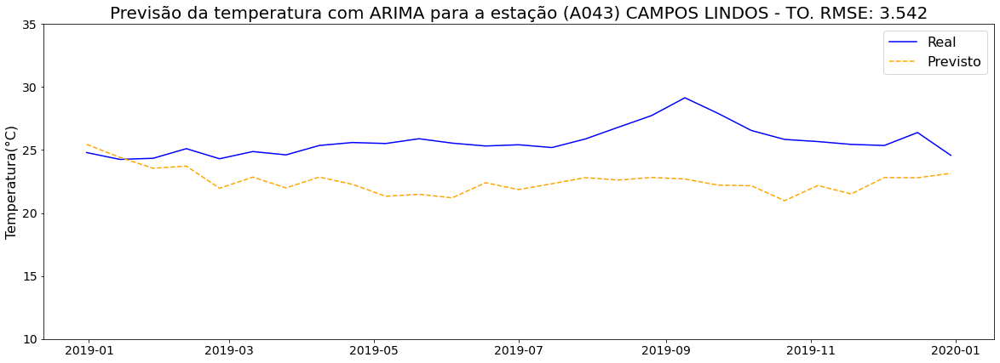

Station: A762


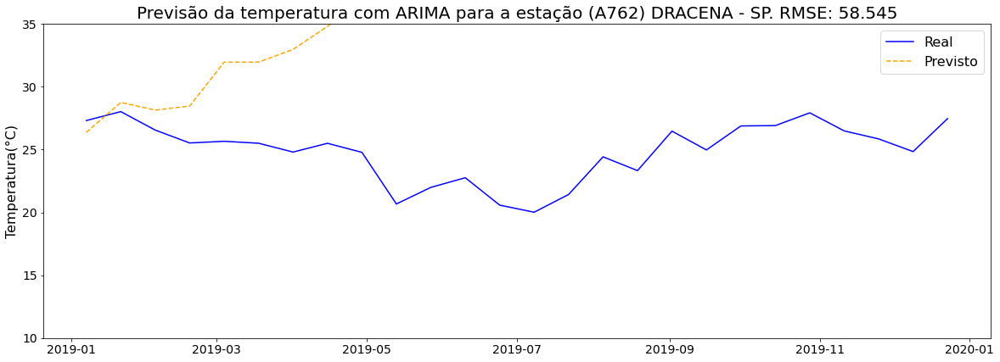

Station: 82723


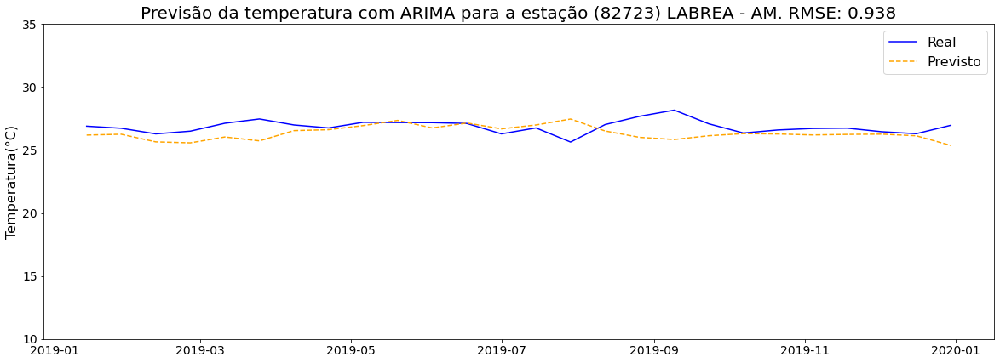

Station: 82376


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


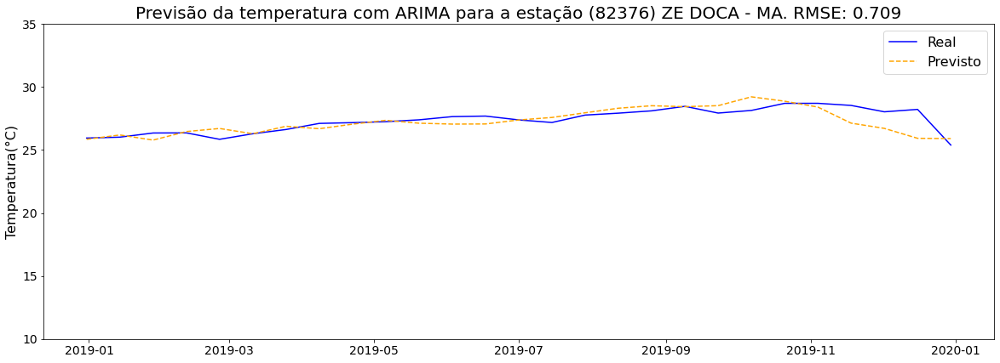

Station: 82690


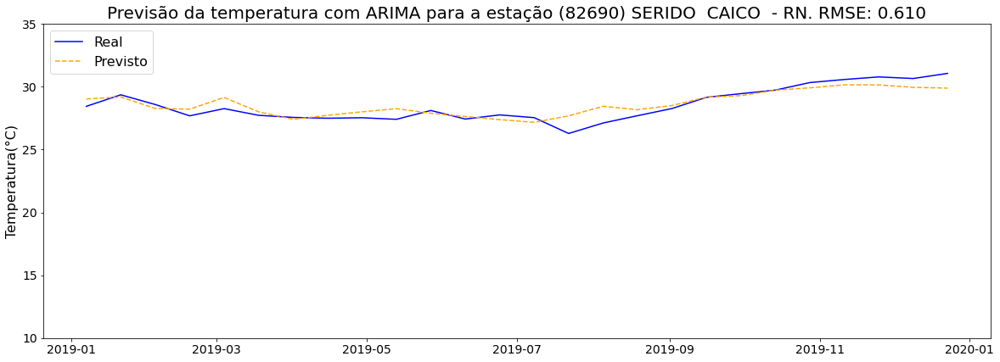

Station: 83919


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


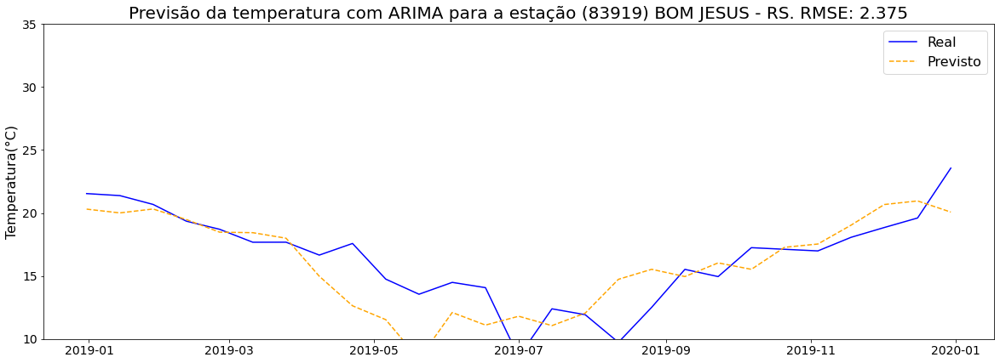

Station: 83687


----------------------------------------
Exception happened during processing of request from ('127.0.0.1', 34148)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 320, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 351, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 364, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 724, in __init__
    self.handle()
  File "/opt/spark/python/pyspark/accumulators.py", line 268, in handle
    poll(accum_updates)
  File "/opt/spark/python/pyspark/accumulators.py", line 241, in poll
    if func():
  File "/opt/spark/python/pyspark/accumulators.py", line 245, in accum_updates
    num_updates = read_int(self.rfile)
  File "/opt/spark/python/pyspark/serializers.py", line 595, in read_int
    r

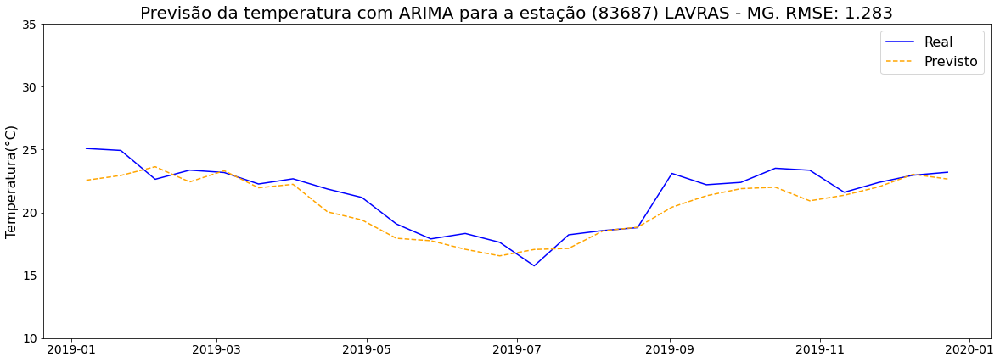

ERROR:py4j.java_gateway:An error occurred while trying to connect to the Java server (127.0.0.1:44909)
Traceback (most recent call last):
  File "/opt/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py", line 977, in _get_connection
    connection = self.deque.pop()
IndexError: pop from an empty deque

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py", line 1115, in start
    self.socket.connect((self.address, self.port))
ConnectionRefusedError: [Errno 111] Connection refused


Station: 82689


Py4JNetworkError: An error occurred while trying to connect to the Java server (127.0.0.1:44909)

In [194]:
for station_code in stations_samples:
    print("Station:", station_code)
    station_title = get_station_short_title(station_code)
    
    train_data, test_data = ts_input_output_split(station_code, start_date_prediction, end_date_prediction)
    
    if len(test_data) < period:
        print("Station {} skipped!".format(station_code))
        continue
        
    train_data_diff = train_data - train_data.shift(1)
    train_data_diff.dropna(inplace=True)
    
    params = adjusted_models[adjusted_models['station_code'] == station_code].iloc[0]
    
    if station_code in arima_saved_models:
        arima_model = arima_saved_models.get(station_code).get('model')
    else:
        arima_model = ARIMA(order=(params.get('p'), params.get('d'), params.get('q')), 
                      seasonal_order=(params.get('P'), params.get('D'), params.get('Q'), params.get('m')))
        arima_model.fit(train_data_diff)
    
    fitted = arima_model.predict(n_periods=len(test_data))
    
    fitted_ajust = pd.Series(fitted).expanding(min_periods=0).sum() + train_data.values[-1][0]
    
    rmse, fitted_index = expected_vs_predicted(station_code, test_data, fitted_ajust)
    plt.title("Previsão da temperatura com ARIMA para a estação %s. RMSE: %.3f" % (station_title, rmse, ), fontsize=20)
    plt.ylabel('Temperatura(°C)', fontsize=16)
    plt.xlabel(None)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(['Real', 'Previsto'], fontsize=16)

    plt.savefig('figures/results_arima_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()

    fitted_index['station_code'] = station_code
    
    arima_saved_models[station_code] = {
        'model': arima_model, 
        'rmse': rmse
    }

print("Modelos ajustados: ")
for s in arima_saved_models.keys():
    m = arima_saved_models[s]['model']
    print("Station: {code} Model: {order} {s_order} RMSE: {rmse}".format(
        code=s, order=m.order, s_order=m.seasonal_order, rmse=arima_saved_models[s]['rmse']))
    
print("Global RMSE:", np.mean(list(map(lambda x: x.get('rmse'), arima_saved_models.values()))))

# LSTM

### Construindo o conjunto de treinamento

In [93]:
lstm_data = data.select('Temperatura', 'date')

periods = [
    ['2019-01-01', '2019-12-31'],
    ['2018-01-01', '2018-12-31'],
    ['2017-01-01', '2017-12-31'],
    ['2016-01-01', '2016-12-31'],
    ['2015-01-01', '2015-12-31'],
    ['2014-01-01', '2014-12-31'],
    ['2013-01-01', '2013-12-31'],
    ['2012-01-01', '2012-12-31'],
    ['2011-01-01', '2011-12-31'],
    ['2010-01-01', '2010-12-31'],
]

lstm_x = []
lstm_y = []

lstm_stations_code = list(set(stations_list).difference(set(stations_samples)))

for lstm_station_code in tqdm.tqdm(lstm_stations_code):    
    station_data = lstm_data.filter(func.col('station_code') == lstm_station_code).toPandas().dropna()   
    station_data.index = pd.DatetimeIndex(station_data['date']).to_period('D')
    
    for start_predict, end_predict in periods:
        lstm_x_data = station_data.loc[:start_predict]
        lstm_x_data = lstm_x_data.resample(frequence).mean()
        lstm_x_data = lstm_x_data.dropna()
        
        lstm_y_data = station_data.loc[start_predict:end_predict]
        lstm_y_data = lstm_y_data.resample(frequence).mean()
        lstm_y_data = lstm_y_data.dropna()
        
        if(len(lstm_y_data.values) < 26):
            continue


        lstm_x.append(lstm_x_data.values)
        lstm_y.append(lstm_y_data.values)

lstm_x = np.array(lstm_x)
lstm_y = np.array(lstm_y)

100%|██████████| 790/790 [38:28<00:00,  2.92s/it]


In [94]:
np.save('lstm_x.npy', lstm_x)
np.save('lstm_y.npy', lstm_y)

In [19]:
lstm_x_data = np.load('lstm_x.npy', allow_pickle=True)
lstm_y_data = np.load('lstm_y.npy', allow_pickle=True)

In [20]:
x = []
y = []

for index, value in enumerate(lstm_x_data):
    serie_values = keras.preprocessing.sequence.pad_sequences([value],maxlen=1500, dtype='float32')[0]
    x.append(serie_values)

for index, value in enumerate(lstm_y_data):
    serie_values = keras.preprocessing.sequence.pad_sequences([value],maxlen=26, dtype='float32')[0]
    y.append(np.array(serie_values))
    
lstm_x_data = np.array(x)
lstm_y_data = np.array(y)

lstm_y_data = lstm_y_data.reshape((lstm_y_data.shape[0], lstm_y_data.shape[1]))

print(lstm_x_data.shape, lstm_y_data.shape)

(5137, 1500, 1) (5137, 26)


### Normalizando o conjunto de dados de treinamento 

In [21]:
scaler_filename = 'lstm_scaler.save'

if os.path.exists(scaler_filename):
    print("Loading saved scaler...")
    scaler = joblib.load(scaler_filename) 
else: 
    scaler = MinMaxScaler()
    scaler.fit(lstm_x_data.reshape(-1, lstm_x_data.shape[-1]))
    joblib.dump(scaler, scaler_filename)


for i, value in enumerate(lstm_x_data):
    value = value[~np.isnan(value).any(axis=1)]
    lstm_x_data[i] = scaler.transform(value)

for i, value in enumerate(lstm_y_data):
    value = value[~np.isnan(value).any()]
    lstm_y_data[i] = scaler.transform(value)

Loading saved scaler...


/usr/local/lib/python3.6/dist-packages/sklearn/base.py:334: UserWarning: Trying to unpickle estimator MinMaxScaler from version 0.22.2.post1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [115]:
lstm_y_data[7]

array([0.5656607 , 0.61677855, 0.6066335 , 0.5602818 , 0.55486065,
       0.5535039 , 0.5024526 , 0.45594257, 0.43021065, 0.43994012,
       0.36928123, 0.38402385, 0.3911432 , 0.3094656 , 0.30575836,
       0.3313661 , 0.39286938, 0.39476252, 0.422591  , 0.42662233,
       0.44094935, 0.43930686, 0.48749894, 0.51397926, 0.5176518 ,
       0.5404773 ], dtype=float32)

In [116]:
print(lstm_x_data.shape, lstm_y_data.shape)

(5137, 1500, 1) (5137, 26)


### Modelo de rede neural LSTM

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 1500, 128)         66560     
_________________________________________________________________
lstm_1 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dense (Dense)                (None, 26)                3354      
Total params: 201,498
Trainable params: 201,498
Non-trainable params: 0
_________________________________________________________________


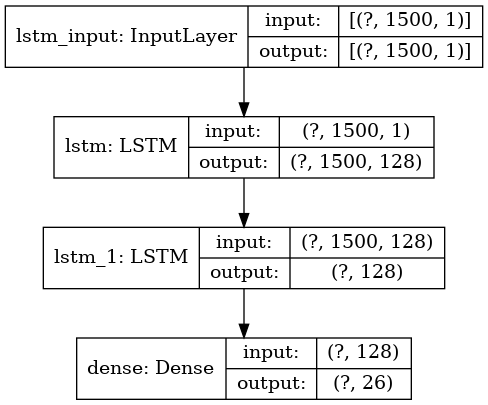

In [23]:
lstm_model = Sequential()

input_shape = (lstm_x_data.shape[1], 1)

lstm_model.add(LSTM(128, return_sequences=True, input_shape=input_shape))

lstm_model.add(LSTM(128))

lstm_model.add(Dense(lstm_y_data.shape[1]))

optimizer = keras.optimizers.Adam(learning_rate=0.001, clipvalue=1.0)

lstm_model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])

lstm_model.summary()

keras.utils.plot_model(lstm_model, show_shapes=True, to_file='lstm_model.png')

### Treinando o modelo LSTM

In [24]:
model_path = 'lstm_trained_model.h5'

callback = keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=5, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

if os.path.exists(model_path):
    print("Loading trained model...")
    lstm_model = tf.keras.models.load_model(model_path)
else:
    history = lstm_model.fit(lstm_x_data, lstm_y_data, 
                        epochs=200, 
                        batch_size=128, 
                        validation_split=0.25, 
                        verbose=1, 
                        callbacks=[callback]) 

    # plot history
    plt.figure(figsize=(20,8))
    plt.plot(history.history['loss'], label='Perda do Treinamento')
    plt.plot(history.history['val_loss'], label='Perda da Validação')
    plt.legend()
    plt.ylabel('Perda do Modelo')
    plt.xlabel('Épocas')
    plt.show()

    plt.savefig('gradico_perda.png', dpi=300, bbox_inches='tight')

Loading trained model...


### Salvando o modelo LSTM

In [ ]:
model.save(model_path) 

### Previsão do ano de 2019 para as 88 estações avaliadas usando o modelo LSTM

In [25]:
lstm_saved_models = {}

Station: (A732) SAO GABRIEL DO OESTE - MS


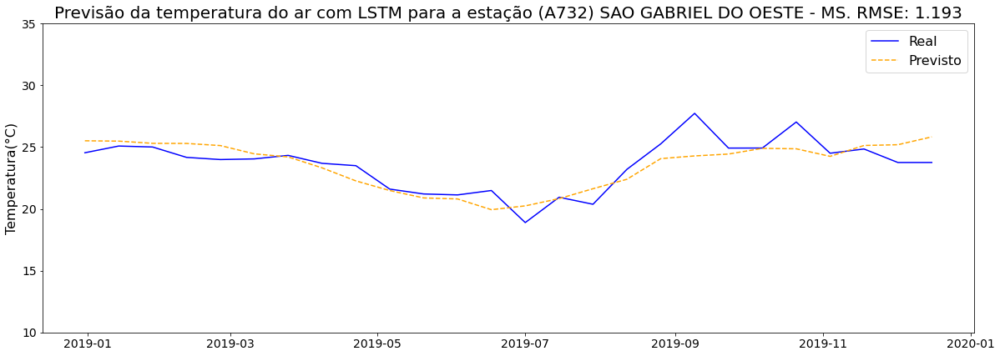

Station: (A753) ITUVERAVA - SP


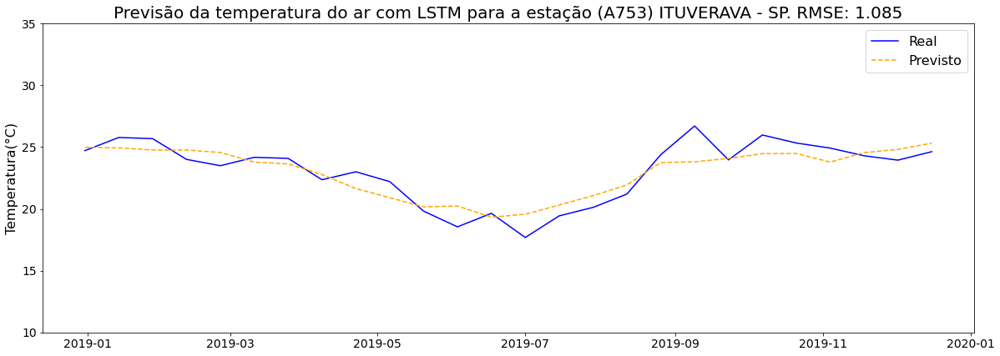

Station: (A734) VALPARAISO - SP


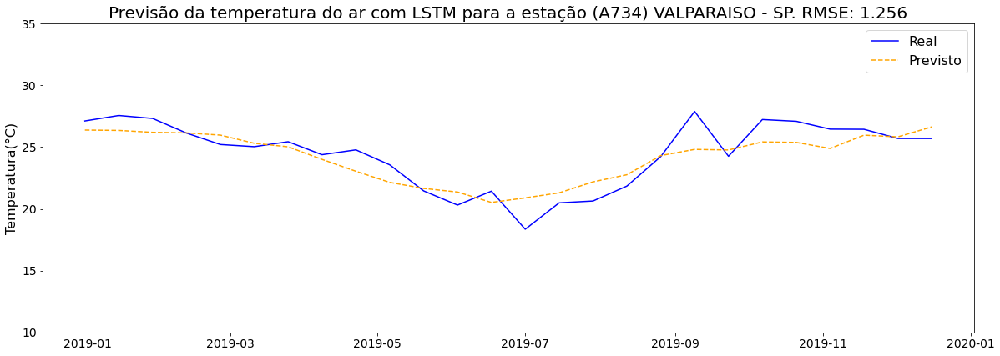

Station: (A723) PORTO MURTINHO - MS


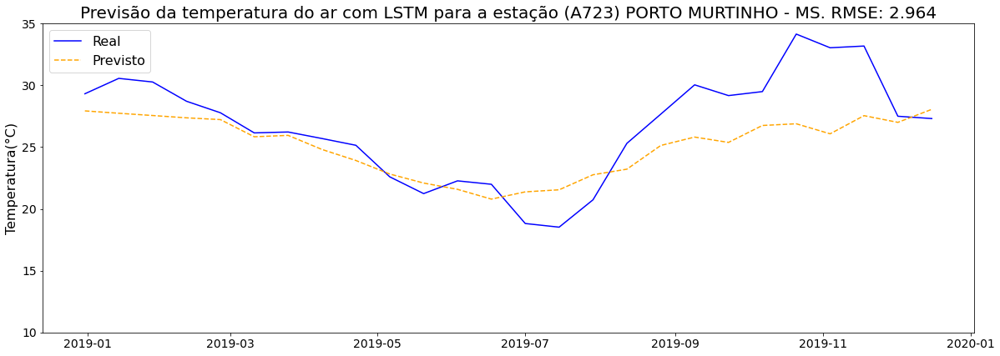

Station: (A858) XANXERE - SC


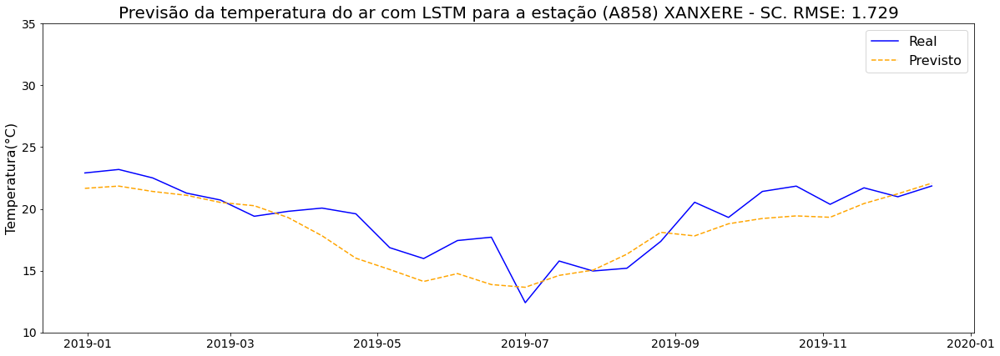

Station: (A612) VITORIA - ES


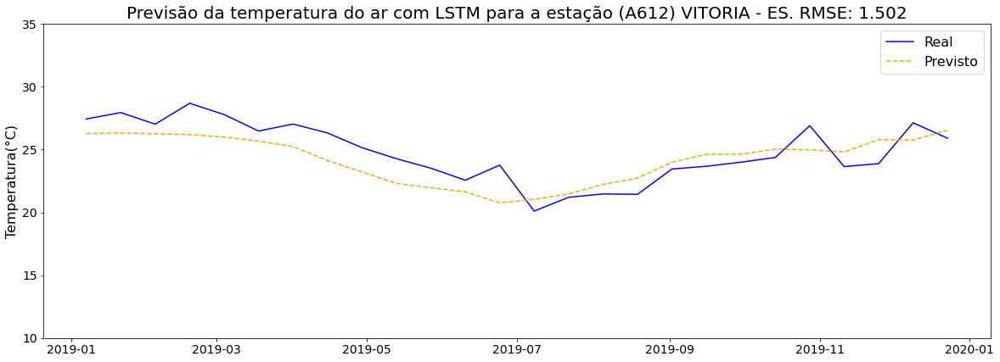

Station: (A345) SAO RAIMUNDO NONATO - PI


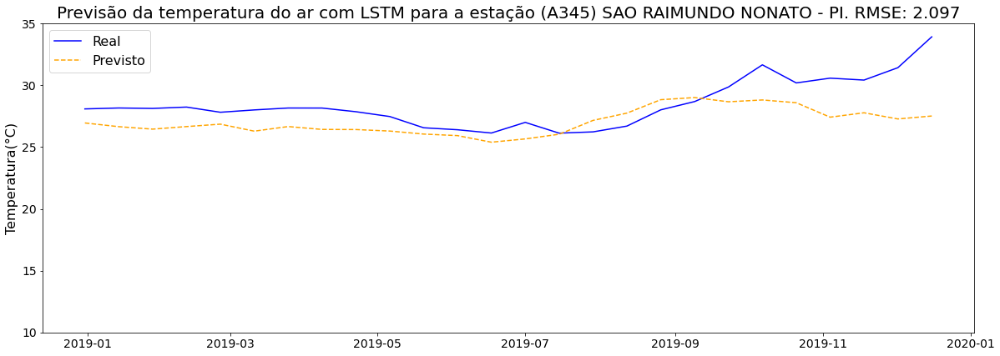

Station: (A866) Laguna  - Farol de Santa Marta - SC


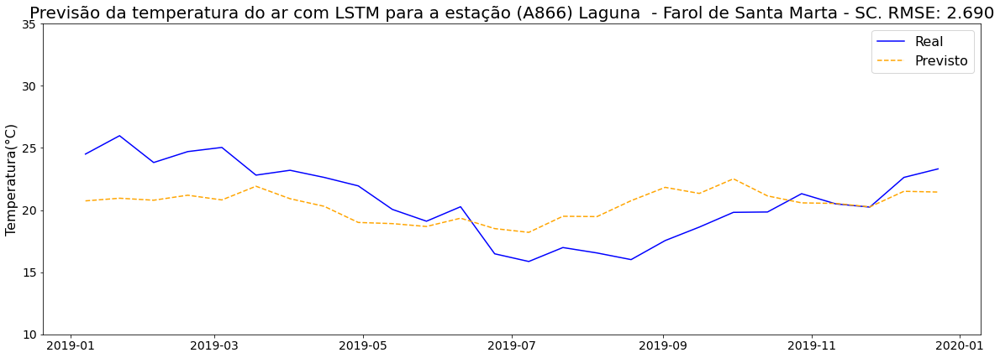

Station: (A830) SAO BORJA - RS


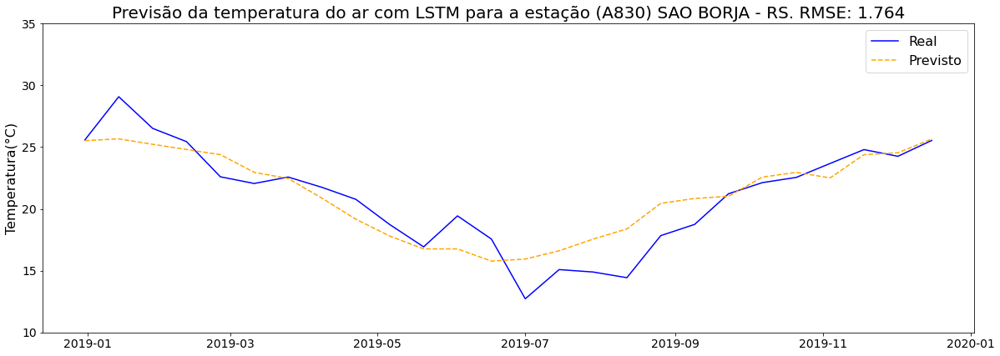

Station: (A931) SANTO ANTONIO DO LESTE - MT


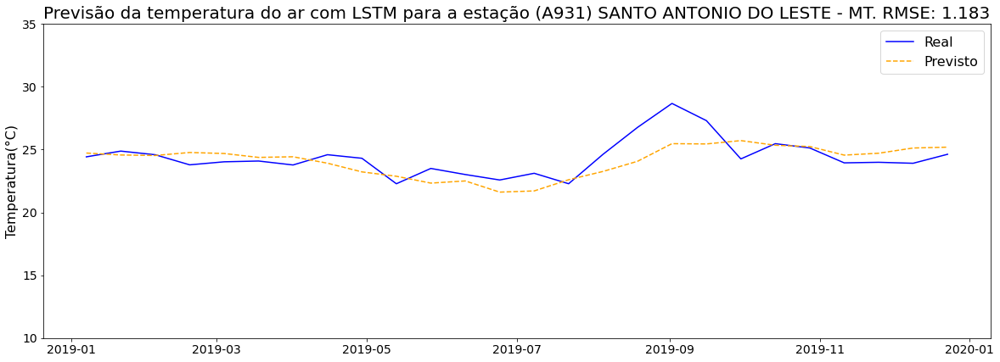

Station: (A716) OURINHOS - SP


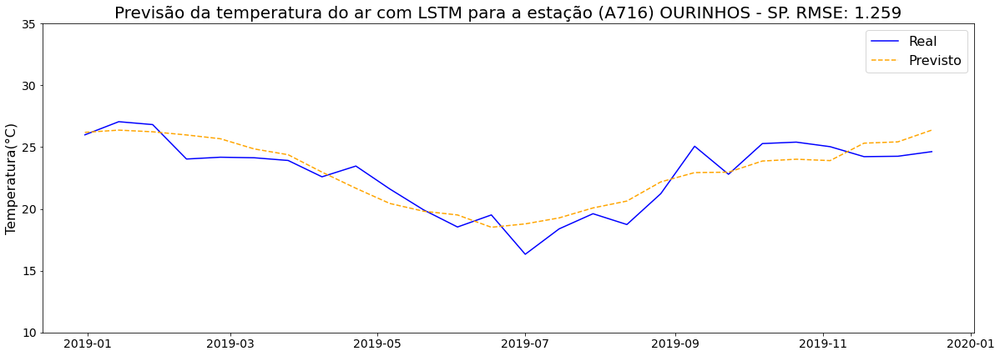

Station: (A882) TEUTONIA - RS


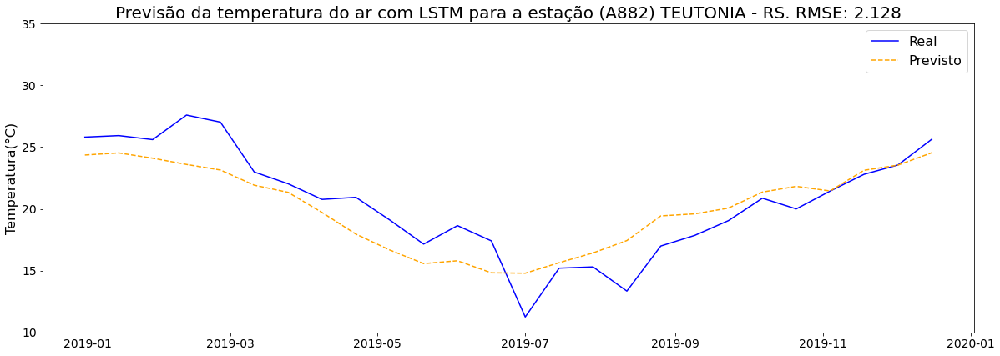

Station: (A525) SACRAMENTO - MG


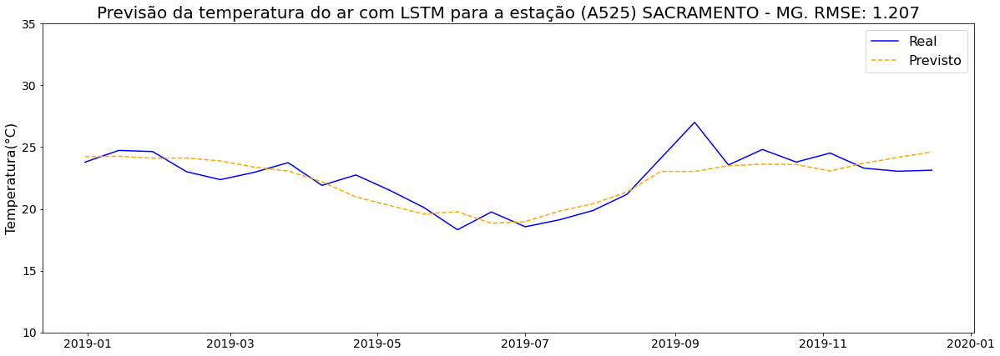

Station: (A541) CAPELINHA - MG


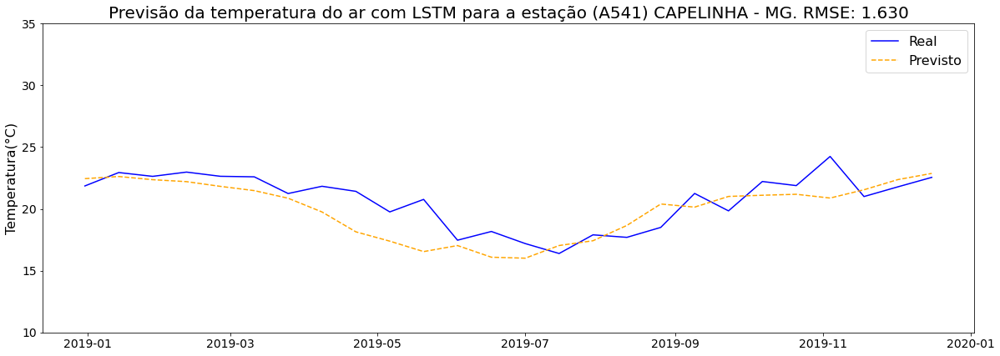

Station: (A805) SANTO AUGUSTO - RS


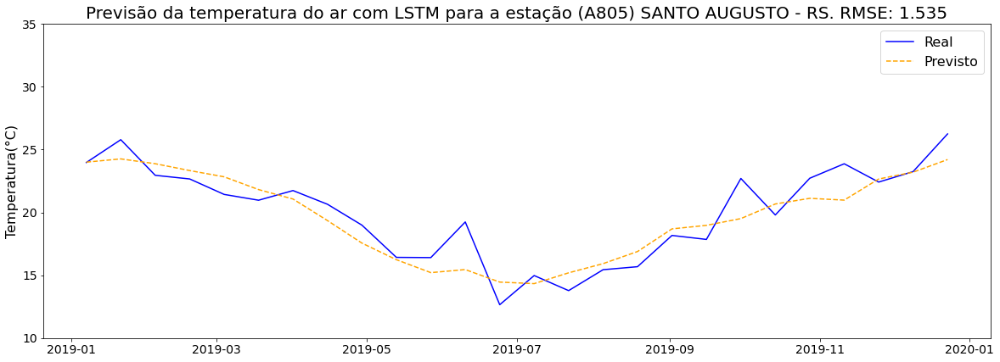

Station: (A606) ARRAIAL DO CABO - RJ


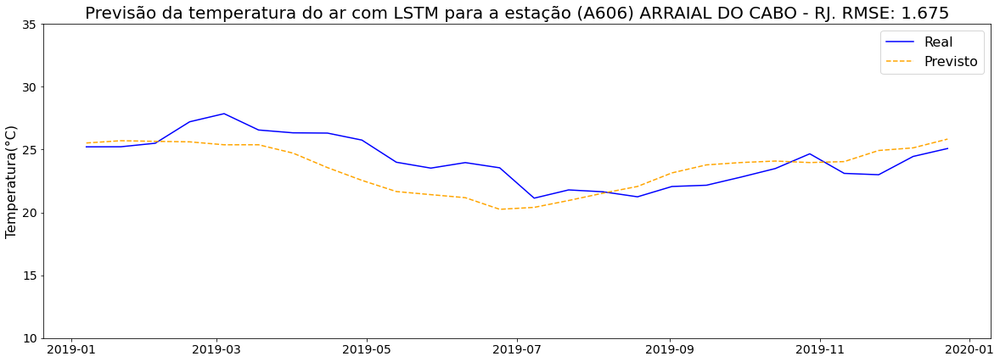

Station: (A523) PATROCINIO - MG


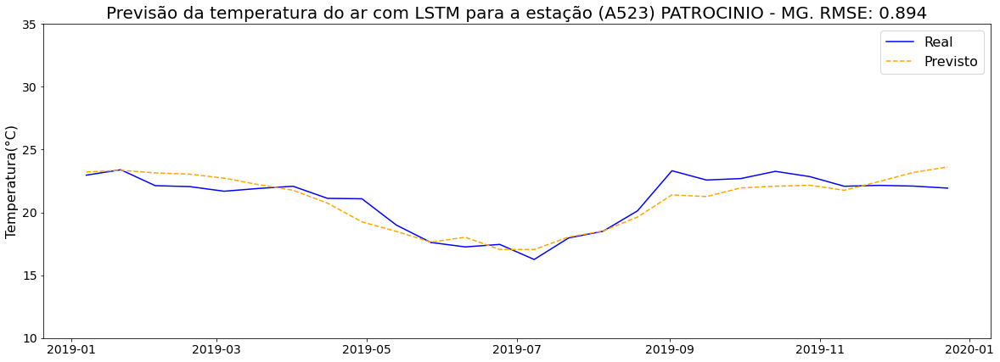

Station: (A823) INACIO MARTINS - PR


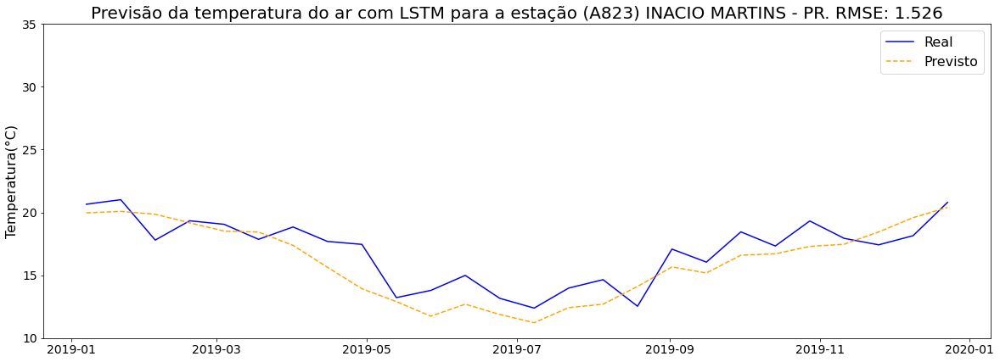

Station: (A227) SOURE - PA


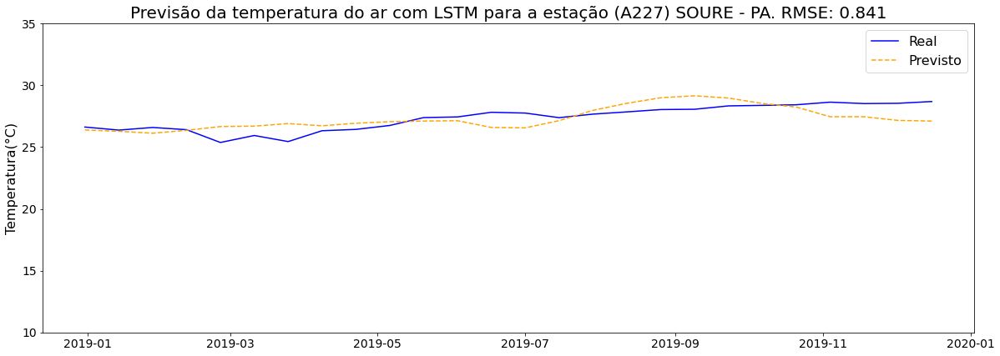

Station: (83907) SAO LUIZ GONZAGA - RS


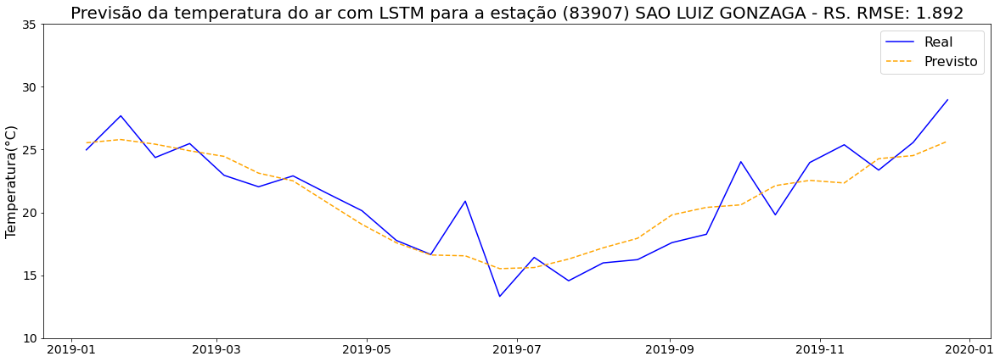

Station: (83592) CARATINGA - MG


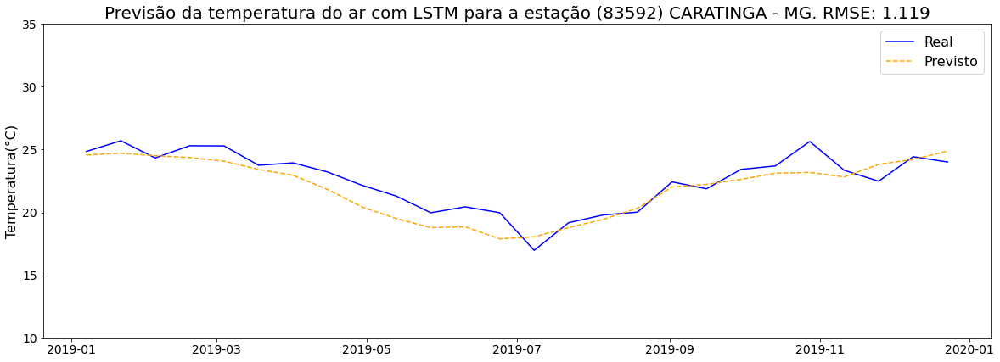

Station: (82336) ITACOATIARA - AM


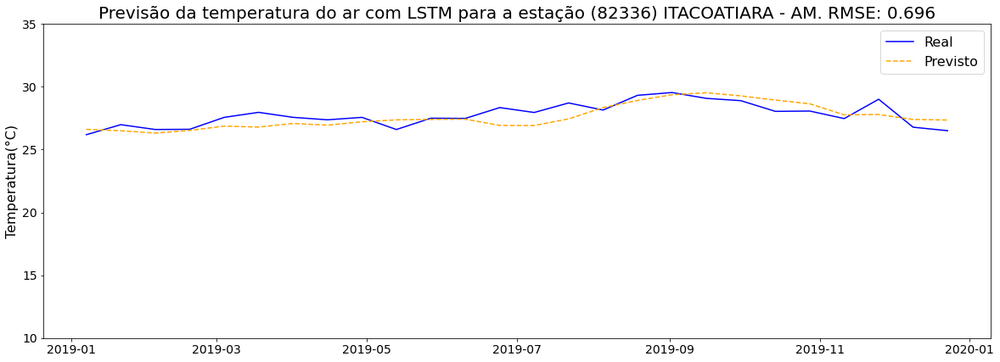

Station: (83470) RIO VERDE - GO


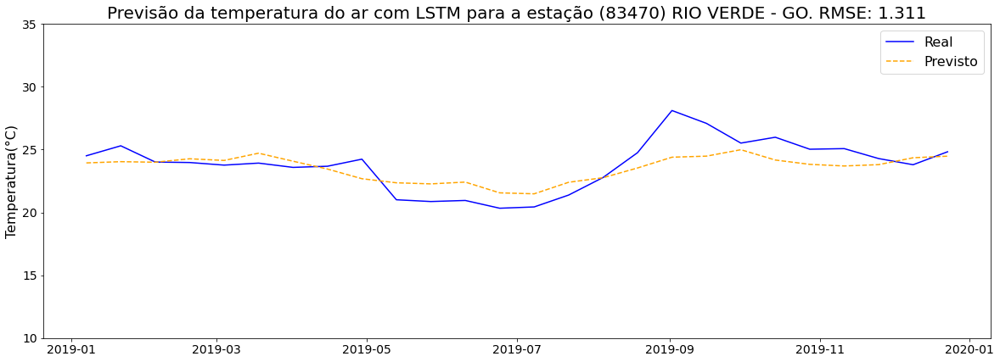

Station: (82915) RIO BRANCO - AC


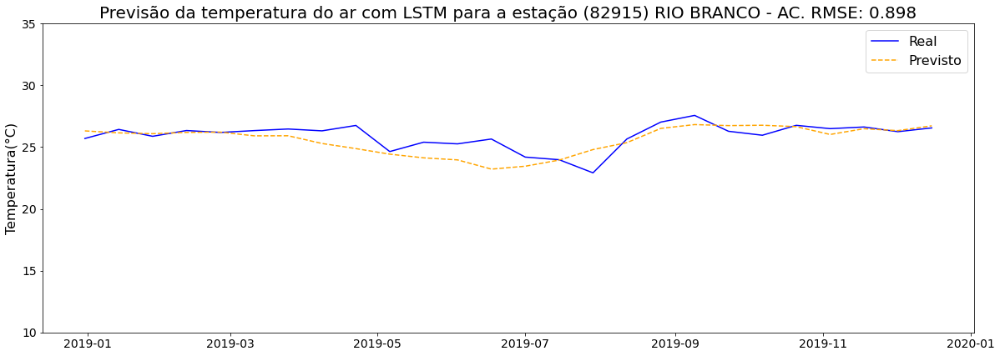

Station: (82795) CAMPINA GRANDE - PB


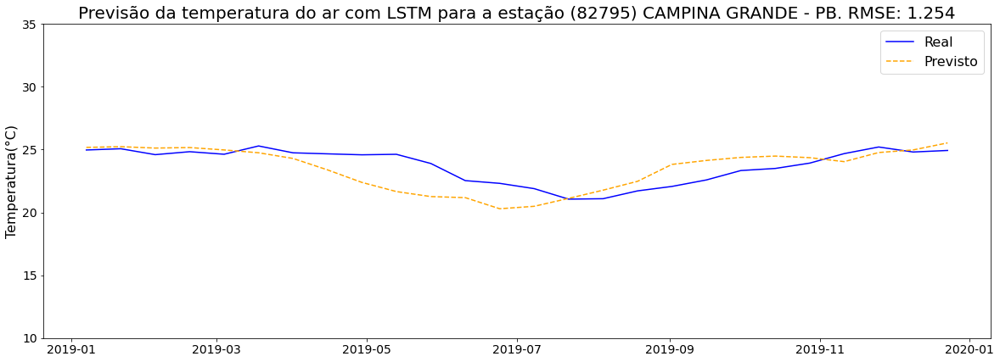

Station: (83936) SANTA MARIA - RS


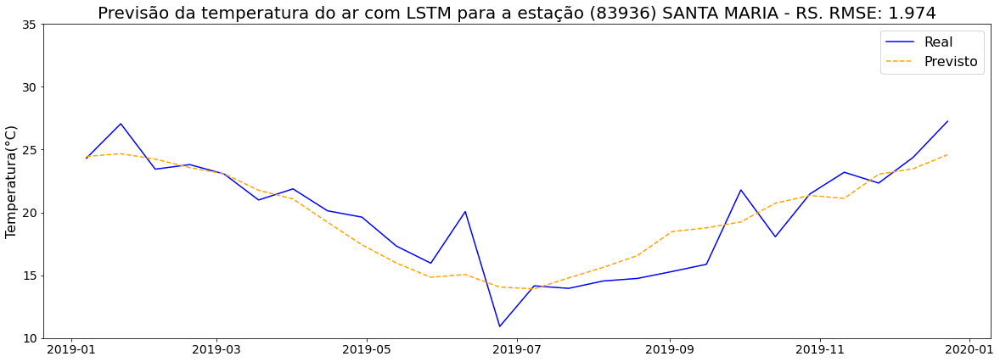

Station: (83842) CURITIBA - PR


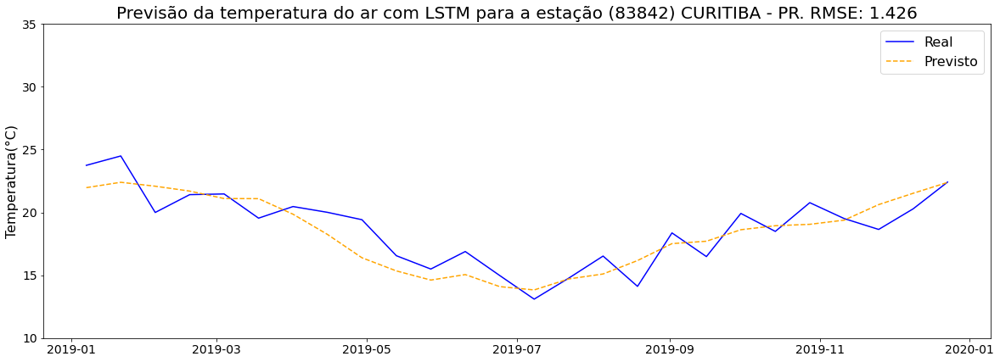

Station: (83332) POSSE - GO


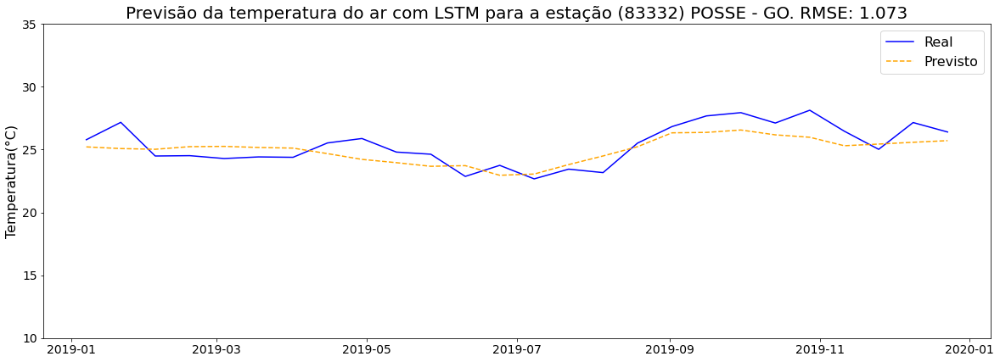

Station: (82994) MACEIO - AL


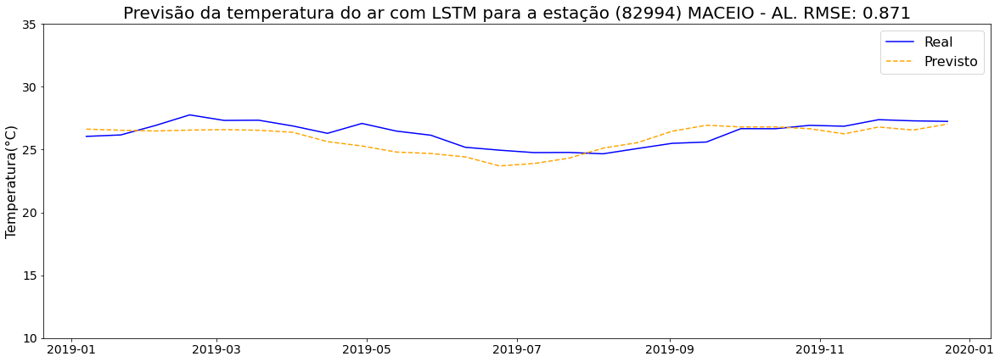

Station: (83844) PARANAGUA - PR


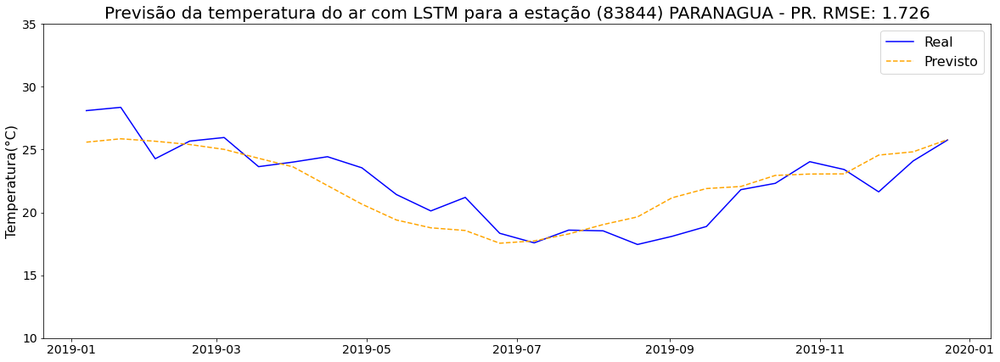

Station: (83361) CUIABA - MT


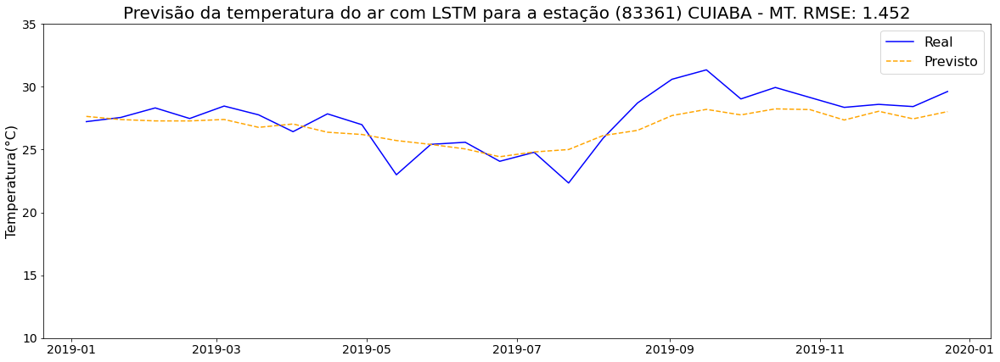

Station: (82807) TARAUACA - AC


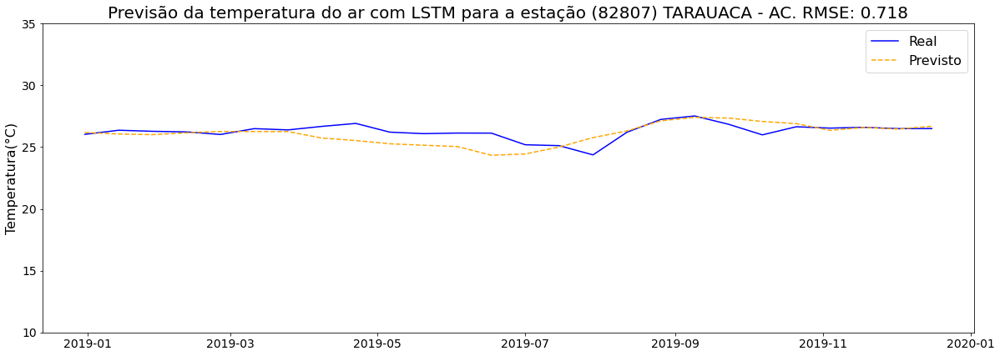

Station: (83464) JATAI - GO


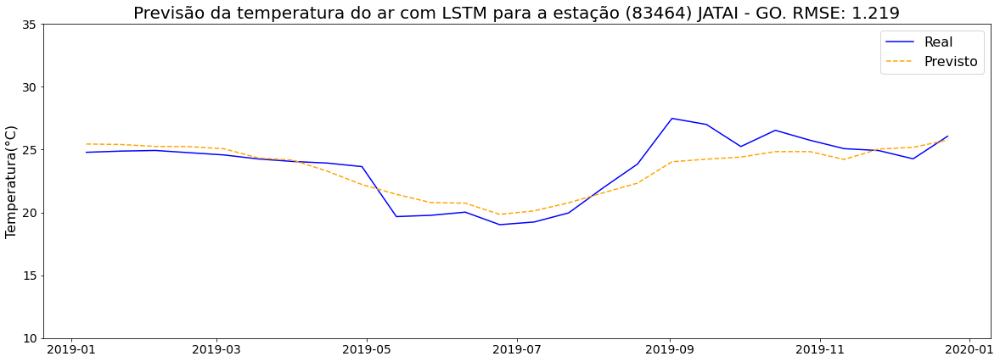

Station: (82791) PATOS - PB


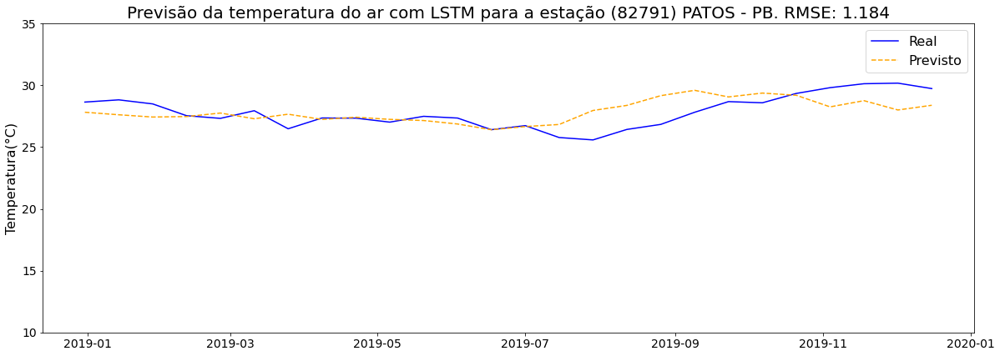

Station: (82445) ITAITUBA - PA


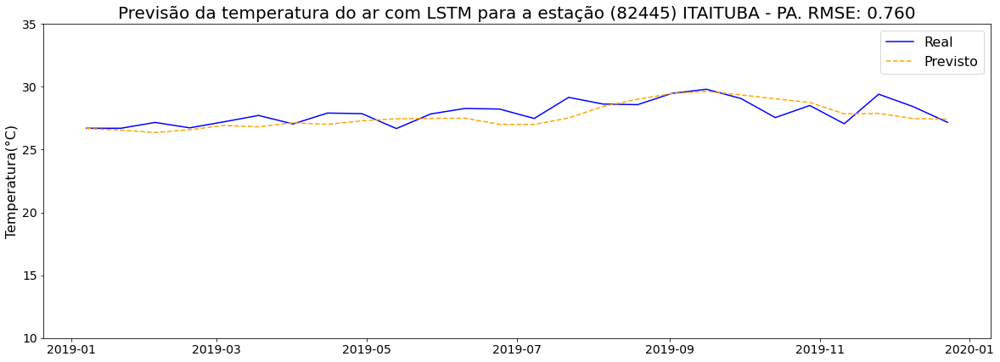

Station: (83781) SAO PAULO MIR de SANTANA  - SP


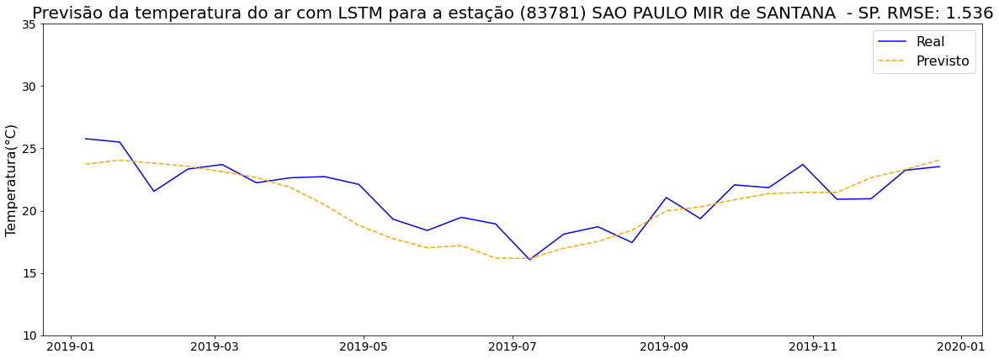

Station: (82683) TAUA - CE


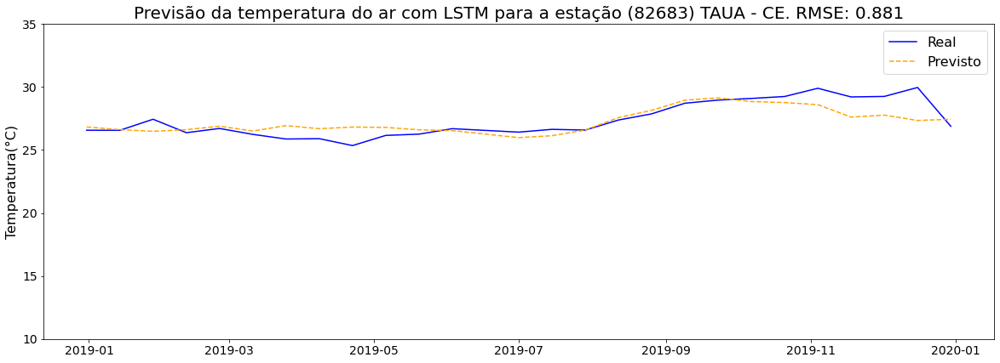

Station: (A311) FLORIANO - PI


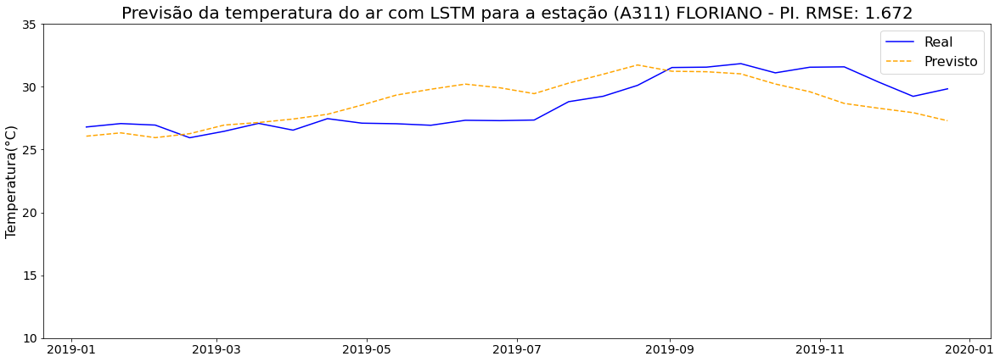

Station: (A119) MANACAPURU - AM


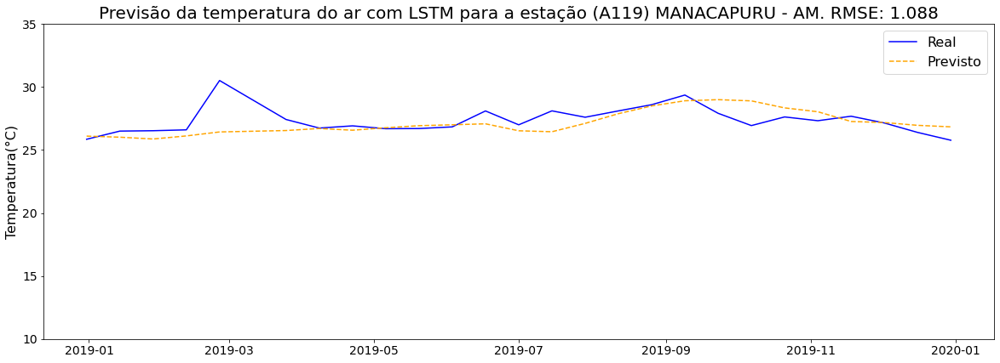

Station: (A906) GUARANTA DO NORTE - MT


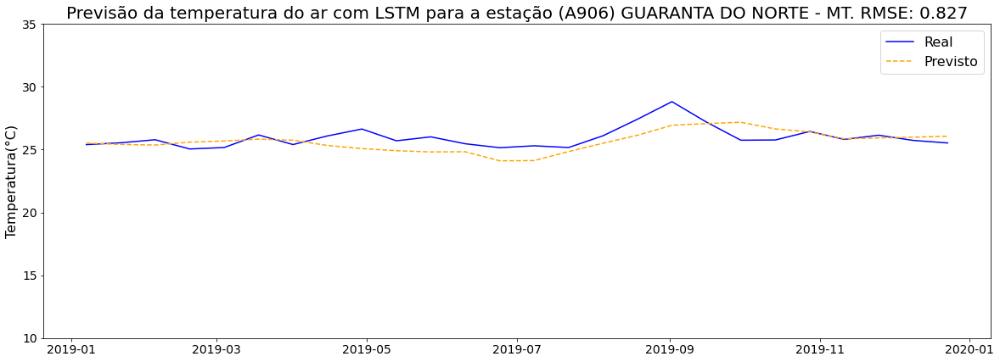

Station: (A422) ABROLHOS - BA


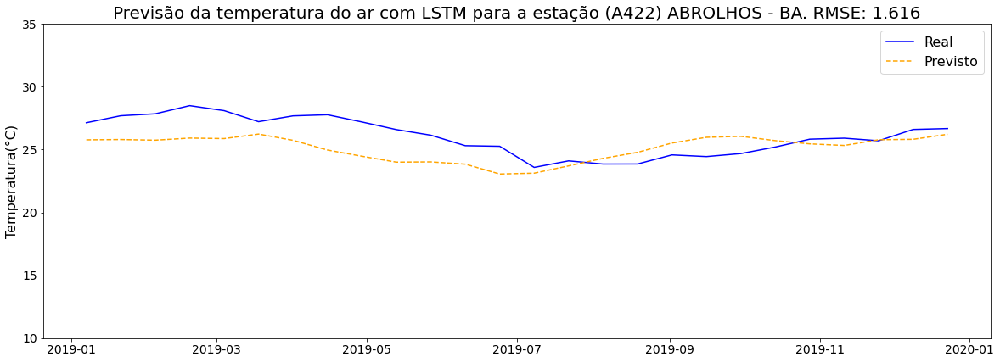

Station: (A045) AGUAS EMENDADAS - DF


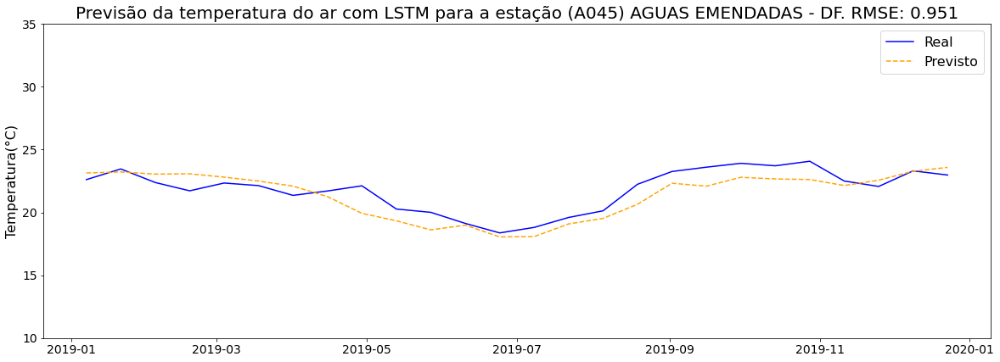

Station: (A316) CAICO - RN


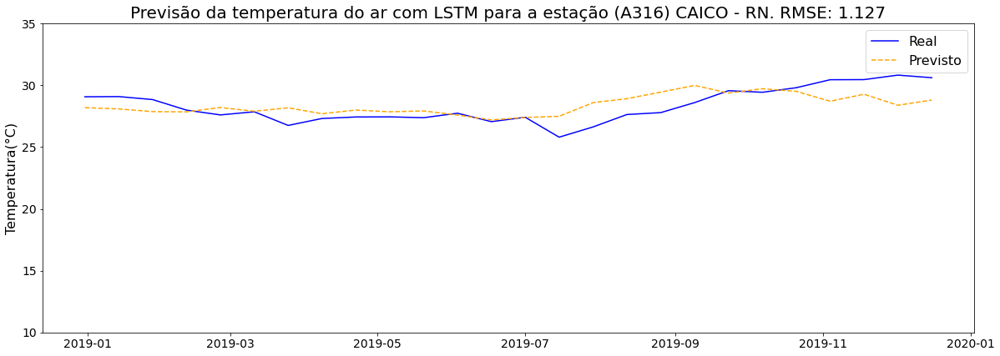

Station: (A032) MONTE ALEGRE DE GOIAS - GO


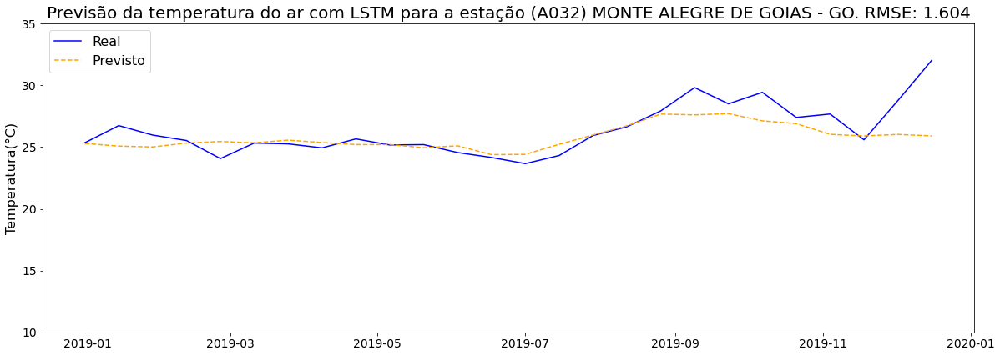

Station: (A936) SALTO DO CEU - MT


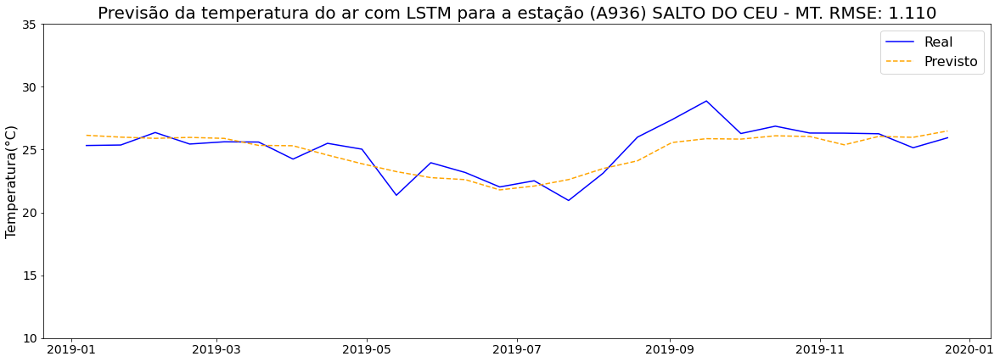

Station: (A420) CARIRA - SE


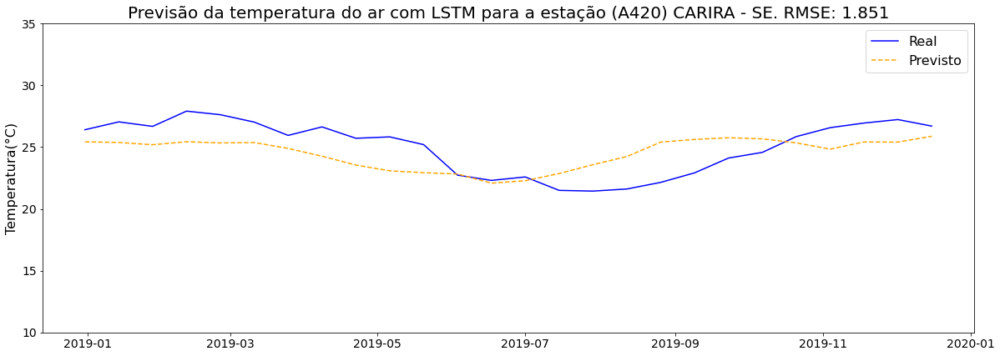

Station: (A204) BALSAS - MA


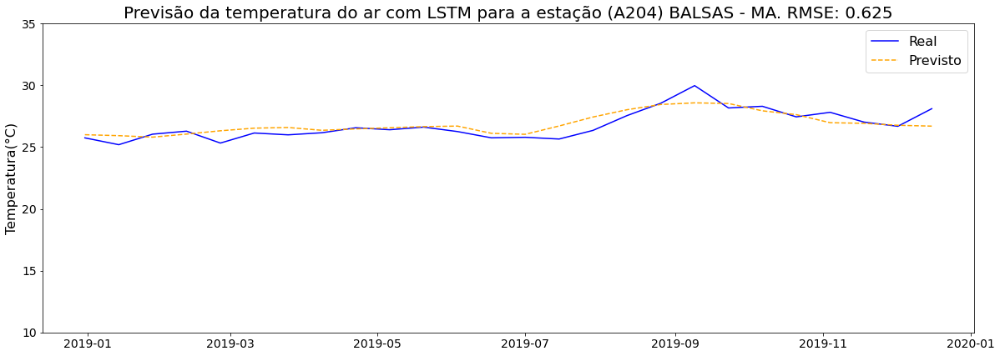

Station: (A916) QUERENCIA - MT


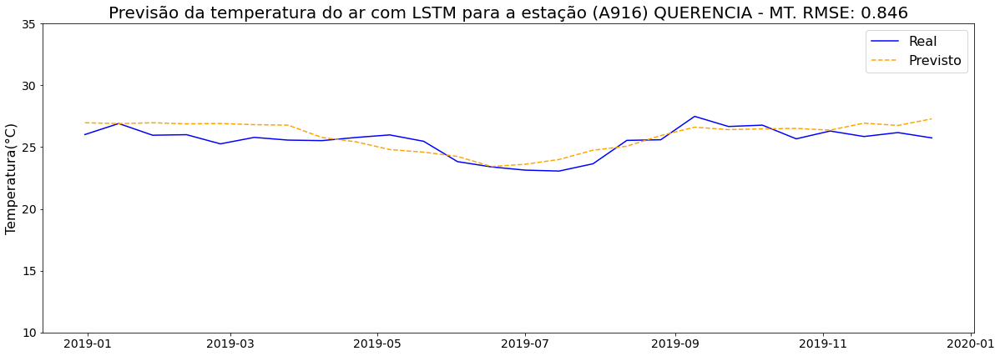

Station: (A748) BARRETOS - SP


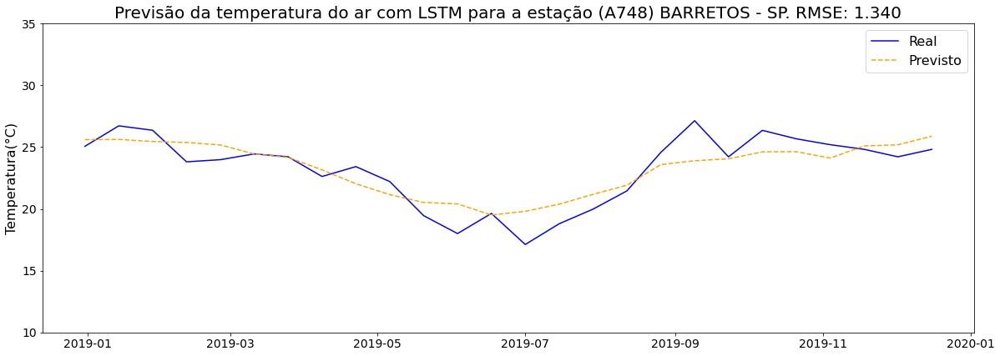

Station: (A609) RESENDE - RJ


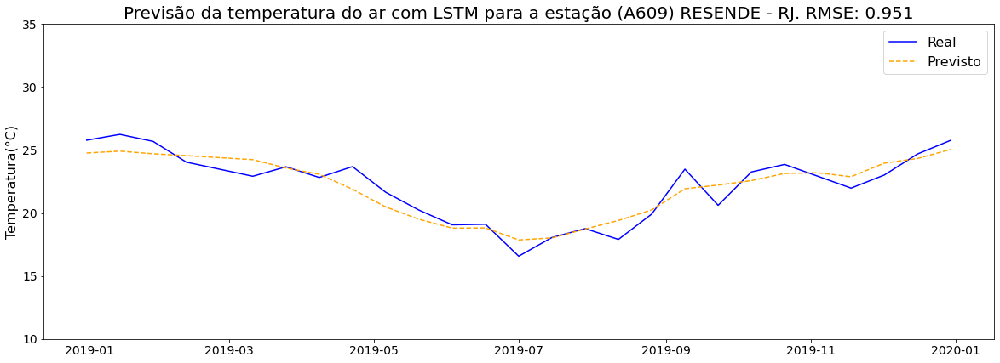

Station: (A332) MORADA NOVA - CE


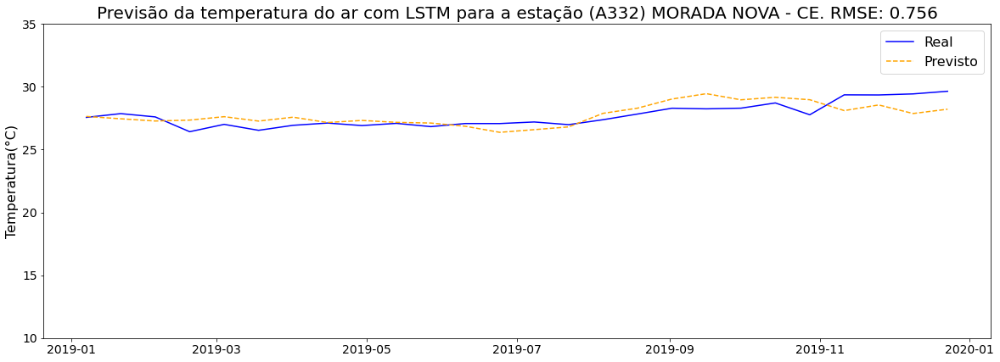

Station: (A308) PARNAIBA - PI


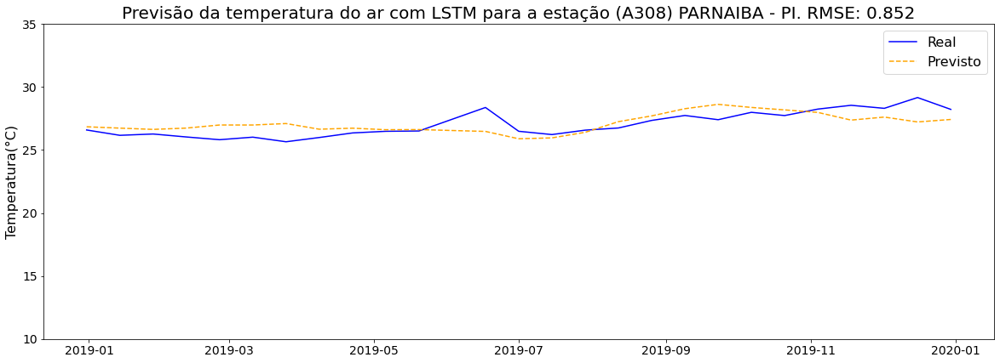

Station: (A929) NOVA UBIRATA - MT


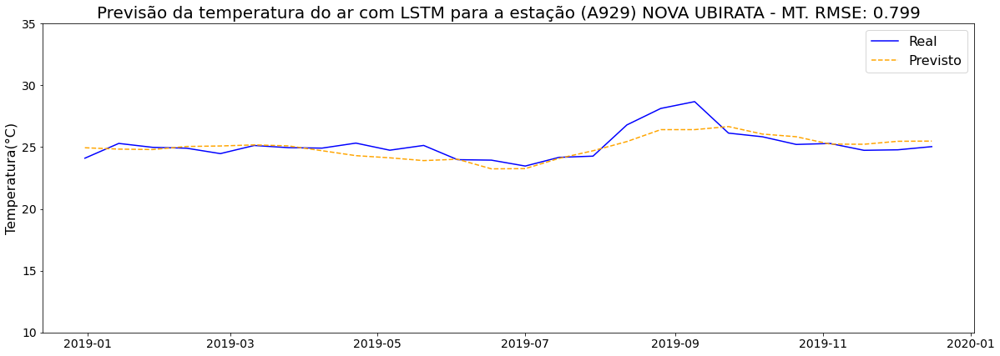

Station: (A014) GOIAS - GO


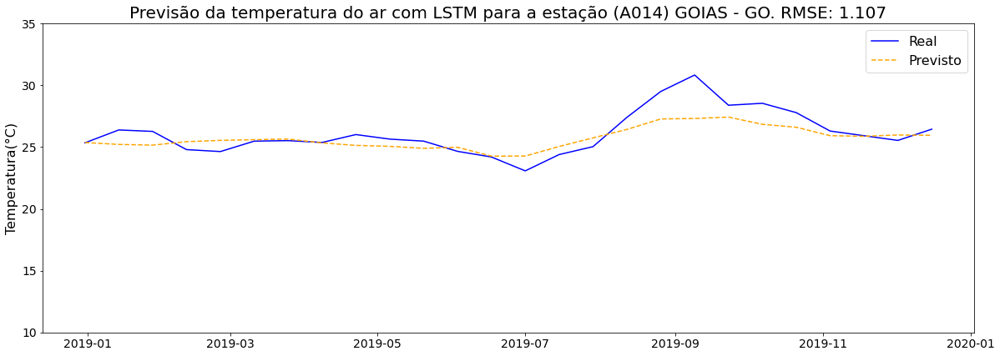

Station: (A720) COXIM - MS


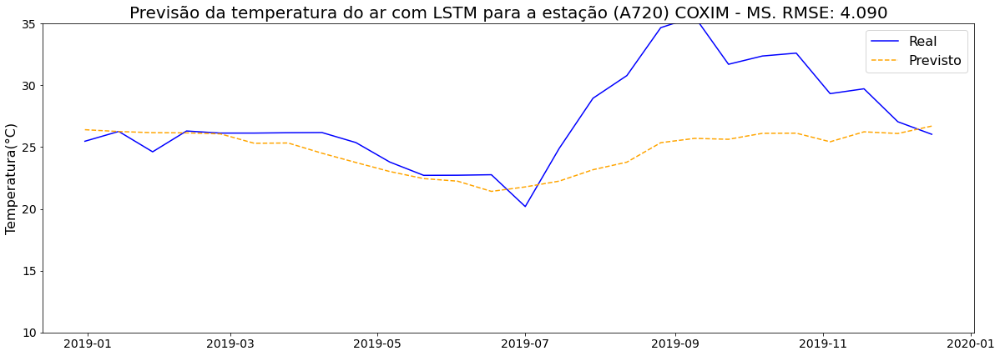

Station: (A430) PIATA - BA


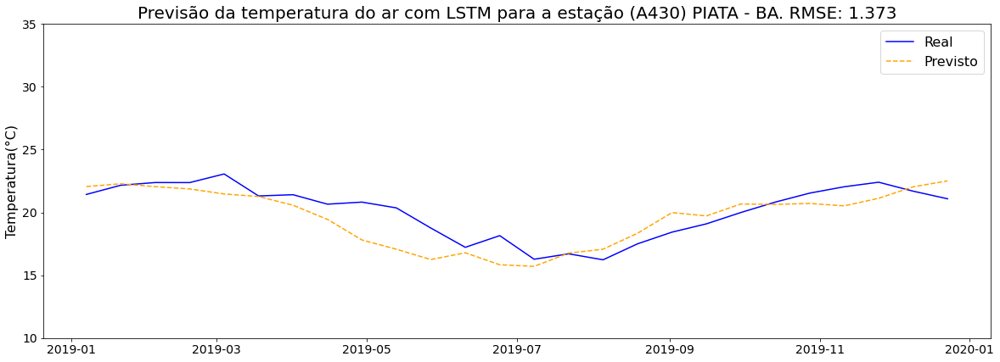

Station: (A848) DIONISIO CERQUEIRA - SC


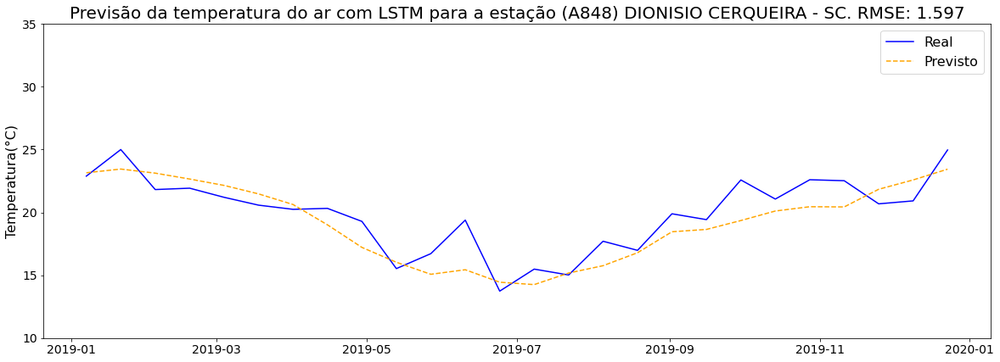

Station: (A524) FORMIGA - MG


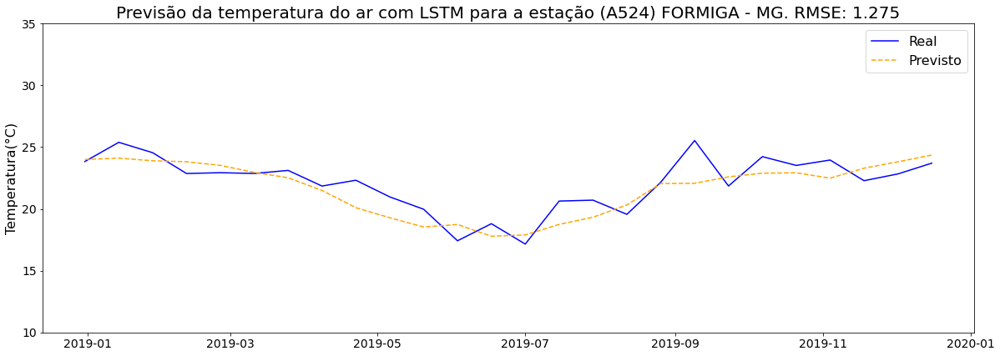

Station: (A023) CAIAPONIA - GO


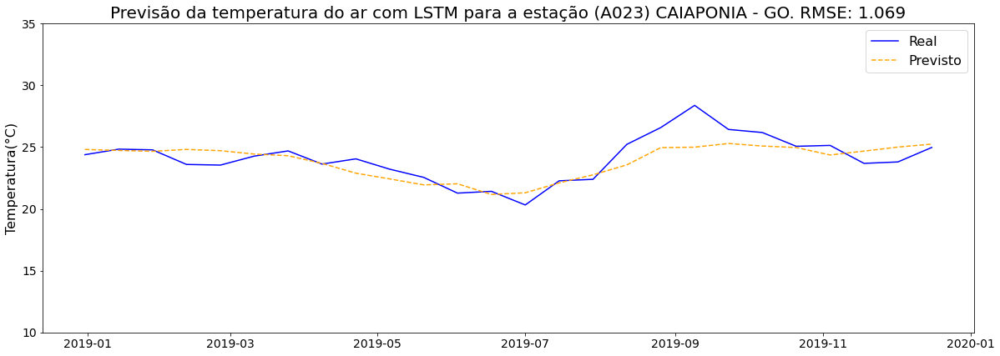

Station: (A328) SURUBIM - PE


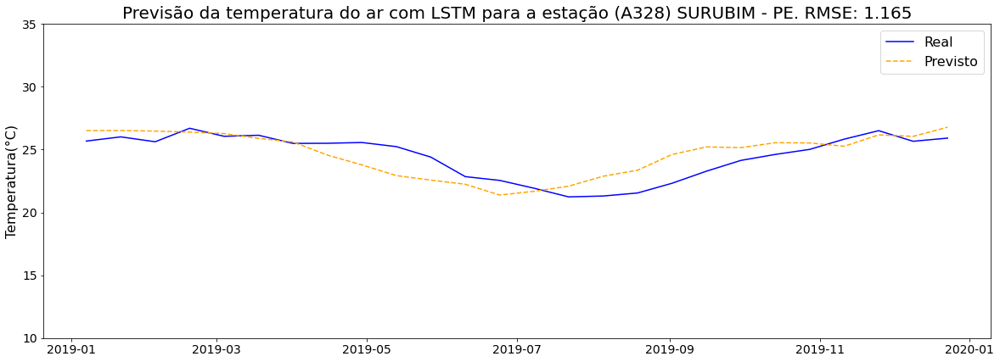

Station: (A424) IRECE - BA


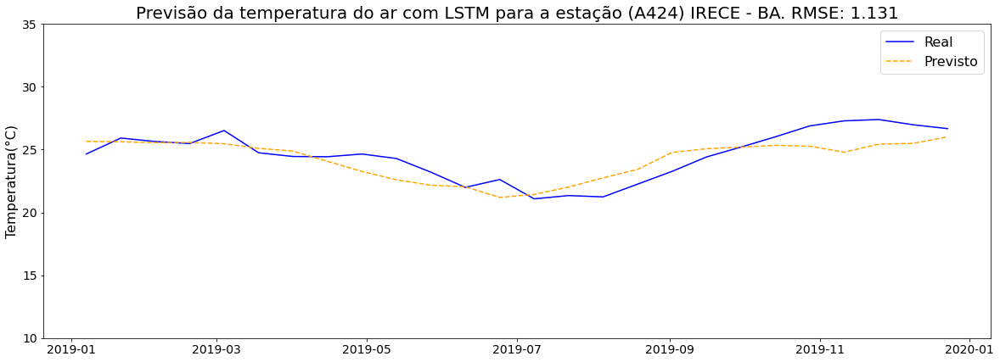

Station: (A003) MORRINHOS - GO


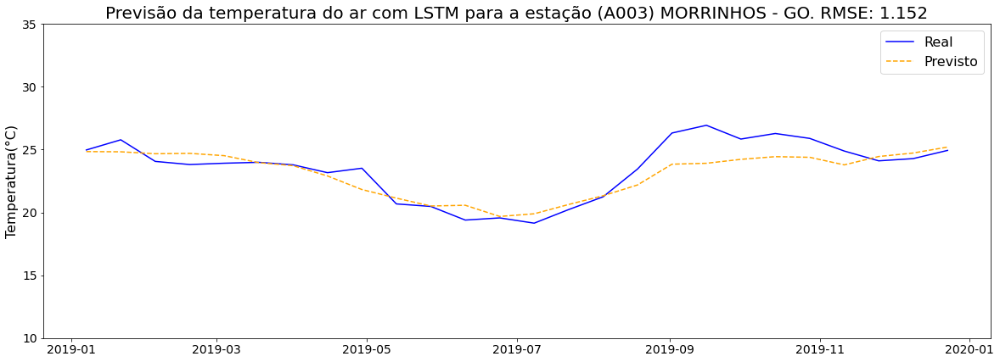

Station: (A532) GOVERNADOR VALADARES - MG


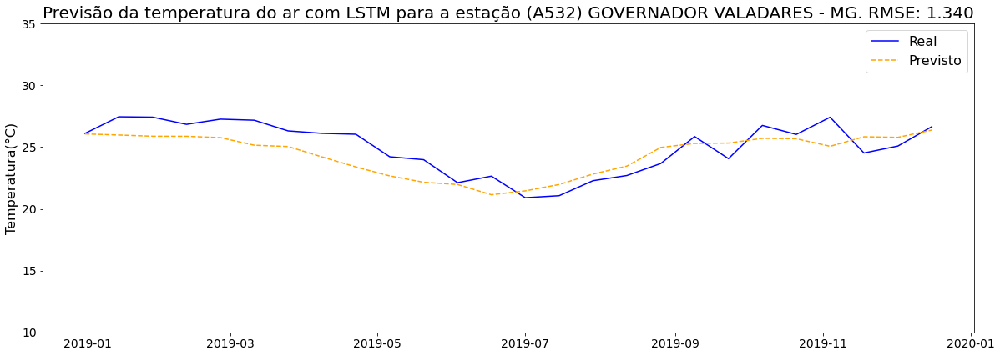

Station: (A516) PASSOS - MG


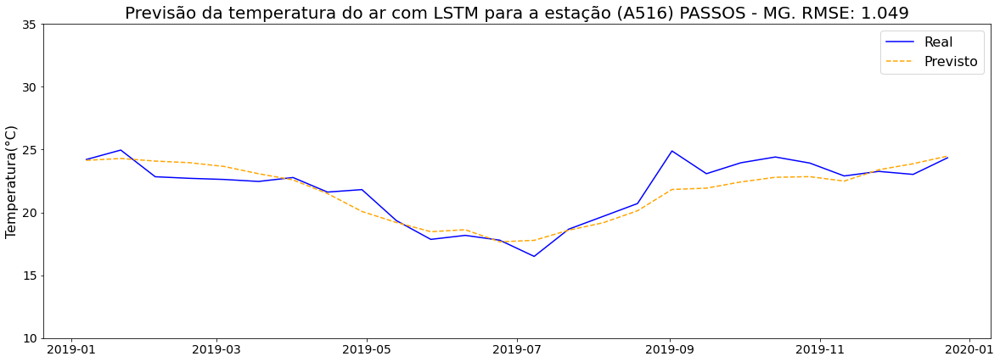

Station: (A444) VALENCA - BA


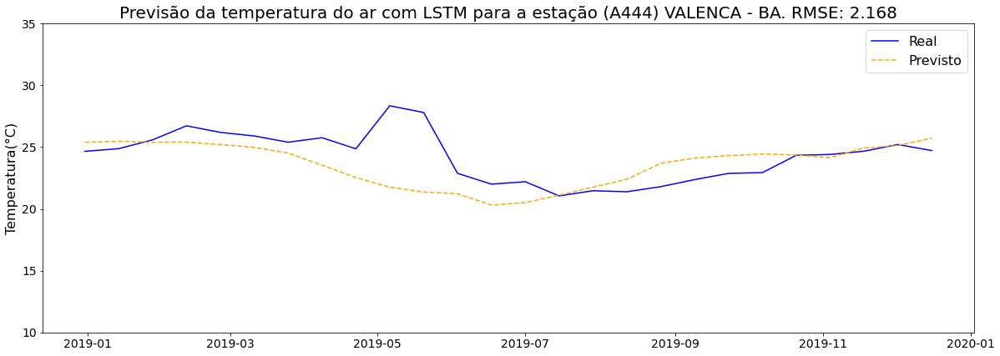

Station: (A816) NOVO HORIZONTE - SC


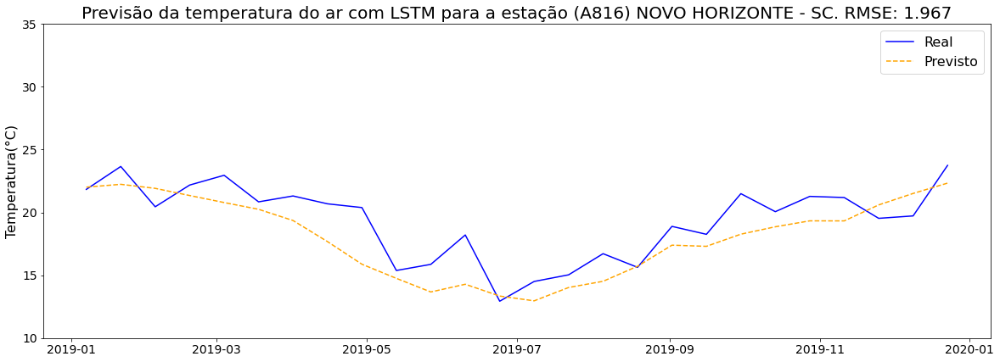

Station: (A749) JUTI - MS


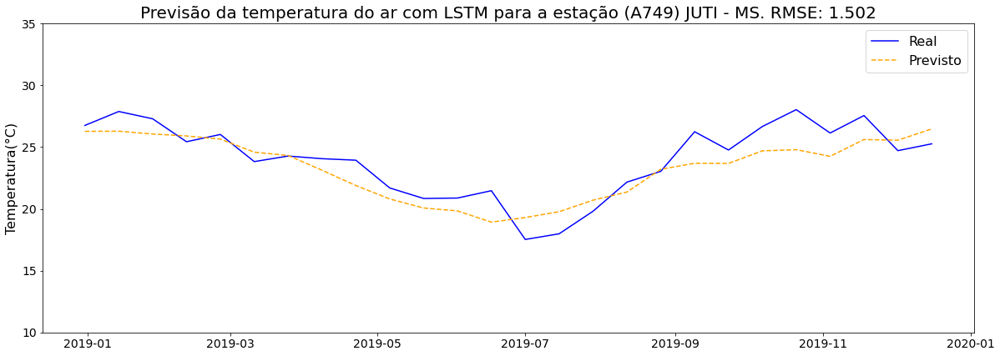

Station: (A615) ALFREDO CHAVES - ES


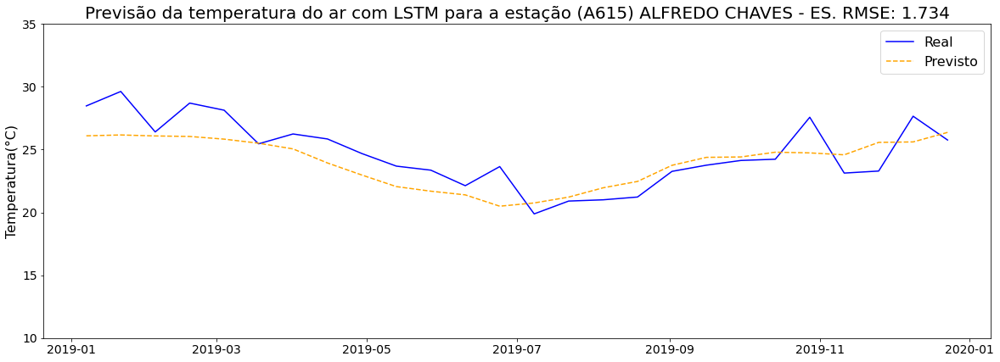

Station: (A433) BRUMADO - BA


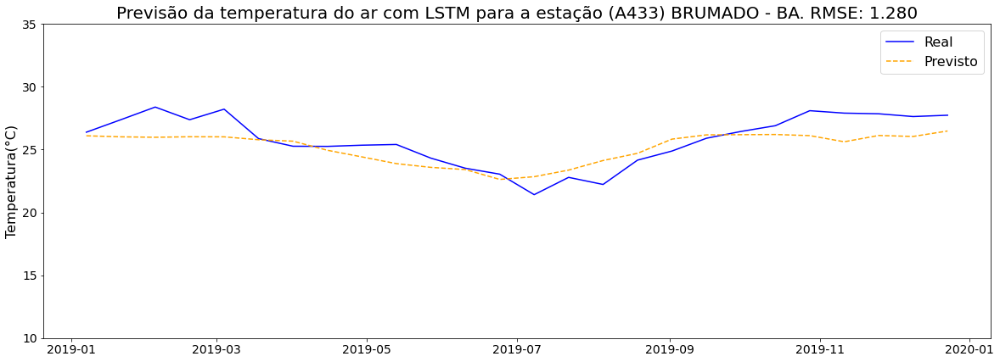

Station: (A845) BOM JARDIM DA SERRA - MORRO DA IGREJA - SC


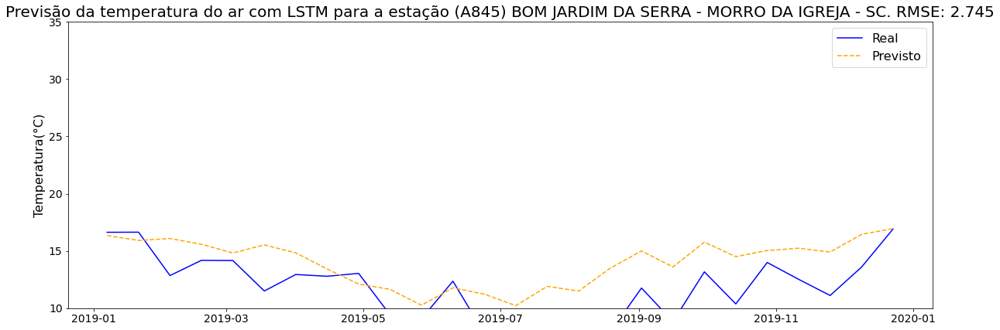

Station: (A802) RIO GRANDE - RS


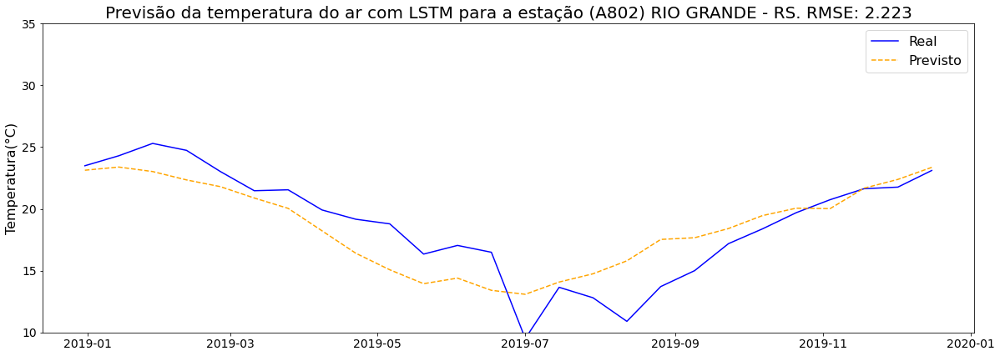

Station: (A017) POSSE - GO


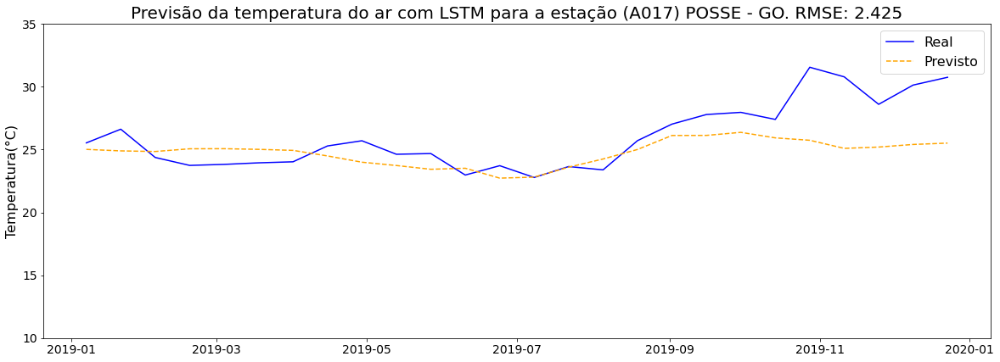

Station: (A829) SAO JOSE DOS AUSENTES - RS


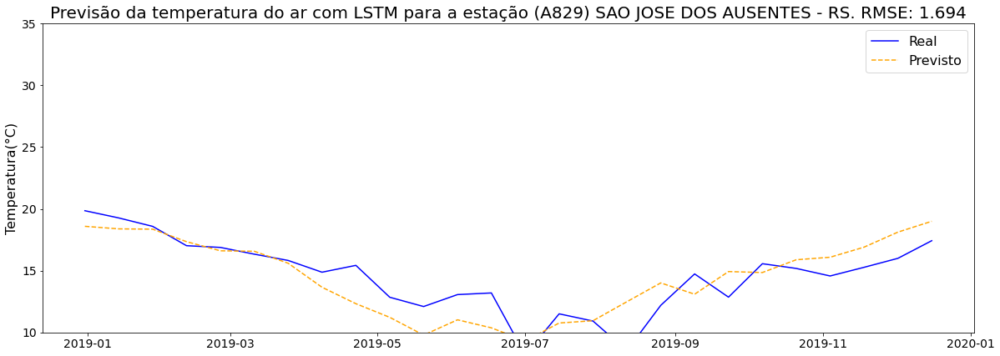

Station: (A052) SANTA ROSA DO TOCANTINS - TO


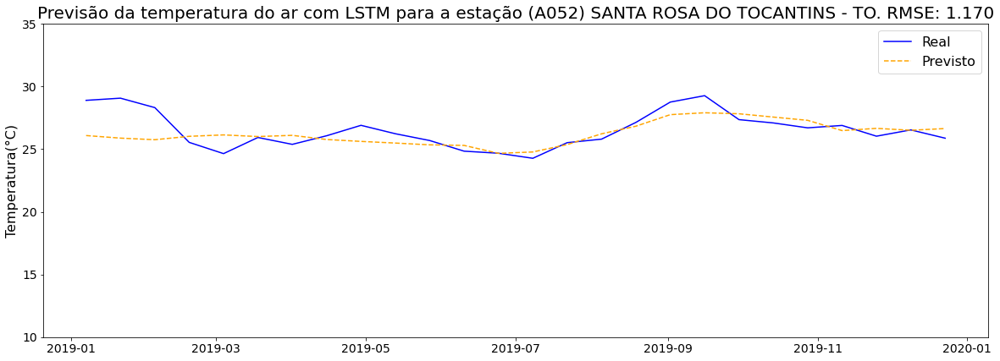

Station: (A826) ALEGRETE - RS


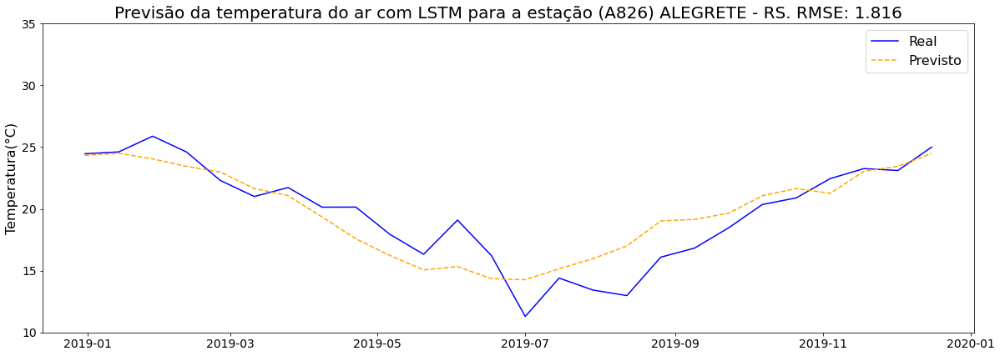

Station: (A659) SILVA JARDIM - RJ


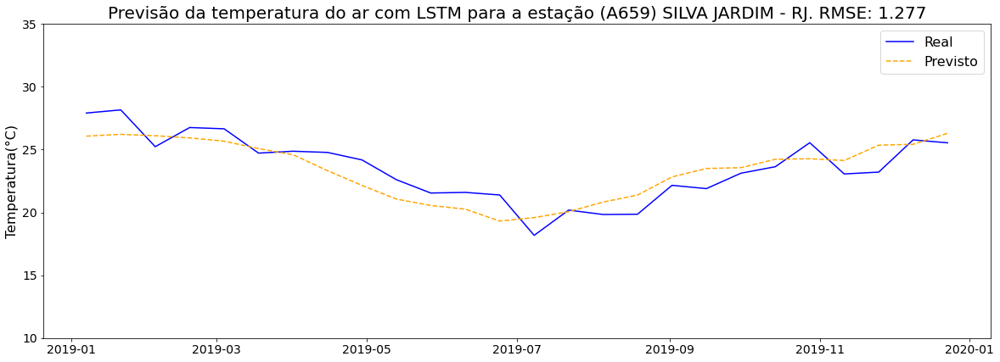

Station: (A428) SENHOR DO BONFIM - BA


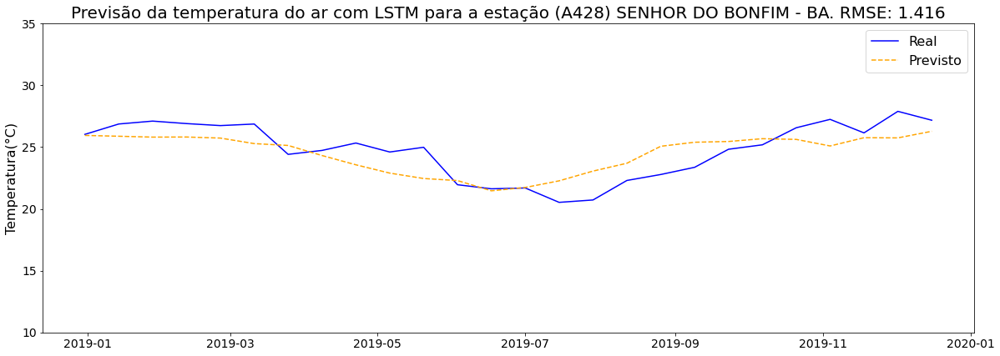

Station: (A043) CAMPOS LINDOS - TO


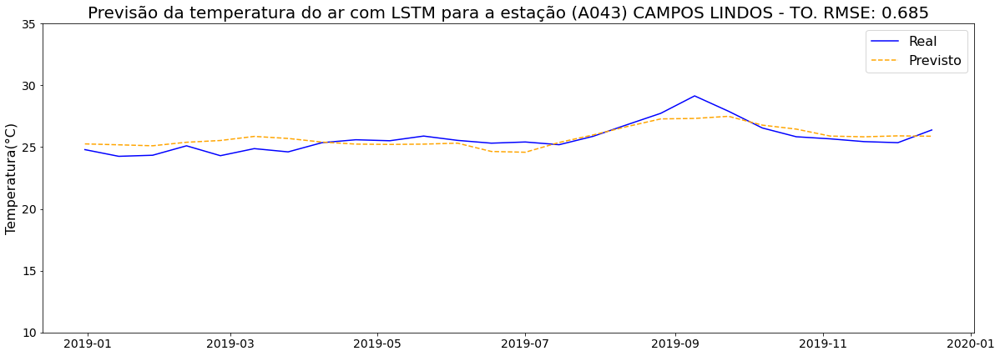

Station: (A762) DRACENA - SP


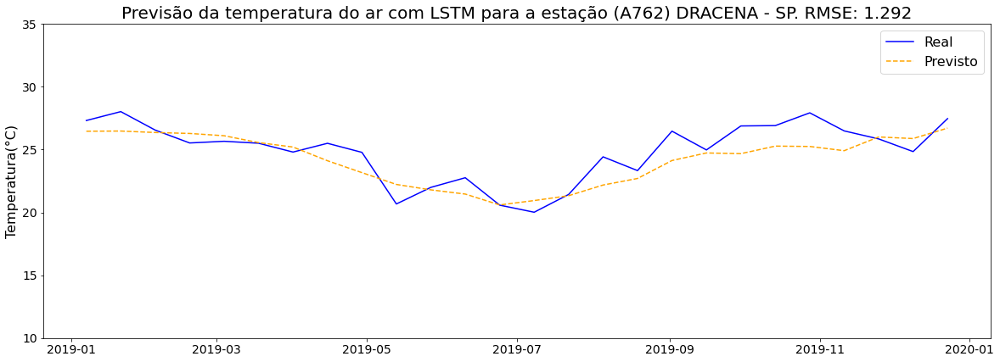

Station: (82723) LABREA - AM


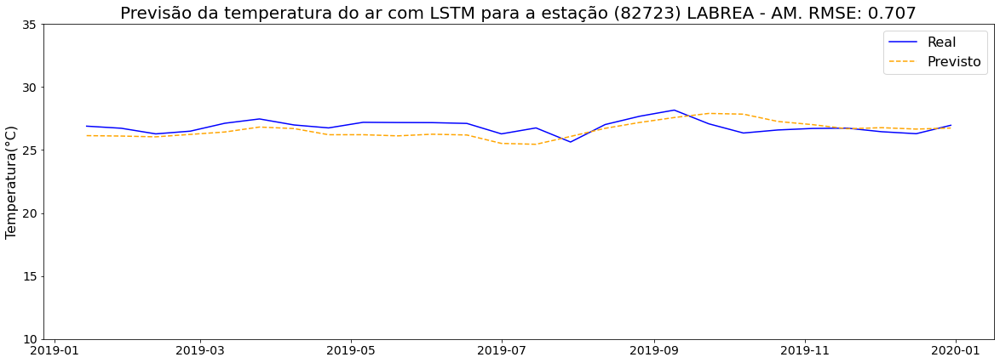

Station: (82376) ZE DOCA - MA


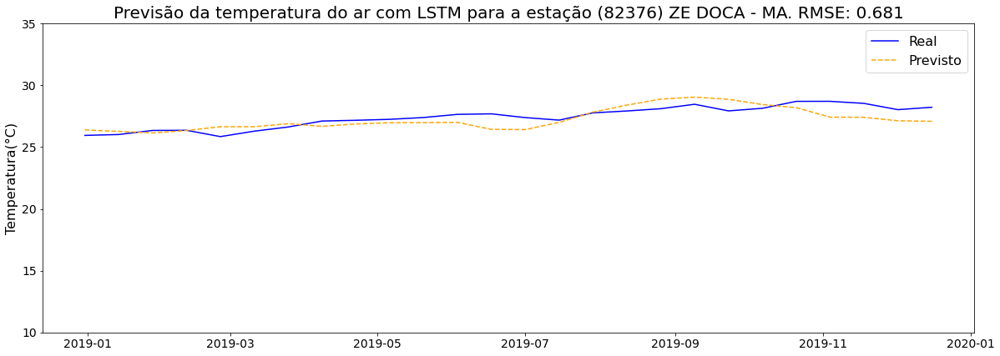

Station: (82690) SERIDO  CAICO  - RN


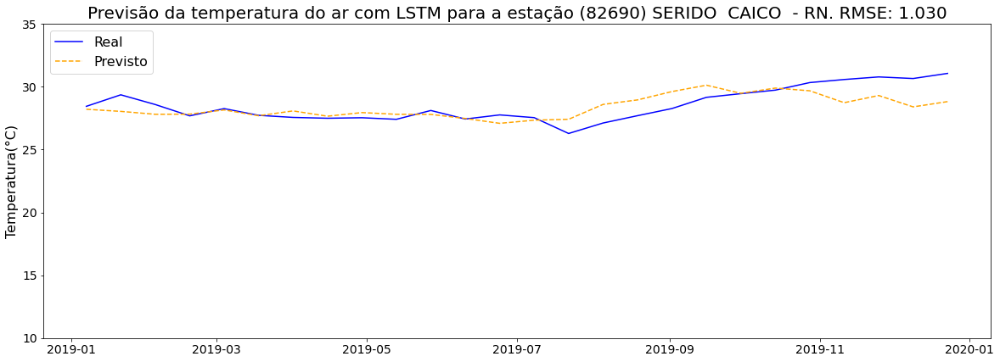

Station: (83919) BOM JESUS - RS


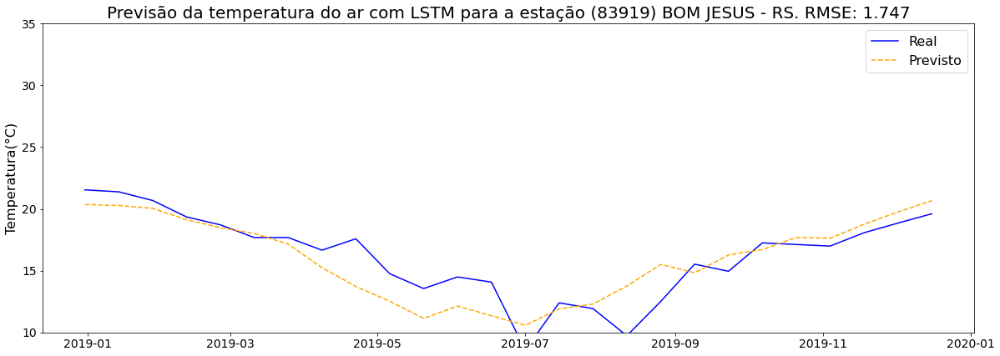

Station: (83687) LAVRAS - MG


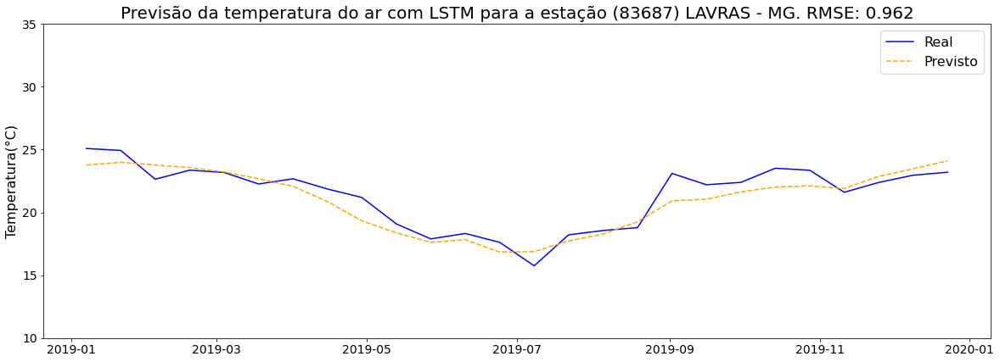

Station: (82689) SAO GONCALO - PB


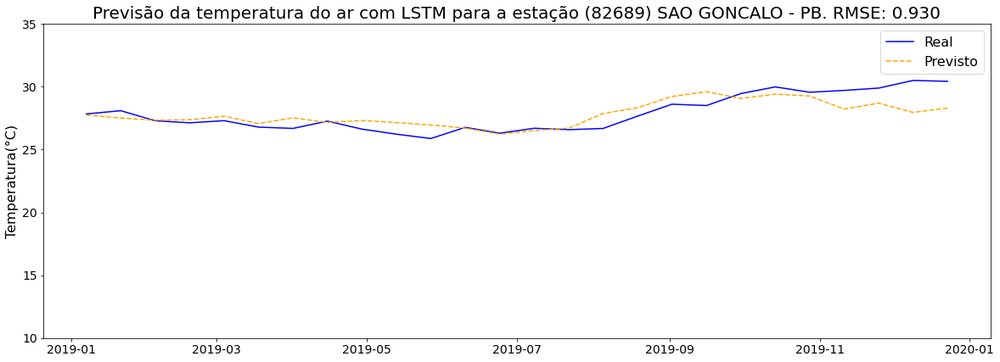

Station: (83522) IPAMERI - GO


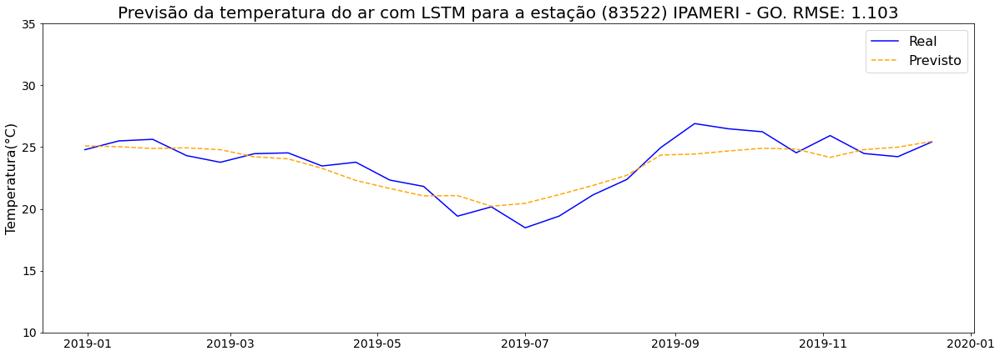

Station: (82753) OURICURI - PE


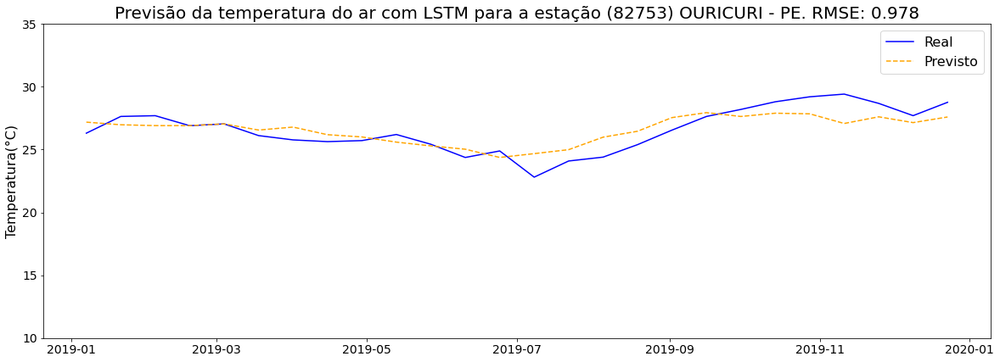

Station: (712f3e11658051636f09732a60fb3c1b) Petrolina – PE


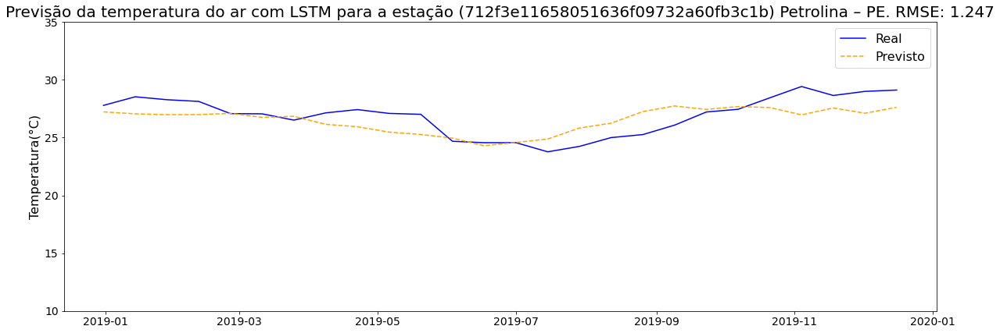

Modelos ajustados: 
Station: A732 RMSE: 1.1926976442337036
Station: A753 RMSE: 1.0851906538009644
Station: A734 RMSE: 1.2558341026306152
Station: A723 RMSE: 2.9642174243927
Station: A858 RMSE: 1.7291340827941895
Station: A612 RMSE: 1.5015721321105957
Station: A345 RMSE: 2.0968410968780518
Station: A866 RMSE: 2.689777374267578
Station: A830 RMSE: 1.763561725616455
Station: A931 RMSE: 1.1827452182769775
Station: A716 RMSE: 1.2588515281677246
Station: A882 RMSE: 2.127563714981079
Station: A525 RMSE: 1.2069708108901978
Station: A541 RMSE: 1.630332350730896
Station: A805 RMSE: 1.5349972248077393
Station: A606 RMSE: 1.6748270988464355
Station: A523 RMSE: 0.8943653106689453
Station: A823 RMSE: 1.52553391456604
Station: A227 RMSE: 0.8409256339073181
Station: 83907 RMSE: 1.8923617601394653
Station: 83592 RMSE: 1.1192774772644043
Station: 82336 RMSE: 0.6955789923667908
Station: 83470 RMSE: 1.3110188245773315
Station: 82915 RMSE: 0.8979339599609375
Station: 82795 RMSE: 1.254031777381897
Station: 

In [27]:
for station_code in stations_samples:
    station_title = get_station_short_title(station_code)
    print("Station:", station_title)
    
    train_data, test_data = ts_input_output_split(station_code, start_date_prediction, end_date_prediction)
    
    train_data_array = train_data.to_numpy()
    test_data_array = test_data.to_numpy()
    
    reescaled_train_data_array = scaler.transform(train_data_array.reshape((train_data_array.shape[0], 1)))
    
    lstm_input =  keras.preprocessing\
        .sequence\
        .pad_sequences([reescaled_train_data_array], maxlen=1500, dtype='float32')[0]
    
    lstm_input = lstm_input.reshape((1, lstm_input.shape[0], 1))

    lstm_predicted = lstm_model.predict(lstm_input)
    lstm_predicted = scaler.inverse_transform(lstm_predicted)

    expected_values = test_data[:26]
    predicted_values = lstm_predicted[0][:len(expected_values)]

    rmse, fitted_index = expected_vs_predicted(station_code, expected_values, predicted_values)

    plt.title("Previsão da temperatura do ar com LSTM para a estação %s. RMSE: %.3f" % (station_title, rmse, ), fontsize=20)
    plt.ylabel('Temperatura(°C)', fontsize=16)
    plt.xlabel(None)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(['Real', 'Previsto'], fontsize=16)
    
    plt.savefig('figures/results_lstm_{code}.png'.format(code=station_code), dpi=300, bbox_inches='tight')
    plt.show()
    
    lstm_saved_models[station_code] = {
        'rmse': rmse
    }

print("Modelos ajustados: ")
for s in lstm_saved_models.keys():
    print("Station: {code} RMSE: {rmse}".format(code=s, rmse=lstm_saved_models[s]['rmse']))
    
print("Global RMSE:", np.mean(list(map(lambda x: x.get('rmse'), lstm_saved_models.values()))))

# Comparação dos resultados

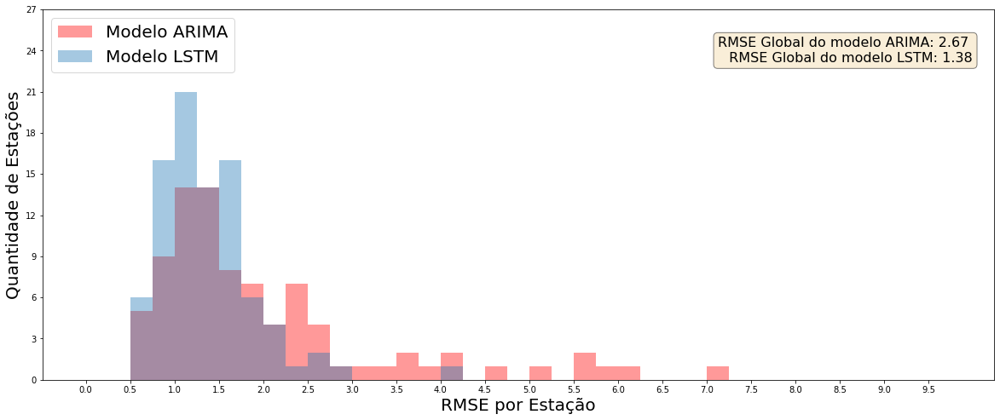

In [33]:
#lstm_rmse = [1.3741166591644287, 1.3002153635025024, 1.4249988794326782, 3.3395442962646484, 1.7104963064193726, 1.5731958150863647, 1.9757198095321655, 1.6842325925827026, 2.0108988285064697, 1.7205157279968262, 1.3965365886688232, 2.1525180339813232, 1.5150303840637207, 1.8287943601608276, 1.5629582405090332, 1.7659260034561157, 1.395174503326416, 1.7254875898361206, 0.9663741588592529, 2.0799050331115723, 1.2002761363983154, 0.9524598717689514, 1.5082988739013672, 0.8892889022827148, 1.2609539031982422, 2.087785482406616, 1.511448621749878, 1.2597459554672241, 0.8296915888786316, 1.8303053379058838, 1.611433744430542, 0.8058569431304932, 1.4812499284744263, 1.1206823587417603, 0.9896935224533081, 1.6361448764801025, 1.058464765548706, 1.394715666770935, 1.182987093925476, 1.2378997802734375, 1.592260479927063, 1.6800212860107422, 1.1860690116882324, 1.676552414894104, 1.2139742374420166, 1.4770524501800537, 0.8224636912345886, 0.7033692002296448, 1.5113340616226196, 0.9873851537704468, 0.755348265171051, 0.8949379920959473, 1.3748056888580322, 1.4538779258728027, 4.273186206817627, 1.6462409496307373, 1.6505863666534424, 1.5397840738296509, 1.5052796602249146, 1.1618049144744873, 1.060956358909607, 1.4584753513336182, 1.2132457494735718, 1.3548349142074585, 2.2067534923553467, 2.004070520401001, 1.6387884616851807, 1.7815934419631958, 1.1884700059890747, 3.6316115856170654, 2.2489657402038574, 2.442843437194824, 1.9780418872833252, 1.1960320472717285, 1.8466356992721558, 1.39027738571167, 1.2710150480270386, 1.3379123210906982, 1.293884038925171, 0.9209825396537781, 0.9045877456665039, 1.1193791627883911, 1.6700488328933716, 1.2253742218017578, 1.0704923868179321, 1.2488797903060913, 1.0718064308166504, 1.2395864725112915]
arima_rmse = [1.1335533185272995, 1.4382047739828827, 1.7274711317303597, 2.6660146429262634, 6.056224350979586, 1.4214910888516865, 2.2976211943711884, 7.0146642358902005, 5.578862321231946, 1.036659509311904, 1.973051043011272, 2.6526989117615374, 1.3211624587505653, 1.0689636318795552, 5.836427297486497, 1.015626909076025, 1.2712905046726661, 3.967474426391901, 1.1815179108810698, 2.061175116824566, 1.5851092937838611, 0.984705798095302, 2.849031316491555, 1.0668403439924088, 0.6008118281345729, 2.209603124573024, 3.38991542258813, 1.4898009828901337, 0.5035261801664948, 3.554281238141456, 1.5204194250322336, 0.8859754317223631, 1.1412073058149426, 0.8495743911874888, 0.8610506474889633, 1.4778525994214975, 2.483736528898112, 1.4509639179497846, 1.1211975627803026, 1.7574861866561242, 1.9968027217251372, 0.810926759296401, 1.0355227865330179, 2.1061888282797954, 1.953966640052878, 5.603352443363666, 0.9244428748060667, 2.372538969485085, 1.1458533862575109, 2.4798541166467967, 0.5859747425260788, 1.6052787896907004, 1.1214992191646946, 1.3645879091401758, 4.0533201918069475, 1.938246719929849, 2.6581002394357394, 1.2550379245175187, 1.0469102314743406, 0.8028928211133671, 2.0157622487912326, 0.9975615950790191, 1.3940854371369267, 1.2410573981196311, 1.3681212686997957, 1.833280989019048, 1.7173646457361547, 1.5405196440384707, 1.556629345172091, 4.0926084540306364, 4.516325416977014, 2.6233566033632028, 1.9112361266143458, 3.059369901911702, 5.074590847741051, 1.3695680924681575, 2.411146781676531, 3.5424800154727234, 58.5446342217203, 0.938200767442898, 0.7086455253158485, 0.6096402813813352, 2.374527177386318, 1.2834228427957708, 1.6685981193237298, 1.1694180663336584, 2.474229961040559, 1.4813891273435835]

#arima_rmse = list(map(lambda x: x.get('rmse'), arima_saved_models.values()))
lstm_rmse = list(map(lambda x: x.get('rmse'), lstm_saved_models.values()))

plt.figure(figsize=(20,8))
plt.hist(arima_rmse,  bins = np.arange(0, 10, 0.25), alpha=0.4, label='Modelo ARIMA', color='red')
plt.hist(lstm_rmse,  bins = np.arange(0, 10, 0.25), alpha=0.4, label='Modelo LSTM')

#plt.title("Resultado da previsão de temperatura média do ano de 2019 utilizando o modelo LSTM", fontsize=20)

plt.ylabel('Quantidade de Estações', fontsize=20)
plt.xlabel('RMSE por Estação', fontsize=20)
plt.xticks(np.arange(0, 10, 0.5))
plt.yticks(np.arange(0, 30, 3))
plt.legend(loc='upper left', fontsize=20)

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# place a text box in upper left in axes coords
plt.text(10, 25, "RMSE Global do modelo ARIMA: %.2f \n RMSE Global do modelo LSTM: %.2f" % (np.mean(arima_rmse), np.mean(lstm_rmse)), fontsize=16, verticalalignment='top', horizontalalignment='right', bbox=props)
plt.savefig('figures/comparacao_rmse_arima_lstm_histograma.png', dpi=300, bbox_inches='tight')